# Master Thesis DSS
## Thesis topic: Forecasting Green Bond Issuance

Nhi Tran 2077737 – Msc DSS Tilburg University
Supervisor - Dr. Gonzalo Nápoles 

# 1. EDA 

## 1.1  Loading packages and dataset(s)

The dataset is retrieved from Refinitiv Eikon Asset/4 a so 09/10/2022 via the App Government and Corporate Bonds with the following criteria's 
* Asset Class: Corporate
* Instrument Type: Bond
* Asset Status: Active and Issued

The dataset is loaded with pandas. EDA is performed using pandas, matplotlib and seaborn.

In [1]:
import os
from IPython.display import display
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from pylab import rcParams
import time
from scipy import stats
from sklearn import preprocessing
from sklearn.model_selection import train_test_split, RandomizedSearchCV, GridSearchCV, KFold, cross_val_score
from sklearn.linear_model import Ridge, LinearRegression
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
import xgboost as xgb
import optuna.integration.lightgbm as lgb
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score, make_scorer
from scipy.spatial.distance import mahalanobis
import optuna.integration.lightgbm as lgb
import optuna
import pingouin as pg

C:\Users\nhiii\anaconda3\lib\site-packages\outdated\utils.py:14: OutdatedPackageWarning: The package pingouin is out of date. Your version is 0.5.2, the latest is 0.5.3.
Set the environment variable OUTDATED_IGNORE=1 to disable these warnings.
  return warn(


In [2]:
pd.set_option('display.max_colwidth', None)

In [3]:
print(plt.style.available)

['Solarize_Light2', '_classic_test_patch', '_mpl-gallery', '_mpl-gallery-nogrid', 'bmh', 'classic', 'dark_background', 'fast', 'fivethirtyeight', 'ggplot', 'grayscale', 'seaborn', 'seaborn-bright', 'seaborn-colorblind', 'seaborn-dark', 'seaborn-dark-palette', 'seaborn-darkgrid', 'seaborn-deep', 'seaborn-muted', 'seaborn-notebook', 'seaborn-paper', 'seaborn-pastel', 'seaborn-poster', 'seaborn-talk', 'seaborn-ticks', 'seaborn-white', 'seaborn-whitegrid', 'tableau-colorblind10']


In [267]:
%matplotlib inline
rcParams['figure.figsize'] = 15, 10
plt.rcParams.update({'font.size': 16})
plt.rcParams["font.weight"] = "bold"
plt.rcParams["axes.labelweight"] = "bold"
plt.style.use('seaborn-whitegrid')

In [5]:
path = "C:/Users/nhiii/OneDrive/Studying/Data Science/M DSS Feb 2022/Thesis/Preprocessed dataset/DataF8.csv"
df = pd.read_csv(path)

## 1.2 Preliminary analysis

Check shape, data types, data values 

* Original dataset with 469 instances with total of 14 columns. 
* Chose only 12 variables (incl. 1 target) and include all 469 instances for the model .
* Target variable is continuous variable 'Amount Issued (EUR)'
* Predictors include both cat and cont variables, which can be grouped as followed:
  * Firm's specifics: ESG scores (E. score, S. score and G. score) , Profitability (ROE as a proxy measure)and Solvency (use WACC ratio as a proxy measure)
  * Market features: Market of Issue, Country of Issue, Sector (implying market characteristics shared in common)
  * Bond's specifics: Use of Proceeds, Principal Currency and Coupon (rate)

In [244]:
print("This dataset has {} entries and {} features".format(*df.shape))

This dataset has 460 entries and 24 features


In [245]:
df.head()

,ISIN,PARENT ID,ESG Score,Environmental Pillar Score,Social Pillar Score,Governance Pillar Score,Return On Asset,Return On Equity,Total Debt to Asset,WACC Cost of Debt,...,Use of Proceeds,Principal Currency,Maturity,Issue Date,Coupon,Amount Issued (USD),Preferred RIC,Issuer,NORMALIZED Amount Issued (USD),Maturity Length (Days)
0,TH0221032B04,4295892710,73.4,59.11,96.42,55.23,2.2,7.95,0.6,0.06,...,Clean Transport,Thai Baht,2022-06-11,2020-06-11,2.1,14132570.74,BTSG22NA=TS,BTS Group Holdings PCL,0.005707,730
1,FR0013048204,4295867555,89.06,92.93,90.27,83.41,3.0,6.38,0.34,0.04,...,Eligible Green Projects,Euro,2022-06-11,2015-06-11,2.75,49235040.82,FR0013048204=,Gecina SA,0.020308,2557
2,NZCEND0040L1,4295885081,54.09,51.01,50.7,63.71,4.89,6.74,0.21,0.05,...,Energy Efficiency,New Zealand Dollar,2022-11-15,2017-02-23,4.63,59379954.0,NZCEN1122=,Contact Energy Ltd,0.024527,2091
3,JP373480AKB4,4295876533,64.28,86.11,56.46,48.35,6.97,11.13,0.22,0.0,...,Eligible Green Projects,Japanese Yen,2022-11-28,2019-11-28,0.02,341017596.0,JP00096594=,Nidec Corp,0.141674,1096
4,SE0013882743,4295889919,59.0,55.53,67.04,53.51,-0.3,2.38,0.42,0.05,...,Clean Transport,Swedish Krona,2022-11-30,2020-11-30,1.97,32312862.0,SE0013882743=,Wallenstam AB,0.013269,730


In [246]:
df.tail()

,ISIN,PARENT ID,ESG Score,Environmental Pillar Score,Social Pillar Score,Governance Pillar Score,Return On Asset,Return On Equity,Total Debt to Asset,WACC Cost of Debt,...,Use of Proceeds,Principal Currency,Maturity,Issue Date,Coupon,Amount Issued (USD),Preferred RIC,Issuer,NORMALIZED Amount Issued (USD),Maturity Length (Days)
455,JP356680AN38,4295877493,34.07,43.86,27.77,32.58,2.07,-5.62,0.55,0.01,...,Clean Transport,Japanese Yen,2057-09-03,2022-09-03,1.09,136407038.0,JP00859022=,Central Japan Railway Co,0.056567,12784
456,JP356680AN53,4295877493,34.07,43.86,27.77,32.58,2.07,-5.62,0.55,0.01,...,Clean Transport,Japanese Yen,2057-05-25,2022-05-17,1.24,68203519.0,JP00869022=,Central Japan Railway Co,0.028198,12792
457,JP358260BK34,4295878581,56.51,82.86,54.39,33.38,3.36,10.59,0.58,0.01,...,Energy Efficiency,Japanese Yen,2059-03-15,2019-03-15,2.15,341017596.0,JP02018804=,Tokyo Tatemono Co Ltd,0.141674,14610
458,FR0014003GT5,8589934326,94.61,94.13,95.92,93.01,0.41,6.7,0.06,0.03,...,Energy Efficiency,Euro,2026-11-05,2021-11-05,0.17,6804480.0,FR0014003GT5,BNP Paribas SA,0.002659,1826
459,TW000B609072,4295892129,72.75,65.47,90.5,52.19,21.33,21.34,0.11,0.06,...,Pollution Control,Taiwanese Dollar,2026-06-10,2021-06-10,0.52,21806853.0,TW000B609072,Vanguard International Semiconductor Corp,0.008899,1826


In [247]:
df.columns

Index(['ISIN', 'PARENT ID', 'ESG Score', 'Environmental Pillar Score',
       'Social Pillar Score', 'Governance Pillar Score', 'Return On Asset',
       'Return On Equity', 'Total Debt to Asset', 'WACC Cost of Debt',
       'Issuer Credit Rating', 'Market of Issue', 'Country of Issue', 'Sector',
       'Use of Proceeds', 'Principal Currency', 'Maturity', 'Issue Date',
       'Coupon', 'Amount Issued (USD)', 'Preferred RIC', 'Issuer',
       'NORMALIZED Amount Issued (USD)', 'Maturity Length (Days)'],
      dtype='object')

In [248]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 460 entries, 0 to 459
Data columns (total 24 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   ISIN                            460 non-null    string        
 1   PARENT ID                       460 non-null    Int64         
 2   ESG Score                       460 non-null    Float64       
 3   Environmental Pillar Score      460 non-null    Float64       
 4   Social Pillar Score             460 non-null    Float64       
 5   Governance Pillar Score         460 non-null    Float64       
 6   Return On Asset                 460 non-null    Float64       
 7   Return On Equity                460 non-null    Float64       
 8   Total Debt to Asset             460 non-null    Float64       
 9   WACC Cost of Debt               460 non-null    Float64       
 10  Issuer Credit Rating            460 non-null    string        
 11  Market

In [249]:
df.nunique(axis = 0) # ISIN is unique identifier hence same no. of unique values as a no. of records in the dataset 
# IMM Parent Perm ID: parent company identifier in Asset4
# ESG Score: Overall ESG score collected by rating agency via firm's publish site or user's contribution
# Environmental Pillar Score, Social Pillar Score and Governance Score are component score derived from?
# ROE: representing firm's profitablity (commonly used ration - %) 
# Solvency ratio: representing firm's solvency (commonly used ration - %) 
# Issuer Credit Rating: representing third party's rating of firm's overall credit rating
# Market of Issue: 
# Country of Issue:
# Sector: 
# Use of proceeds:
# Principal currency: 

ISIN                              460
PARENT ID                         201
ESG Score                         203
Environmental Pillar Score        204
Social Pillar Score               205
Governance Pillar Score           202
Return On Asset                   173
Return On Equity                  172
Total Debt to Asset                66
WACC Cost of Debt                   8
Issuer Credit Rating               13
Market of Issue                     4
Country of Issue                   22
Sector                             31
Use of Proceeds                    21
Principal Currency                 17
Maturity                          390
Issue Date                        290
Coupon                            262
Amount Issued (USD)               190
Preferred RIC                     460
Issuer                            206
NORMALIZED Amount Issued (USD)    190
Maturity Length (Days)            102
dtype: int64

In [250]:
df.describe()

,PARENT ID,ESG Score,Environmental Pillar Score,Social Pillar Score,Governance Pillar Score,Return On Asset,Return On Equity,Total Debt to Asset,WACC Cost of Debt,Coupon,Amount Issued (USD),NORMALIZED Amount Issued (USD),Maturity Length (Days)
count,4.600000e+02,460.000000,460.000000,460.000000,460.000000,460.000000,460.000000,460.000000,460.000000,460.000000,4.600000e+02,460.000000,460.000000
mean,4.565465e+09,58.732457,61.261609,58.495370,54.993761,4.134152,7.891391,0.342348,0.035435,2.120261,1.632289e+08,0.067723,2536.239130
std,7.471948e+08,19.728627,22.752520,24.338702,23.280292,5.512163,9.945650,0.161925,0.021083,2.857278,2.658629e+08,0.110585,1718.801917
min,4.295856e+09,14.270000,0.720000,5.960000,6.690000,-55.600000,-50.900000,0.000000,0.000000,0.000000,4.121000e+05,0.000000,365.000000
25%,4.295880e+09,42.830000,46.055000,40.160000,34.410000,1.480000,4.290000,0.210000,0.010000,0.450000,4.031426e+07,0.016597,1826.000000
50%,4.295890e+09,60.200000,62.230000,60.880000,55.230000,3.070000,6.700000,0.360000,0.040000,1.655000,6.820352e+07,0.028198,1827.000000
75%,4.297914e+09,75.180000,81.737500,80.182500,77.220000,5.350000,12.730000,0.452500,0.050000,2.972500,1.364070e+08,0.056567,3534.750000
max,8.589934e+09,94.610000,97.920000,96.420000,93.010000,28.920000,79.780000,0.790000,0.070000,48.020000,2.404569e+09,1.000000,14610.000000


## 1.3 Cleaning
* Convert dtypes of all to the correct ones. 
* Imputing missing values 
* Feature engineering
* Detecting outliers
* Normalizing values
* Encoding categorical variables
* Choose the relevant features

<b> Correct data types</b>

In [251]:
df = df.convert_dtypes()
df['Maturity'] = pd.to_datetime(df['Maturity'])
df['Issue Date'] = pd.to_datetime(df['Issue Date'])
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 460 entries, 0 to 459
Data columns (total 24 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   ISIN                            460 non-null    string        
 1   PARENT ID                       460 non-null    Int64         
 2   ESG Score                       460 non-null    Float64       
 3   Environmental Pillar Score      460 non-null    Float64       
 4   Social Pillar Score             460 non-null    Float64       
 5   Governance Pillar Score         460 non-null    Float64       
 6   Return On Asset                 460 non-null    Float64       
 7   Return On Equity                460 non-null    Float64       
 8   Total Debt to Asset             460 non-null    Float64       
 9   WACC Cost of Debt               460 non-null    Float64       
 10  Issuer Credit Rating            460 non-null    string        
 11  Market

<b>Missing Data Analysis</b>

1. Delete the entire variable if there are too many null values. Cons: loosing valuable information.
2. Remove the observation.
3. Imputing 
 * Cat dtype: filling mode 
 * Num dtype: filling mean or median 
 * MI with Regression model

In [252]:
# Missing Data Analysis
print(df.isnull().sum()) 

ISIN                              0
PARENT ID                         0
ESG Score                         0
Environmental Pillar Score        0
Social Pillar Score               0
Governance Pillar Score           0
Return On Asset                   0
Return On Equity                  0
Total Debt to Asset               0
WACC Cost of Debt                 0
Issuer Credit Rating              0
Market of Issue                   0
Country of Issue                  0
Sector                            0
Use of Proceeds                   0
Principal Currency                0
Maturity                          0
Issue Date                        0
Coupon                            0
Amount Issued (USD)               0
Preferred RIC                     0
Issuer                            0
NORMALIZED Amount Issued (USD)    0
Maturity Length (Days)            0
dtype: int64


In [253]:
df['Amount Issued (USD)']

0      14132570.74
1      49235040.82
2       59379954.0
3      341017596.0
4       32312862.0
          ...     
455    136407038.0
456     68203519.0
457    341017596.0
458      6804480.0
459     21806853.0
Name: Amount Issued (USD), Length: 460, dtype: Float64

<b>Normalizing target values</b>
 
Target value is in billion dollar units. The range is too wide. Hence normalizing -> find literature about this. 

In [254]:
df['NORMALIZED Amount Issued (USD)'] = (df['Amount Issued (USD)']-min(df['Amount Issued (USD)']))/(max(df['Amount Issued (USD)'])-min(df['Amount Issued (USD)']))

<b>Feature transformation</b>

In [255]:
from datetime import datetime
df['Maturity Length (Days)'] = (df['Maturity'] - df['Issue Date'])
df['Maturity Length (Days)'] = (df['Maturity Length (Days)']/ np.timedelta64(1, 'D')).astype(int)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 460 entries, 0 to 459
Data columns (total 24 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   ISIN                            460 non-null    string        
 1   PARENT ID                       460 non-null    Int64         
 2   ESG Score                       460 non-null    Float64       
 3   Environmental Pillar Score      460 non-null    Float64       
 4   Social Pillar Score             460 non-null    Float64       
 5   Governance Pillar Score         460 non-null    Float64       
 6   Return On Asset                 460 non-null    Float64       
 7   Return On Equity                460 non-null    Float64       
 8   Total Debt to Asset             460 non-null    Float64       
 9   WACC Cost of Debt               460 non-null    Float64       
 10  Issuer Credit Rating            460 non-null    string        
 11  Market

<b> Dealing with outliers </b>

In [256]:
# calculate Q1 and Q3
Q1 = df['NORMALIZED Amount Issued (USD)'].quantile(0.25)
Q3 = df['NORMALIZED Amount Issued (USD)'].quantile(0.75)

# calculate the IQR
IQR = Q3 - Q1

#F = {Q1 − C × IQR, Q3 + C × IQR}

# filter the dataset with the IQR
possible_outliers = df[((df['NORMALIZED Amount Issued (USD)'] < (Q1 - 1.5 * IQR)) |(df['NORMALIZED Amount Issued (USD)'] > (Q3 + 1.5 * IQR)))]
probable_outliers = df[((df['NORMALIZED Amount Issued (USD)'] < (Q1 - 3 * IQR)) |(df['NORMALIZED Amount Issued (USD)'] > (Q3 + 3 * IQR)))]
print('Possible outliers (NORMALIZED Amount Issued (USD)):', len(possible_outliers))

Possible outliers (NORMALIZED Amount Issued (USD)): 66


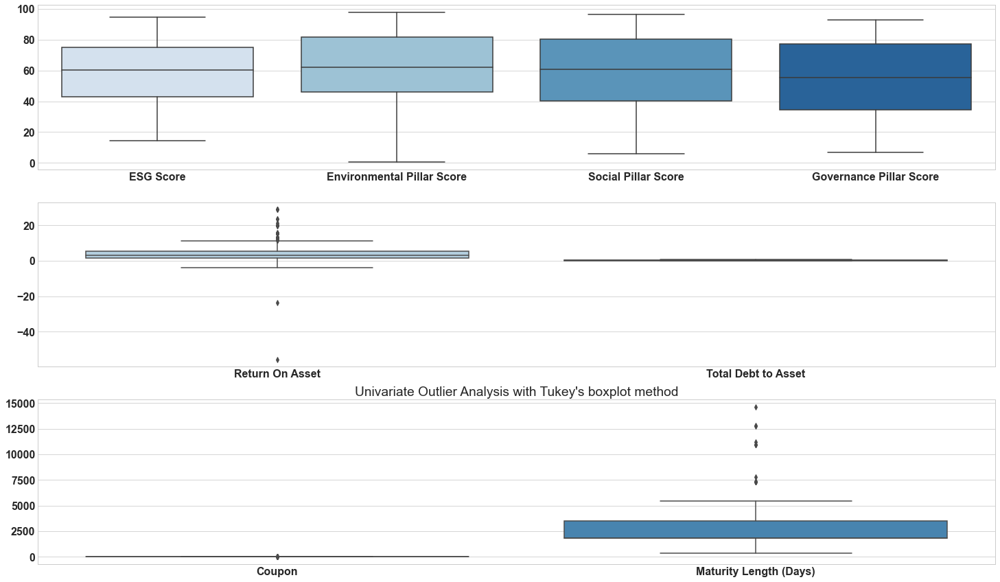

,ESG Score,Environmental Pillar Score,Social Pillar Score,Governance Pillar Score,Return On Asset,Total Debt to Asset,Coupon,Maturity Length (Days)
0,73.4,59.11,96.42,55.23,2.2,0.6,2.1,730
1,89.06,92.93,90.27,83.41,3.0,0.34,2.75,2557
2,54.09,51.01,50.7,63.71,4.89,0.21,4.63,2091
3,64.28,86.11,56.46,48.35,6.97,0.22,0.02,1096
4,59.0,55.53,67.04,53.51,-0.3,0.42,1.97,730


In [257]:
## Univariate outliers - Tukey's boxplot method
cont_feat = df.drop(df.columns[[0,1,7,9,10,11,12,13,14,15,16,17,19,20,21,22]], axis = 1)
# visualize
fig, axes = plt.subplots(3,1,figsize=(25,15))
sns.boxplot(data=cont_feat.iloc[:,0:4], ax = axes[0], palette="Blues")
sns.boxplot(data=cont_feat.iloc[:,4:6], ax = axes[1], palette="Blues")
sns.boxplot(data=cont_feat.iloc[:,6:8], ax = axes[2], palette="Blues")
plt.title("Univariate Outlier Analysis with Tukey's boxplot method")
plt.show()
cont_feat.head(5)

<b>Encoding categorical variables</b>

In [23]:
# One hot encoding categorical features
df1 = pd.get_dummies(df['Market of Issue'])
df2 = pd.get_dummies(df['Country of Issue'])
df3 = pd.get_dummies(df['Sector'])
df4 = pd.get_dummies(df['Use of Proceeds'])
df5 = pd.get_dummies(df['Principal Currency'])
df6 = pd.get_dummies(df['Issuer Credit Rating'])
comb = [df, df1, df2, df3, df4, df5, df6]
new = pd.concat(comb, axis = 1)
new

,ISIN,PARENT ID,ESG Score,Environmental Pillar Score,Social Pillar Score,Governance Pillar Score,Return On Asset,Return On Equity,Total Debt to Asset,WACC Cost of Debt,...,A1+,A3,AA-,BB,BB+,BB-,BBB,BBB+,Ba3,Caa3
0,TH0221032B04,4295892710,73.4,59.11,96.42,55.23,2.2,7.95,0.6,0.06,...,0,0,0,0,0,0,1,0,0,0
1,FR0013048204,4295867555,89.06,92.93,90.27,83.41,3.0,6.38,0.34,0.04,...,0,0,0,0,0,0,1,0,0,0
2,NZCEND0040L1,4295885081,54.09,51.01,50.7,63.71,4.89,6.74,0.21,0.05,...,0,0,1,0,0,0,0,0,0,0
3,JP373480AKB4,4295876533,64.28,86.11,56.46,48.35,6.97,11.13,0.22,0.0,...,0,0,0,0,0,0,1,0,0,0
4,SE0013882743,4295889919,59.0,55.53,67.04,53.51,-0.3,2.38,0.42,0.05,...,0,0,0,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
455,JP356680AN38,4295877493,34.07,43.86,27.77,32.58,2.07,-5.62,0.55,0.01,...,0,0,0,0,0,0,1,0,0,0
456,JP356680AN53,4295877493,34.07,43.86,27.77,32.58,2.07,-5.62,0.55,0.01,...,0,0,0,0,0,0,1,0,0,0
457,JP358260BK34,4295878581,56.51,82.86,54.39,33.38,3.36,10.59,0.58,0.01,...,0,0,1,0,0,0,0,0,0,0
458,FR0014003GT5,8589934326,94.61,94.13,95.92,93.01,0.41,6.7,0.06,0.03,...,0,0,0,0,0,0,0,0,0,0


<b>Choosing features</b>

In [221]:
# Choose features and re-organize the order of variables
x = new.drop(new.columns[[0,1,7,9,10,11,12,13,14,15,16,17,19,20,21]], axis = 1)
first_column = x.pop('NORMALIZED Amount Issued (USD)')
x.insert(0, 'Amount Issued (USD)', first_column)
x.columns.tolist()

['Amount Issued (USD)',
 'ESG Score',
 'Environmental Pillar Score',
 'Social Pillar Score',
 'Governance Pillar Score',
 'Return On Asset',
 'Total Debt to Asset',
 'Coupon',
 'Maturity Length (Days)',
 'Domestic',
 'Eurobond',
 'Foreign',
 'Global',
 'Argentina',
 'Belgium',
 'China',
 'Colombia',
 'European Union',
 'Finland',
 'France',
 'Germany',
 'India',
 'Japan',
 'New Zealand',
 'Norway',
 'Philippines',
 'Slovakia',
 'South Africa',
 'South Korea',
 'Spain',
 'Sweden',
 'Switzerland',
 'Taiwan',
 'Thailand',
 'United States',
 'Airline',
 'Automotive',
 'Banking',
 'Beverage/Bottling',
 'Building Products',
 'Chemicals',
 'Conglomerate',
 'Electronics',
 'Financial ',
 'Food Processors',
 'Gas Utility',
 'Health Care',
 'Home Builders',
 'Industrials ',
 'Information Technology',
 'Insurance',
 'Leasing',
 'Life Insurance',
 'Machinery',
 'Metals/Mining',
 'Oil and Gas',
 'Publishing',
 'Railroads',
 'Real Estate',
 'Retail Stores ',
 'Securities',
 'Service ',
 'Telecommuni

In [223]:
x.head(5)

,Amount Issued (USD),ESG Score,Environmental Pillar Score,Social Pillar Score,Governance Pillar Score,Return On Asset,Total Debt to Asset,Coupon,Maturity Length (Days),Domestic,...,A1+,A3,AA-,BB,BB+,BB-,BBB,BBB+,Ba3,Caa3
0,0.005707,73.4,59.11,96.42,55.23,2.2,0.6,2.1,730,1,...,0,0,0,0,0,0,1,0,0,0
1,0.020308,89.06,92.93,90.27,83.41,3.0,0.34,2.75,2557,1,...,0,0,0,0,0,0,1,0,0,0
2,0.024527,54.09,51.01,50.7,63.71,4.89,0.21,4.63,2091,1,...,0,0,1,0,0,0,0,0,0,0
3,0.141674,64.28,86.11,56.46,48.35,6.97,0.22,0.02,1096,1,...,0,0,0,0,0,0,1,0,0,0
4,0.013269,59.0,55.53,67.04,53.51,-0.3,0.42,1.97,730,1,...,0,0,0,0,0,1,0,0,0,0


## 1.4 Relationship analysis 

<b>Barua and Chiesa (2019)</b> studied a wide range of factors that influence the supply size of green bond using cross‐section Ordinary Least Square regressions and tested if the effect of each factor persists over time and across rating grade estimations via Blinder-Oaxaca decomposition analysis. Factors are classified into three categories: bond's characteristics, firm specifics and market specifics. However the effect size varies. Some of the significant factors include <b>coupon rate</b> (which has a negative effect on the issue size), credit rating (which has a positive effect), revenue growth (negative effect) and profitability (positive effect), principal currency and market of issuance.
* Target variable is not normally distributed, rather rightly skewed (Mode > Median > Mean). Non-negative variable.

In [ ]:
plt.rcParams.update({'font.size': 16})
plt.figure(figsize=(10,6))
plt.subplot(121)
sns.distplot(x['NORMALIZED Amount Issued (USD)'])
plt.subplot(122)
sns.distplot(x['Amount Issued (USD)'])
plt.show()

In [ ]:
display(pd.DataFrame({'NORMALIZED vol.:':x['NORMALIZED Amount Issued (USD)'].describe()}))

### a. Continuous predictors vs Target
Pair plots and heat maps help in identifying highly correlated features (multicollinearity detection)
Multicollinearity affects the coefficients and p-values but it does not influence the predictions, the precision of the predictions, or the goodness-of-fit statistics. In other words, no massive bearing on the model's predictive capababilities. It only affects the specific independent variables that are correlated.

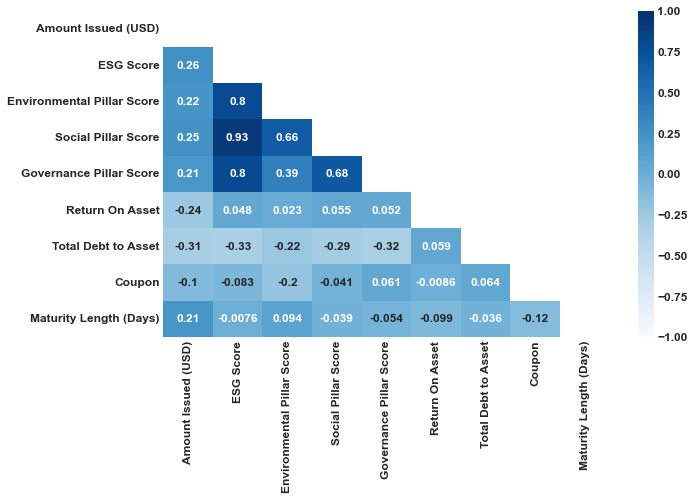

In [224]:
plt.rcParams.update({'font.size': 12})
# Generate a mask to onlyshow the bottom triangle
mask = np.triu(np.ones_like(x.iloc[:,:9].corr(), dtype=bool))
# Plot heatmap for correlation
plt.figure(figsize=(10,6))
correlation = x.iloc[:,:9].corr()
sns.heatmap(correlation, xticklabels = correlation.columns, yticklabels = correlation.columns, 
            annot = True, mask=mask, vmin=-1, vmax=1, cmap="Blues")
plt.xticks(rotation=90) 
plt.show()

In [27]:
# check for outliers?
cont_feat = x.iloc[:,:9]
# visualize
#plt.figure(figsize =(50,35))
#plt.subplot(511), sns.boxplot(data=cat_feat, x="NORMALIZED Amount Issued (USD)", y="Use of Proceeds")
#plt.subplot(512), sns.boxplot(data=cat_feat, x="NORMALIZED Amount Issued (USD)", y="Sector")
#plt.subplot(513), sns.boxplot(data=cat_feat, x="NORMALIZED Amount Issued (USD)", y="Principal Currency")
#plt.subplot(514), sns.boxplot(data=cat_feat, x="NORMALIZED Amount Issued (USD)", y="Market of Issue")
#plt.subplot(515), sns.boxplot(data=cat_feat, x="NORMALIZED Amount Issued (USD)", y="Country of Issue")
#plt.show()
cont_feat.describe()

,NORMALIZED Amount Issued (USD),ESG Score,Environmental Pillar Score,Social Pillar Score,Governance Pillar Score,Return On Asset,Total Debt to Asset,Coupon,Maturity Length (Days)
count,460.000000,460.000000,460.000000,460.000000,460.000000,460.000000,460.000000,460.000000,460.000000
mean,0.067723,58.732457,61.261609,58.495370,54.993761,4.134152,0.342348,2.120261,2536.239130
std,0.110585,19.728627,22.752520,24.338702,23.280292,5.512163,0.161925,2.857278,1718.801917
min,0.000000,14.270000,0.720000,5.960000,6.690000,-55.600000,0.000000,0.000000,365.000000
25%,0.016597,42.830000,46.055000,40.160000,34.410000,1.480000,0.210000,0.450000,1826.000000
50%,0.028198,60.200000,62.230000,60.880000,55.230000,3.070000,0.360000,1.655000,1827.000000
75%,0.056567,75.180000,81.737500,80.182500,77.220000,5.350000,0.452500,2.972500,3534.750000
max,1.000000,94.610000,97.920000,96.420000,93.010000,28.920000,0.790000,48.020000,14610.000000


<Figure size 2160x2160 with 0 Axes>

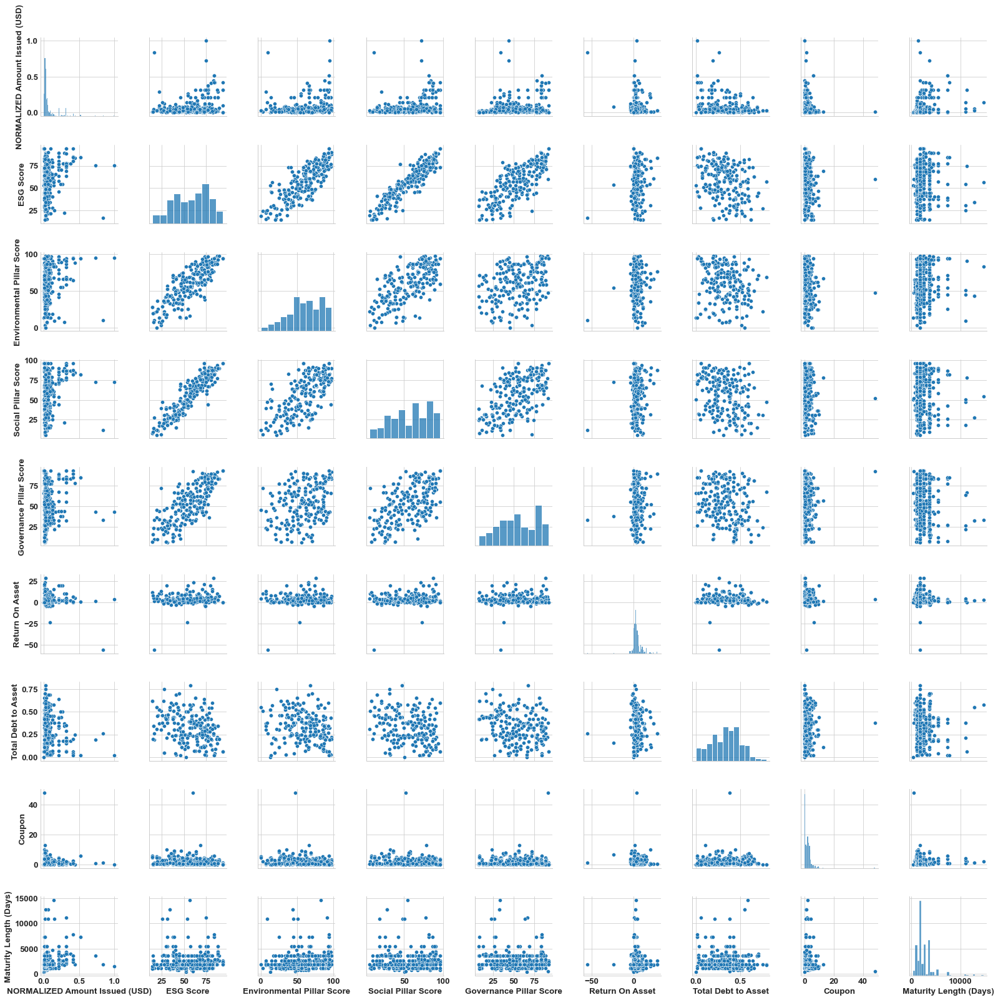

In [68]:
# show distribution to show data shape and scatter plot to detect outliers for each cont. feature
plt.rcParams.update({'font.size': 13.5})
plt.figure(figsize=(30,30))
sns.pairplot(x.iloc[:,:9], palette="Blues")
plt.show()

### b. Categorical predictors

In [29]:
# check for outliers?
cat_feat = df.drop(df.columns[[0,1,2,3,4,5,6,7,8,9,16,17,18,19,20,21,23]], axis = 1)
# visualize
#plt.figure(figsize =(50,35))
#plt.subplot(511), sns.boxplot(data=cat_feat, x="NORMALIZED Amount Issued (USD)", y="Use of Proceeds")
#plt.subplot(512), sns.boxplot(data=cat_feat, x="NORMALIZED Amount Issued (USD)", y="Sector")
#plt.subplot(513), sns.boxplot(data=cat_feat, x="NORMALIZED Amount Issued (USD)", y="Principal Currency")
#plt.subplot(514), sns.boxplot(data=cat_feat, x="NORMALIZED Amount Issued (USD)", y="Market of Issue")
#plt.subplot(515), sns.boxplot(data=cat_feat, x="NORMALIZED Amount Issued (USD)", y="Country of Issue")
#plt.show()
cat_feat

,Issuer Credit Rating,Market of Issue,Country of Issue,Sector,Use of Proceeds,Principal Currency,NORMALIZED Amount Issued (USD)
0,BBB,Domestic,Thailand,Transportation,Clean Transport,Thai Baht,0.005707
1,BBB,Domestic,France,Real Estate,Eligible Green Projects,Euro,0.020308
2,AA-,Domestic,New Zealand,Utility,Energy Efficiency,New Zealand Dollar,0.024527
3,BBB,Domestic,Japan,Electronics,Eligible Green Projects,Japanese Yen,0.141674
4,BB-,Domestic,Sweden,Home Builders,Clean Transport,Swedish Krona,0.013269
...,...,...,...,...,...,...,...
455,BBB,Domestic,Japan,Railroads,Clean Transport,Japanese Yen,0.056567
456,BBB,Domestic,Japan,Railroads,Clean Transport,Japanese Yen,0.028198
457,AA-,Domestic,Japan,Service,Energy Efficiency,Japanese Yen,0.141674
458,A+,Domestic,France,Banking,Energy Efficiency,Euro,0.002659


In [30]:
new_cat_feat = cat_feat.drop(cat_feat.columns[[6]], axis = 1)
new_cat_feat.describe()

,Issuer Credit Rating,Market of Issue,Country of Issue,Sector,Use of Proceeds,Principal Currency
count,460,460,460,460,460,460
unique,13,4,22,31,21,17
top,A+,Domestic,Japan,Home Builders,Energy Efficiency,Japanese Yen
freq,127,426,132,71,148,132


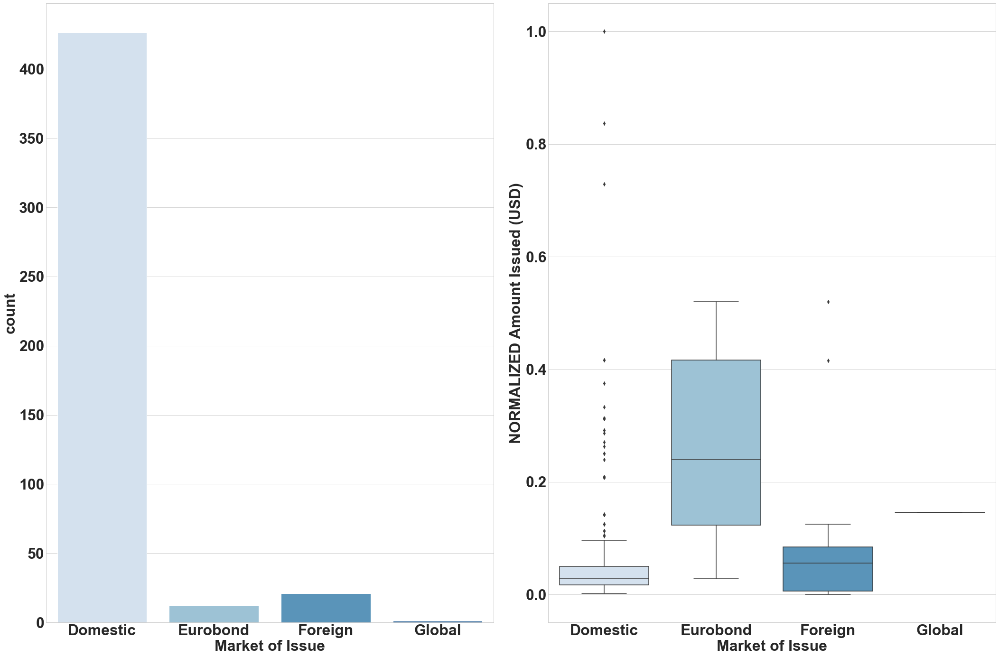

In [192]:
sns.color_palette("mako", as_cmap=True)
plt.rcParams.update({'font.size': 32})
# plot heatmap for correlation
fig1 = plt.figure(figsize = (30,20))

ax1 = fig1.add_subplot(121)
sns.countplot(data = cat_feat, x = 'Market of Issue', ax=ax1, palette="Blues")

ax4 = fig1.add_subplot(122)
sns.boxplot(data = cat_feat, x = 'Market of Issue', y = 'NORMALIZED Amount Issued (USD)' , ax=ax4, palette="Blues")

fig1.tight_layout()

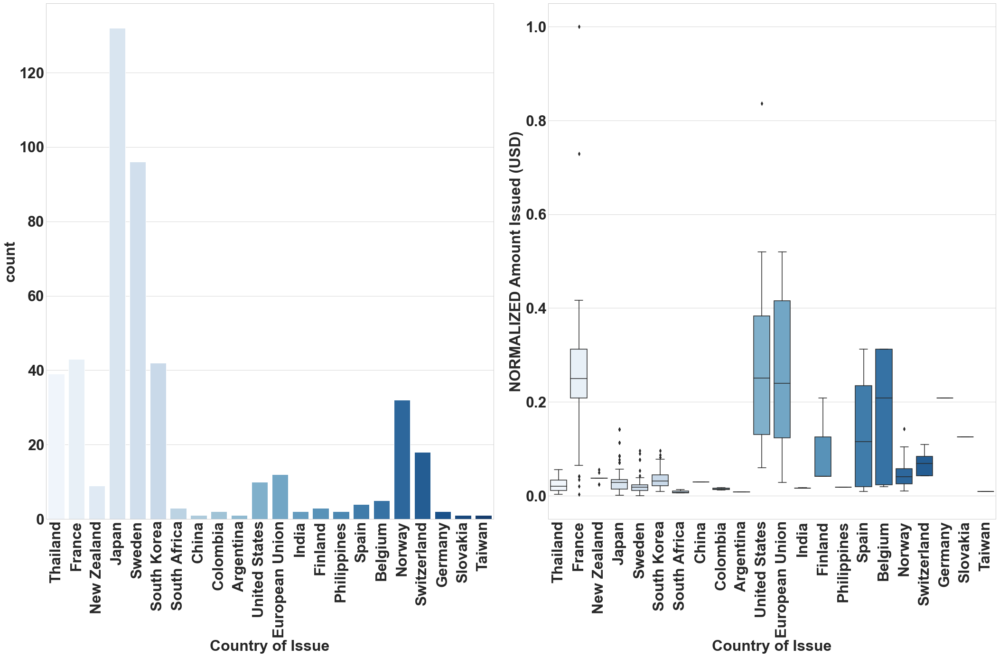

In [191]:
sns.color_palette("mako", as_cmap=True)
plt.rcParams.update({'font.size': 32})
# plot heatmap for correlation
fig1 = plt.figure(figsize = (30,20))

ax2 = fig1.add_subplot(121)
sns.countplot(data = cat_feat, x = 'Country of Issue', ax=ax2, palette="Blues")
ax2.tick_params(axis='x', labelrotation = 90)

ax5 = fig1.add_subplot(122)
sns.boxplot(data = cat_feat, x = 'Country of Issue', y = 'NORMALIZED Amount Issued (USD)', ax=ax5, palette="Blues")
ax5.tick_params(axis='x', labelrotation = 90)

fig1.tight_layout()

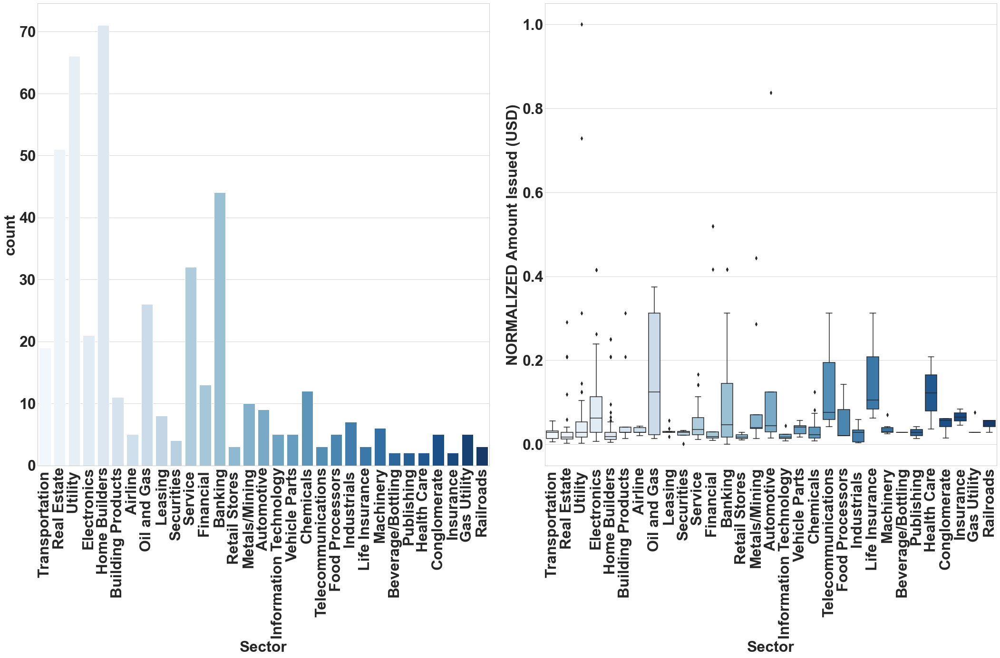

In [238]:
plt.rcParams.update({'font.size': 32})
fig2 = plt.figure(figsize = (30,20))

ax1 = fig2.add_subplot(121)
sns.countplot(data = cat_feat, x = 'Sector', ax=ax1, palette="Blues")
ax1.tick_params(axis='x', labelrotation = 90)

ax4 = fig2.add_subplot(122)
sns.boxplot(data = cat_feat, x = 'Sector', y = 'NORMALIZED Amount Issued (USD)' , ax=ax4, palette="Blues")
ax4.tick_params(axis='x', labelrotation = 90)

fig2.tight_layout()

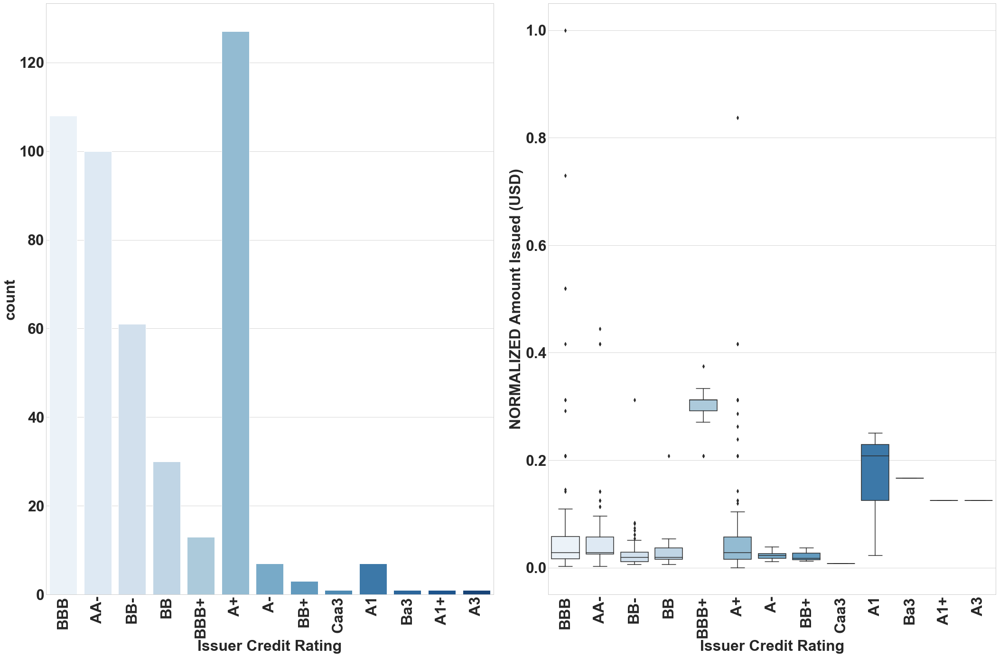

In [239]:
plt.rcParams.update({'font.size': 32})
fig2 = plt.figure(figsize = (30,20))

ax2 = fig2.add_subplot(121)
sns.countplot(data = cat_feat, x = 'Issuer Credit Rating', ax=ax2, palette="Blues")
ax2.tick_params(axis='x', labelrotation = 90)

ax5 = fig2.add_subplot(122)
sns.boxplot(data = cat_feat, x = 'Issuer Credit Rating', y = 'NORMALIZED Amount Issued (USD)', ax=ax5, palette="Blues")
ax5.tick_params(axis='x', labelrotation = 90)

fig2.tight_layout()

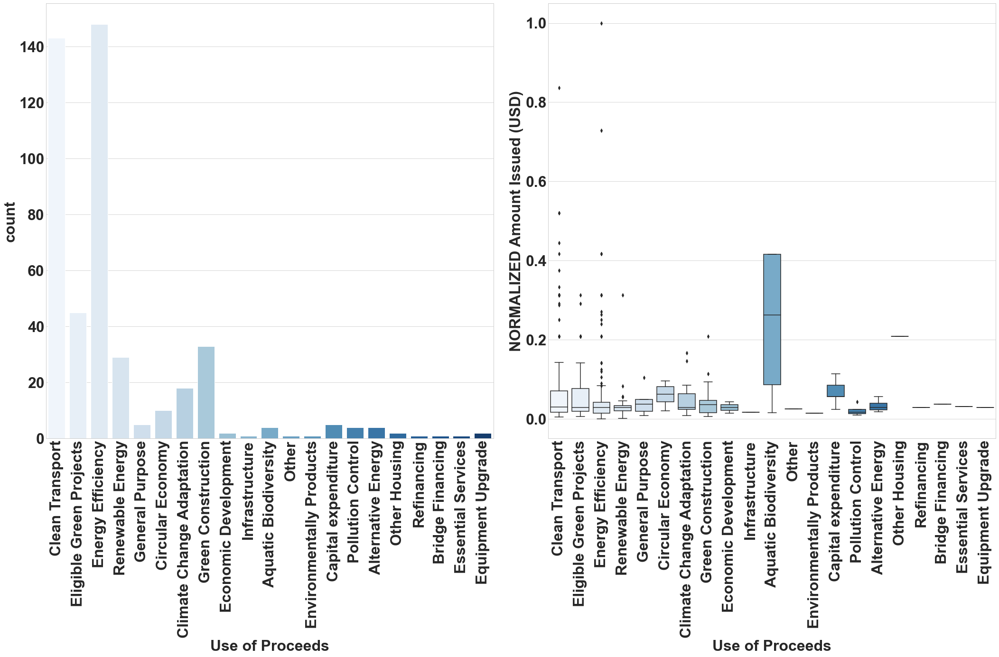

In [237]:
plt.rcParams.update({'font.size': 32})
fig3 = plt.figure(figsize = (30,20))

ax8 = fig3.add_subplot(121)
sns.countplot(data = cat_feat, x = 'Use of Proceeds', ax=ax8, palette="Blues")
ax8.tick_params(axis='x', labelrotation = 90)

ax11 = fig3.add_subplot(122)
sns.boxplot(data = cat_feat, x = 'Use of Proceeds', y = 'NORMALIZED Amount Issued (USD)', ax=ax11, palette="Blues")
ax11.tick_params(axis='x', labelrotation = 90)

fig3.tight_layout()

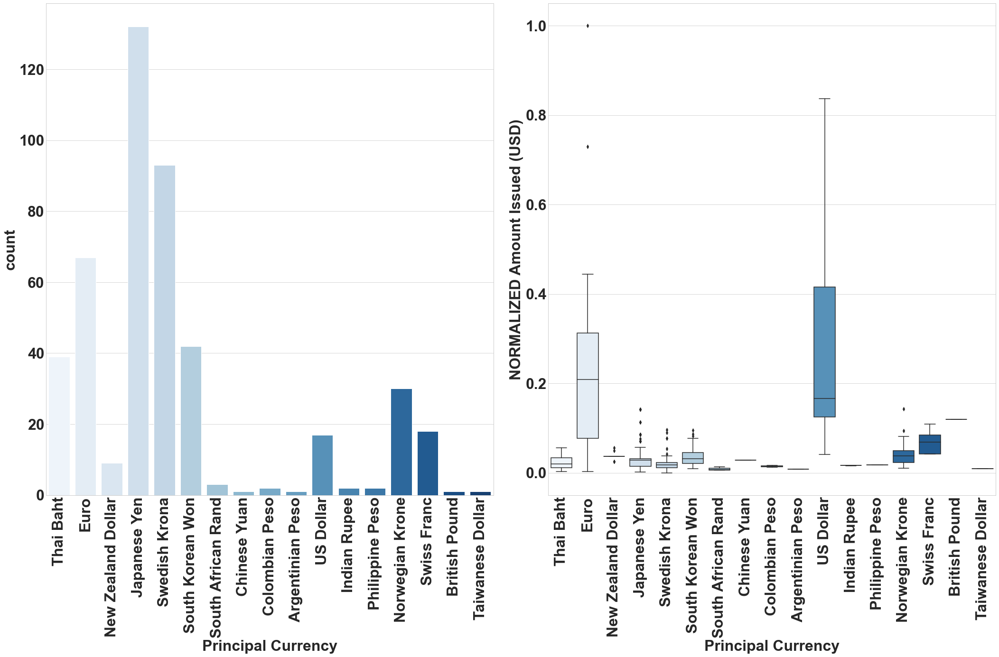

In [193]:
plt.rcParams.update({'font.size': 32})
fig3 = plt.figure(figsize = (30,20))

ax9 = fig3.add_subplot(121)
sns.countplot(data = cat_feat, x = 'Principal Currency', ax=ax9, palette="Blues")
ax9.tick_params(axis='x', labelrotation = 90)

ax12 = fig3.add_subplot(122)
sns.boxplot(data = cat_feat, x = 'Principal Currency', y = 'NORMALIZED Amount Issued (USD)', ax=ax12, palette="Blues")
ax12.tick_params(axis='x', labelrotation = 90)


fig3.tight_layout()

# 2. Model build 

## 2.1  Nested cross validation method

Using the x dataset. 

In [34]:
print("Dataset has {} entries and {} features".format(*x.shape))

Dataset has 460 entries and 117 features


In [35]:
predictors = x.iloc[:,1:]
targets = x.iloc[:,0]
# Set k-fold and initiate the list of algorithms to be run
inner_cv = KFold(n_splits=4, shuffle=True, random_state=1)
outer_cv = KFold(n_splits=5, shuffle=True, random_state=1)

### Linear Regression and Ridge Regression

<b>Linear Regression</b>
* fit_intercept[default=True]. 
Whether to calculate the intercept for this model. If set to False, no intercept will be used in calculations (i.e. data is expected to be centered). When fit_intercept=True, the line of best fit is allowed to "fit" the y-axis. When fit_intercept=False, the intercept is forced to the origin (0, 0). https://stackoverflow.com/questions/46779605/in-the-linearregression-method-in-sklearn-what-exactly-is-the-fit-intercept-par

* normalize[default=False].
This parameter is ignored when fit_intercept is set to False. If True, the regressors X will be normalized before regression by subtracting the mean and dividing by the l2-norm. If you wish to standardize, please use StandardScaler before calling fit on an estimator with normalize=False. Deprecated since version 1.0: normalize was deprecated in version 1.0 and will be removed in 1.2.

* copy_X[default=True].
If True, X will be copied; else, it may be overwritten. The input X when trying to fit the model will, if the flag is set to true (default), be copied for use within the function. This means that the original X passed as a parameter will be the same after the fit has been performed. If the flag i set to false, there is a chance that the X will NOT be the same as it was before fit. https://stackoverflow.com/questions/53711167/what-is-the-meaning-of-copy-x-in-sklearn-linear-models#:~:text=On%20the%20documentation%20for%20Linear,for%20use%20within%20the%20function.

* n_jobs[default=None].
The number of jobs to use for the computation. This will only provide speedup in case of sufficiently large problems, that is if firstly <b>n_targets > 1</b> and secondly X is sparse or if positive is set to True. None means 1 unless in a joblib.parallel_backend context. -1 means using all processors. See Glossary for more details.

* positive[default=False].
When set to True, forces the coefficients to be positive. This option is only supported for dense arrays.
https://stackoverflow.com/questions/35986627/linear-regression-with-positive-coefficients-in-python

In [265]:
def linear_regression_nCV(features, target, inner_cv, outer_cv):
    # Define gridsearch for model tuning on the inner_cv
    def LR_gridsearchcv_tuning(Xtrain, ytrain):
        LRmodel = LinearRegression()
        params_LR = [{'fit_intercept': [True, False], 'positive': [False], 'copy_X': [True]}]
        grid_LR = GridSearchCV(LRmodel, params_LR,cv=inner_cv, scoring= 'neg_root_mean_squared_error')
        start_time = time.time()
        grid_LR.fit(Xtrain, ytrain)
        LR_tuning = time.time() - start_time
        LRBest_params = grid_LR.best_params_
        LRBest_score = grid_LR.best_score_
        return LR_tuning, LRBest_params, LRBest_score
    # Create empty lists for model outcomes
    rmse_score = []
    mae_score = []
    rsquared_score = []  
    predictions = []
    tuning_time = []
    estimators =[]
    # Initiate the process of nested cross validation
    for train_index, test_index in outer_cv.split(features, targets):    
        Xtrain, ytrain = features.iloc[train_index], targets.iloc[train_index]
        Xtest, ytest = features.iloc[test_index], targets.iloc[test_index]
        LRAvg_tuning_time, LRBest_estimators, LRBest_score =  LR_gridsearchcv_tuning(Xtrain, ytrain)
        best_lr_model = LinearRegression().set_params(**LRBest_estimators)
        fitted_model = best_lr_model.fit(Xtrain, ytrain)
        # make predictions
        pred = fitted_model.predict(Xtest)
        # compute prediction scores (rmse, mae and r2)
        rmse_score.append(mean_squared_error(ytest, pred, squared = False))
        mae_score.append(mean_absolute_error(ytest, pred)) 
        rsquared_score.append(r2_score(ytest, pred))
        predictions.append(pred)
        tuning_time.append(LRAvg_tuning_time)
        estimators.append(LRBest_estimators)
        # show evaluation metric values
    LRscores = pd.DataFrame.from_dict({'Set of hyperparameters': estimators, 
                                       'Average tuning time': tuning_time, 
                                        'RMSE': rmse_score,
                                        'MAE': mae_score,
                                        'R2': rsquared_score}, orient='index')
    LRpredictions = pd.DataFrame(predictions)
    plt.figure()
    plt.scatter(ytest, LRpredictions.T.iloc[:,-1], c='crimson')
    plt.yscale('log')
    plt.xscale('log')
    p1 = max(max(LRpredictions), max(ytest))
    p2 = min(min(LRpredictions), min(ytest))
    plt.plot([p1, p2], [p1, p2], 'b-')
    plt.xlabel('True Values', fontsize=15)
    plt.ylabel('Predictions', fontsize=15)
    plt.axis('equal')
    plt.tight_layout()
    plt.show()
    return LRscores.T,LRpredictions.T

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This b

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This b

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This b

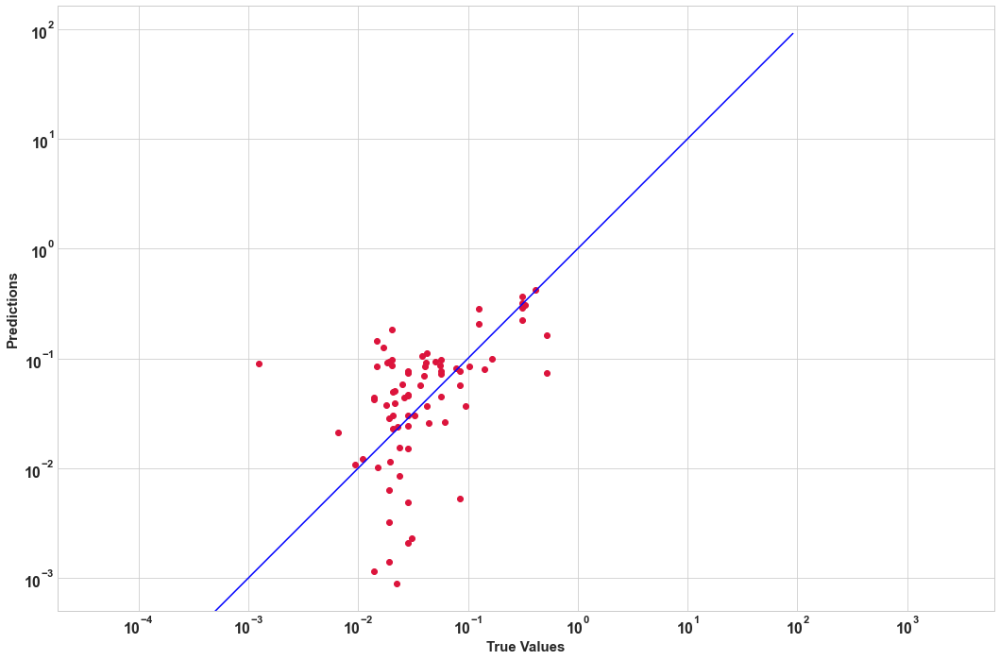

In [266]:
LRscores,LRpredictions = linear_regression_nCV(predictors, targets, inner_cv, outer_cv)

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, **check_params)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instea

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, **check_params)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  y_true = check_array(y_true, ensure_2d=False, dtype=dtype)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert you

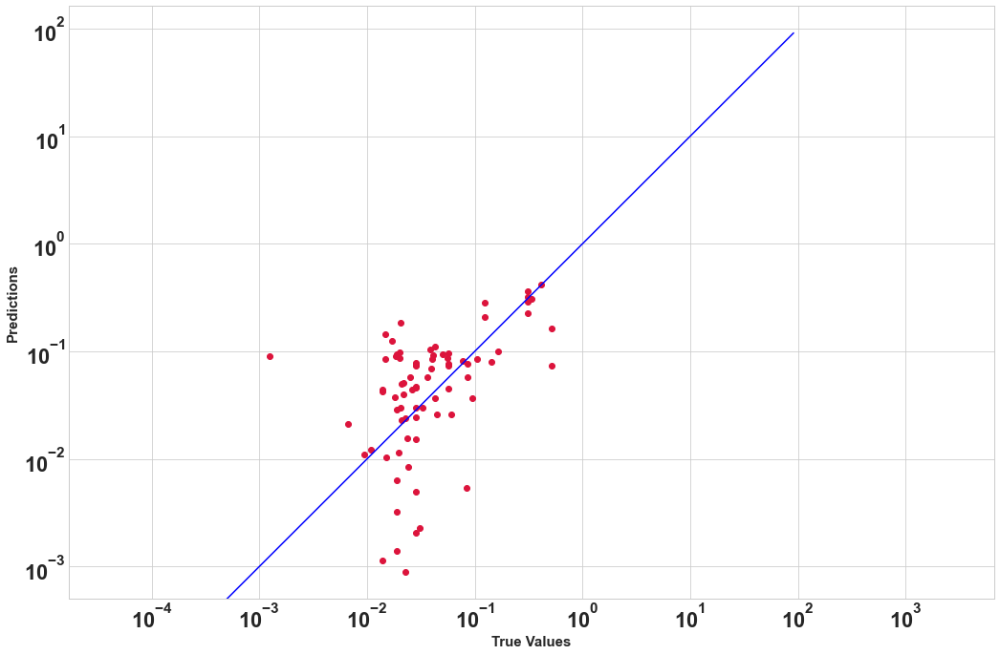

(                                        Set of hyperparameters  \
 0  {'copy_X': True, 'fit_intercept': False, 'positive': False}   
 1  {'copy_X': True, 'fit_intercept': False, 'positive': False}   
 2   {'copy_X': True, 'fit_intercept': True, 'positive': False}   
 3  {'copy_X': True, 'fit_intercept': False, 'positive': False}   
 4  {'copy_X': True, 'fit_intercept': False, 'positive': False}   
 
   Average tuning time      RMSE       MAE        R2  
 0            0.097337  0.068484  0.041542   0.51945  
 1            0.092546  0.069426  0.046958  0.399886  
 2            0.097536   0.10434  0.052634   0.24429  
 3            0.088944  0.103941  0.048834  0.386451  
 4            0.096444  0.103172  0.052097  0.024443  ,
            0         1         2         3         4
 0   0.045164  0.007306  0.015693  0.031775  0.184542
 1   0.035010  0.042124  0.002476  0.033231  0.079778
 2   0.014260  0.039780  0.310768 -0.070741  0.023016
 3  -0.052463  0.080071 -0.016552  0.006105  0.00

In [38]:
linear_regression_nCV(predictors, targets, inner_cv, outer_cv)

In [39]:
LRscores

,Set of hyperparameters,Average tuning time,RMSE,MAE,R2
0,"{'copy_X': True, 'fit_intercept': False, 'positive': False}",0.108608,0.068484,0.041542,0.51945
1,"{'copy_X': True, 'fit_intercept': False, 'positive': False}",0.093282,0.069426,0.046958,0.399886
2,"{'copy_X': True, 'fit_intercept': True, 'positive': False}",0.086565,0.10434,0.052634,0.24429
3,"{'copy_X': True, 'fit_intercept': False, 'positive': False}",0.089418,0.103941,0.048834,0.386451
4,"{'copy_X': True, 'fit_intercept': False, 'positive': False}",0.085298,0.103172,0.052097,0.024443


<b>Ridge Regression</b>

Ridge Regression Penalty resulted in a smaller slope which ultimately makes the predictions less sensitive to the training data. Ridge Regression minimises the sum of squared residuals + lambda times sum of all squared parameters except from the y-intercept. Alpha = Lambda (L2 regularization) increases variance decreases. The whole point of using Ridge is because of the small sample size can lead to poor Least Squares estimates that result in bad ML predictions. 

* alpha{float, ndarray of shape (n_targets,)}[default=1.0]
Constant that multiplies the L2 term, controlling regularization strength. alpha must be a non-negative float i.e. in [0, inf).
When alpha = 0, the objective is equivalent to ordinary least squares, solved by the LinearRegression object. For numerical reasons, using alpha = 0 with the Ridge object is not advised. Instead, you should use the LinearRegression object.
If an array is passed, penalties are assumed to be specific to the targets. Hence they must correspond in number.

* fit_intercept[default=True]
Whether to fit the intercept for this model. If set to false, no intercept will be used in calculations (i.e. X and y are expected to be centered).

* normalize[default=False]
This parameter is ignored when fit_intercept is set to False. If True, the regressors X will be normalized before regression by subtracting the mean and dividing by the l2-norm. If you wish to standardize, please use StandardScaler before calling fit on an estimator with normalize=False.
Deprecated since version 1.0: normalize was deprecated in version 1.0 and will be removed in 1.2.

* copy_X[default=True]
If True, X will be copied; else, it may be overwritten.

* max_iter[default=None]
Maximum number of iterations for conjugate gradient solver. For ‘sparse_cg’ and ‘lsqr’ solvers, the default value is determined by scipy.sparse.linalg. For ‘sag’ solver, the default value is 1000. For ‘lbfgs’ solver, the default value is 15000.

* tol[default=1e-3]
Precision of the solution.

* solver{‘auto’, ‘svd’, ‘cholesky’, ‘lsqr’, ‘sparse_cg’, ‘sag’, ‘saga’, ‘lbfgs’}[default=’auto’]
Solver to use in the computational routines:

  **‘auto’ chooses the solver automatically based on the type of data.

  **‘svd’ uses a Singular Value Decomposition of X to compute the Ridge coefficients. It is the most stable solver, in particular more stable for singular matrices than ‘cholesky’ at the cost of being slower.

  **‘cholesky’ uses the standard scipy.linalg.solve function to obtain a closed-form solution.

  **‘sparse_cg’ uses the conjugate gradient solver as found in scipy.sparse.linalg.cg. As an iterative algorithm, this solver is more appropriate than ‘cholesky’ for large-scale data (possibility to set tol and max_iter).

  **‘lsqr’ uses the dedicated regularized least-squares routine scipy.sparse.linalg.lsqr. It is the fastest and uses an iterative procedure.

  **‘sag’ uses a Stochastic Average Gradient descent, and ‘saga’ uses its improved, unbiased version named SAGA. Both methods also use an iterative procedure, and are often faster than other solvers when both n_samples and n_features are large. Note that ‘sag’ and ‘saga’ fast convergence is only guaranteed on features with approximately the same scale. You can preprocess the data with a scaler from sklearn.preprocessing.

  **‘lbfgs’ uses L-BFGS-B algorithm implemented in scipy.optimize.minimize. It can be used only when positive is True.
All solvers except ‘svd’ support both dense and sparse data. However, only ‘lsqr’, ‘sag’, ‘sparse_cg’, and ‘lbfgs’ support sparse input when fit_intercept is True.
New in version 0.17: Stochastic Average Gradient descent solver.
New in version 0.19: SAGA solver.

* positive[default=False]
When set to True, forces the coefficients to be positive. Only ‘lbfgs’ solver is supported in this case.

* random_stateint[default=None]
Used when solver == ‘sag’ or ‘saga’ to shuffle the data. See Glossary for details.
New in version 0.17: random_state to support Stochastic Average Gradient.

In [40]:
def ridge_regression_nCV(features, target, inner_cv, outer_cv):
    # Define gridsearch for model tuning on the inner_cv
    def Ri_gridsearchcv_tuning(Xtrain, ytrain):
        Rimodel = Ridge()
        params_Ri = [{'fit_intercept': [True, False], 'alpha':list(range(1,20,1)), 'positive': [False], 'copy_X': [True], 'tol': [0.001]}]
        grid_Ri = GridSearchCV(Rimodel, params_Ri,cv=inner_cv, scoring= 'neg_root_mean_squared_error')
        start_time = time.time()
        grid_Ri.fit(Xtrain, ytrain)
        Ri_tuning = time.time() - start_time
        RiBest_params = grid_Ri.best_params_
        RiBest_score = grid_Ri.best_score_
        return Ri_tuning, RiBest_params, RiBest_score
    # Create empty lists for model outcomes
    rmse_score = []
    mae_score = []
    rsquared_score = []  
    predictions = []
    tuning_time = []
    estimators = []
    # Initiate the process of nested cross validation
    for train_index, test_index in outer_cv.split(features, targets):    
        Xtrain, ytrain = features.iloc[train_index], targets.iloc[train_index]
        Xtest, ytest = features.iloc[test_index], targets.iloc[test_index]
        RiAvg_tuning_time, RiBest_estimators, RiBest_score =  Ri_gridsearchcv_tuning(Xtrain, ytrain)
        best_ri_model = Ridge().set_params(**RiBest_estimators)
        fitted_model = best_ri_model.fit(Xtrain, ytrain)
        # make predictions
        pred = fitted_model.predict(Xtest)
        # compute prediction scores (rmse, mae and r2)
        rmse_score.append(mean_squared_error(ytest, pred, squared = False))
        mae_score.append(mean_absolute_error(ytest, pred)) 
        rsquared_score.append(r2_score(ytest, pred))
        predictions.append(pred)
        tuning_time.append(RiAvg_tuning_time)
        estimators.append(RiBest_estimators)
        # show evaluation metric values
    Riscores = pd.DataFrame.from_dict({'Set of hyperparameters': estimators, 
                                       'Average tuning time': tuning_time,
                                        'RMSE': rmse_score,
                                        'MAE': mae_score,
                                        'R2': rsquared_score}, orient='index')
    Ripredictions = pd.DataFrame(predictions)
    plt.figure()
    plt.scatter(ytest, Ripredictions.T.iloc[:,-1], c='crimson')
    plt.yscale('log')
    plt.xscale('log')
    p1 = max(max(Ripredictions), max(ytest))
    p2 = min(min(Ripredictions), min(ytest))
    plt.plot([p1, p2], [p1, p2], 'b-')
    plt.xlabel('True Values', fontsize=15)
    plt.ylabel('Predictions', fontsize=15)
    plt.axis('equal')
    plt.tight_layout()
    plt.show()
    return Riscores.T,Ripredictions.T

In [41]:
def objective_Ri(trial):
    param = {
      'fit_intercept':trial.suggest_categorical('fit_intercept',['True', 'False']),
      'alpha':trial.suggest_float('alpha',1,10,log=True),
      'positive': trial.suggest_categorical('positive',['True', 'False']),
      'copy_X':trial.suggest_categorical("copy_X",['True', 'False']),
      'tol':trial.suggest_float("tol",0.01,1, log=True)
                    }
    model =Ridge(**param)
    model.fit(predictors, targets)
    return abs(np.mean(cross_val_score(model, predictors, targets, cv=inner_cv, scoring= 'neg_root_mean_squared_error')))
Ristudy = optuna.create_study(direction='minimize', study_name='regression')
Ristudy.optimize(objective_Ri, n_trials=100)
optuna.visualization.plot_optimization_history(Ristudy)

[I 2023-01-06 12:11:31,663] A new study created in memory with name: regression
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, **check_params)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  y_true = check_array(y_true, ensure_2d=False, dtype=dtype)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, **check_params)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  y_true = check_array(y_true, ensure_2d=False, dtype=dtype)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to nu

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, **check_params)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  y_true = check_array(y_true, ensure_2d=False, dtype=dtype)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to nu

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, **check_params)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  y_true = check_array(y_true, ensure_2d=False, dtype=dtype)
[I 2023-01-06 12:11:32,059] Trial 8 finished with value: 0.10793846249310067 and parameters: {'fit_intercept': 'False', 'alpha': 1.0034022402261493, 'positive': 'False', 'copy_X': 'True', 'tol': 0.02409099881142593}. Best is trial 8 with value: 0.10793846249310067.
C:\Users

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  y_true = check_array(y_true, ensure_2d=False, dtype=dtype)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, **check_params)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert y

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, **check_params)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  y_true = check_array(y_true, ensure_2d=False, dtype=dtype)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to nu

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, **check_params)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  y_true = check_array(y_true, ensure_2d=False, dtype=dtype)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to nu

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  y_true = check_array(y_true, ensure_2d=False, dtype=dtype)
[I 2023-01-06 12:11:32,626] Trial 19 finished with value: 0.10793846249222955 and parameters: {'fit_intercept': 'True', 'alpha': 2.7751858549683095, 'positive': 'False', 'copy_X': 'True', 'tol': 0.020868395841545116}. Best is trial 18 with value: 0.10666287849483014.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, **check_params)
C:\Use

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, **check_params)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  y_true = check_array(y_true, ensure_2d=False, dtype=dtype)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to nu

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, **check_params)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  y_true = check_array(y_true, ensure_2d=False, dtype=dtype)
[I 2023-01-06 12:11:32,949] Trial 25 finished with value: 0.10666287906666042 and parameters: {'fit_intercept': 'True', 'alpha': 3.3349474822590226, 'positive': 'False', 'copy_X': 'True', 'tol': 0.010413356717968574}. Best is trial 18 with value: 0.10666287849483014.
C:\Use

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, **check_params)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  y_true = check_array(y_true, ensure_2d=False, dtype=dtype)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to nu

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, **check_params)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  y_true = check_array(y_true, ensure_2d=False, dtype=dtype)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to nu

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, **check_params)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  y_true = check_array(y_true, ensure_2d=False, dtype=dtype)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to nu

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, **check_params)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  y_true = check_array(y_true, ensure_2d=False, dtype=dtype)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to nu

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, **check_params)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  y_true = check_array(y_true, ensure_2d=False, dtype=dtype)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to nu

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, **check_params)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  y_true = check_array(y_true, ensure_2d=False, dtype=dtype)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to nu

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, **check_params)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  y_true = check_array(y_true, ensure_2d=False, dtype=dtype)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to nu

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, **check_params)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  y_true = check_array(y_true, ensure_2d=False, dtype=dtype)
[I 2023-01-06 12:11:34,229] Trial 48 finished with value: 0.1066628759773938 and parameters: {'fit_intercept': 'True', 'alpha': 1.0427726502772887, 'positive': 'True', 'copy_X': 'False', 'tol': 0.012228407075477989}. Best is trial 48 with value: 0.1066628759773938.
C:\Users

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, **check_params)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  y_true = check_array(y_true, ensure_2d=False, dtype=dtype)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to nu

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, **check_params)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  y_true = check_array(y_true, ensure_2d=False, dtype=dtype)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to nu

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, **check_params)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  y_true = check_array(y_true, ensure_2d=False, dtype=dtype)
[I 2023-01-06 12:11:34,728] Trial 57 finished with value: 0.10666287604103977 and parameters: {'fit_intercept': 'False', 'alpha': 1.0900321784657727, 'positive': 'True', 'copy_X': 'False', 'tol': 0.01613146107285928}. Best is trial 52 with value: 0.10666287593450598.
C:\Use

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, **check_params)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  y_true = check_array(y_true, ensure_2d=False, dtype=dtype)
[I 2023-01-06 12:11:34,887] Trial 60 finished with value: 0.1066628759322399 and parameters: {'fit_intercept': 'False', 'alpha': 1.009269387872814, 'positive': 'True', 'copy_X': 'False', 'tol': 0.01548441383336544}. Best is trial 60 with value: 0.1066628759322399.
C:\Users\

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, **check_params)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  y_true = check_array(y_true, ensure_2d=False, dtype=dtype)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to nu

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, **check_params)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  y_true = check_array(y_true, ensure_2d=False, dtype=dtype)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to nu

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, **check_params)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  y_true = check_array(y_true, ensure_2d=False, dtype=dtype)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to nu

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, **check_params)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  y_true = check_array(y_true, ensure_2d=False, dtype=dtype)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to nu

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, **check_params)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  y_true = check_array(y_true, ensure_2d=False, dtype=dtype)
[I 2023-01-06 12:11:35,681] Trial 75 finished with value: 0.10793846249310576 and parameters: {'fit_intercept': 'False', 'alpha': 1.0543925151856053, 'positive': 'True', 'copy_X': 'False', 'tol': 0.021321699792643475}. Best is trial 61 with value: 0.10666287592267934.
C:\Us

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, **check_params)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  y_true = check_array(y_true, ensure_2d=False, dtype=dtype)
[I 2023-01-06 12:11:35,840] Trial 78 finished with value: 0.10666287614688283 and parameters: {'fit_intercept': 'False', 'alpha': 1.1685275774158868, 'positive': 'True', 'copy_X': 'False', 'tol': 0.011585909752450314}. Best is trial 76 with value: 0.10666287592032522.
C:\Us

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, **check_params)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  y_true = check_array(y_true, ensure_2d=False, dtype=dtype)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to nu

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, **check_params)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  y_true = check_array(y_true, ensure_2d=False, dtype=dtype)
[I 2023-01-06 12:11:36,172] Trial 84 finished with value: 0.10666288790718091 and parameters: {'fit_intercept': 'False', 'alpha': 9.89424846589728, 'positive': 'True', 'copy_X': 'False', 'tol': 0.01150075861930731}. Best is trial 76 with value: 0.10666287592032522.
C:\Users

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, **check_params)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  y_true = check_array(y_true, ensure_2d=False, dtype=dtype)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to nu

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, **check_params)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  y_true = check_array(y_true, ensure_2d=False, dtype=dtype)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to nu

[I 2023-01-06 12:11:36,644] Trial 93 finished with value: 0.10666287592027462 and parameters: {'fit_intercept': 'False', 'alpha': 1.000426218636181, 'positive': 'True', 'copy_X': 'False', 'tol': 0.01259679924548715}. Best is trial 93 with value: 0.10666287592027462.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, **check_params)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  y_true = check_array(y_true, ensure_2d=False, dtype=dtype)
C:\User

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, **check_params)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  y_true = check_array(y_true, ensure_2d=False, dtype=dtype)
[I 2023-01-06 12:11:36,808] Trial 96 finished with value: 0.1066628761949541 and parameters: {'fit_intercept': 'False', 'alpha': 1.2041962109778743, 'positive': 'True', 'copy_X': 'False', 'tol': 0.0183421590737509}. Best is trial 93 with value: 0.10666287592027462.
C:\Users

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, **check_params)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  y_true = check_array(y_true, ensure_2d=False, dtype=dtype)
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to nu

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sk

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sk

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sk

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sk

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sk

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sk

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sk

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sk

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sk

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sk

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sk

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sk

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sk

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sk

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sk

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\

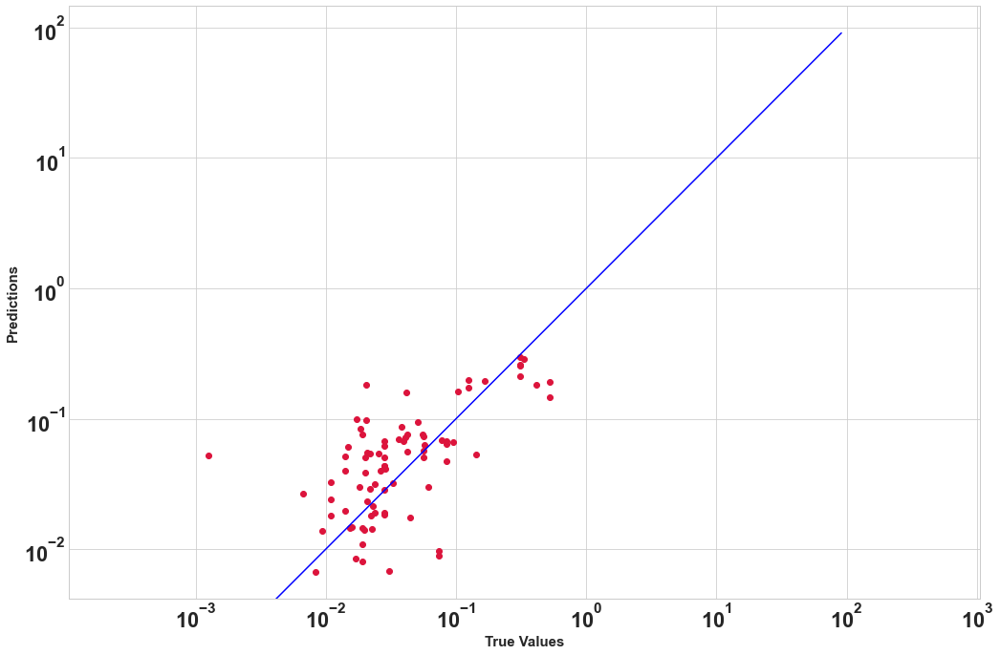

In [42]:
Riscores,Ripredictions = ridge_regression_nCV(predictors, targets, inner_cv, outer_cv)

In [43]:
Riscores

,Set of hyperparameters,Average tuning time,RMSE,MAE,R2
0,"{'alpha': 6, 'copy_X': True, 'fit_intercept': False, 'positive': False, 'tol': 0.001}",1.413277,0.066342,0.036743,0.549054
1,"{'alpha': 2, 'copy_X': True, 'fit_intercept': False, 'positive': False, 'tol': 0.001}",1.340211,0.058978,0.040098,0.566912
2,"{'alpha': 8, 'copy_X': True, 'fit_intercept': False, 'positive': False, 'tol': 0.001}",1.385379,0.09739,0.044694,0.341606
3,"{'alpha': 3, 'copy_X': True, 'fit_intercept': False, 'positive': False, 'tol': 0.001}",1.386658,0.104972,0.047624,0.374216
4,"{'alpha': 9, 'copy_X': True, 'fit_intercept': True, 'positive': False, 'tol': 0.001}",1.44342,0.090322,0.045386,0.252315


In [226]:
def objective_Ri(trial):
    param = {
      'fit_intercept':trial.suggest_categorical('fit_intercept',['True', 'False']),
      'alpha':trial.suggest_float('alpha',1,10,log=True),
      'positive': trial.suggest_categorical('positive',['True', 'False']),
      'copy_X':trial.suggest_categorical("copy_X",['True', 'False']),
      'tol':trial.suggest_float("tol",0.01,1, log=True)
                    }
    model =Ridge(**param)
    model.fit(predictors, targets)
    return abs(np.mean(cross_val_score(model, predictors, targets, cv=inner_cv, scoring= 'neg_root_mean_squared_error')))
Ristudy = optuna.create_study(direction='minimize', study_name='regression')
Ristudy.optimize(objective_Ri, n_trials=100)
optuna.visualization.plot_optimization_history(Ristudy)

[I 2023-01-07 17:17:10,200] A new study created in memory with name: regression
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays o

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This b

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This b

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This b

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This b

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This b

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This b

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This b

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This b

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This b

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This b

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This b

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This b

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This b

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This b

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This b

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This b

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This b

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This b

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This b

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This b

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This b

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This b

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This b

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This b

### KNeighbors Regressor

The algorithm can work with relatively small datasets. The algorithm is simple and easy to implement. It can also be very easily tuned to improve its accuracy. 

The algorithm gets significantly slower as the number of examples and/or predictors/independent variables increase as it have to account for every training point during prediction. The accuracy of the k-NN algorithm can be severely degraded by the presence of noisy or irrelevant features, or if the feature scales are not consistent with their importance. Also it is a non-interpretable model. It is very sensitive to outliers

* n_neighborsint[default=5]
Number of neighbors to use by default for kneighbors queries.

* weights{‘uniform’, ‘distance’}[default=’uniform’]
Weight function used in prediction. Possible values:
‘uniform’ : uniform weights. All points in each neighborhood are weighted equally.
‘distance’ : weight points by the inverse of their distance. in this case, closer neighbors of a query point will have a greater influence than neighbors which are further away.
Uniform weights are used by default.

* algorithm{‘auto’, ‘ball_tree’, ‘kd_tree’, ‘brute’}, default=’auto’
Algorithm used to compute the nearest neighbors:
  **‘ball_tree’ will use BallTree
  **‘kd_tree’ will use KDTree
  **‘brute’ will use a brute-force search.
  **‘auto’ will attempt to decide the most appropriate algorithm based on the values passed to fit method.
Note: fitting on sparse input will override the setting of this parameter, using brute force.

* leaf_size[default=30]
Leaf size passed to BallTree or KDTree. This can affect the speed of the construction and query, as well as the memory required to store the tree. The optimal value depends on the nature of the problem.The leaf size controls the minimum number of points in a given node, and effectively adjusts the tradeoff between the cost of node traversal and the cost of a brute-force distance estimate.  larger leaf size, the build time decreases: this is because fewer nodes need to be built. For very small leaf sizes, the query slows down because the algorithm must access many nodes to complete the query. For very large leaf sizes, the query slows down because there are too many pairwise distance computations. 

* p[default=2]
Power parameter for the Minkowski metric. When p = 1, this is equivalent to using manhattan_distance (l1), and euclidean_distance (l2) for p = 2. For arbitrary p, minkowski_distance (l_p) is used.

* metric[default=’minkowski’]
Metric to use for distance computation. Default is “minkowski”, which results in the standard Euclidean distance when p = 2. See the documentation of scipy.spatial.distance and the metrics listed in distance_metrics for valid metric values.

* metric_params[default=None]
Additional keyword arguments for the metric function.

* n_jobs[default=None]
The number of parallel jobs to run for neighbors search. None means 1 unless in a joblib.parallel_backend context. -1 means using all processors. See Glossary for more details. Doesn’t affect fit method.

In [44]:
def knn_regression_nCV(features, target, inner_cv, outer_cv):
    #def knr_gridsearchcv_tuning(Xtrain, ytrain):
        #KNRmodel = KNeighborsRegressor()
        #params_KNR = [{'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'], 
                       #'weights': ['distance'], 
                       #'metric': ['euclidean', 'minkowski'],
                       #'n_neighbors': list(range(1,25,1)), 
                       #'leaf_size': list(range(1,50,1))}]
        #grid_KNR = GridSearchCV(KNRmodel, params_KNR,cv=inner_cv, scoring= 'neg_root_mean_squared_error')
        #start_time = time.time()
        #grid_KNR.fit(Xtrain, ytrain)
        #KNR_tuning = time.time() - start_time
        #KNRBest_params = grid_KNR.best_params_
        #KNRBest_score = grid_KNR.best_score_
        #return KNR_tuning, KNRBest_params, KNRBest_score
    # Define optuna search for model tuning on the inner_cv
    def KNR_optuna_tuning(Xtrain, ytrain):
        def objective_KNR(trial):
            param = {
                    'algorithm':trial.suggest_categorical('algorithm',['auto', 'ball_tree', 'kd_tree', 'brute']),
                    'weights':trial.suggest_categorical('weights',['distance', 'uniform']),
                    'metric': trial.suggest_categorical('metric', ['euclidean', 'minkowski']),
                    'n_neighbors':trial.suggest_int("n_neighbors",1,21,log=True),
                    'leaf_size':trial.suggest_int("leaf_size",1,50, log=True)
                    }
            model =KNeighborsRegressor(**param)
            model.fit(Xtrain,ytrain)
            return abs(np.mean(cross_val_score(model, Xtrain, ytrain, cv=inner_cv, scoring= 'neg_root_mean_squared_error')))
        KNRstudy = optuna.create_study(direction='minimize', study_name='regression')
        start_time = time.time()
        KNRstudy.optimize(objective_KNR, n_trials=100)
        KNR_tuning_time = time.time() - start_time
        KNRBest_params = KNRstudy.best_params
        KNRBest_score = KNRstudy.best_value
        return KNR_tuning_time, KNRBest_params, KNRBest_score
    # Create empty lists for model outcomes
    rmse_score = []
    mae_score = []
    rsquared_score = []  
    predictions = []
    tuning_time = []
    estimators = []
    # Initiate the process of nested cross validation
    for train_index, test_index in outer_cv.split(features, targets):    
        Xtrain, ytrain = features.iloc[train_index], targets.iloc[train_index]
        Xtest, ytest = features.iloc[test_index], targets.iloc[test_index]
        KNRAvg_tuning_time, KNRBest_estimators, KNRBest_score =  KNR_optuna_tuning(Xtrain, ytrain)
        best_knr_model = KNeighborsRegressor().set_params(**KNRBest_estimators)
        fitted_model = best_knr_model.fit(Xtrain, ytrain)
        # make predictions
        pred = fitted_model.predict(Xtest)
        # compute prediction scores (rmse, mae and r2)
        rmse_score.append(mean_squared_error(ytest, pred, squared = False))
        mae_score.append(mean_absolute_error(ytest, pred)) 
        rsquared_score.append(r2_score(ytest, pred))
        predictions.append(pred)
        tuning_time.append(KNRAvg_tuning_time)
        estimators.append(KNRBest_estimators)
        # show evaluation metric values
    KNRscores = pd.DataFrame.from_dict({'Set of hyperparameters': estimators, 
                                        'Average tuning time': tuning_time,
                                        'RMSE': rmse_score,
                                        'MAE': mae_score,
                                        'R2': rsquared_score}, orient='index')
    KNRpredictions = pd.DataFrame(predictions)
    plt.figure()
    plt.scatter(ytest, KNRpredictions.T.iloc[:,-1], c='crimson')
    plt.yscale('log')
    plt.xscale('log')
    p1 = max(max(KNRpredictions), max(ytest))
    p2 = min(min(KNRpredictions), min(ytest))
    plt.plot([p1, p2], [p1, p2], 'b-')
    plt.xlabel('True Values', fontsize=15)
    plt.ylabel('Predictions', fontsize=15)
    plt.axis('equal')
    plt.tight_layout()
    plt.show()
    return KNRscores.T,KNRpredictions.T

[I 2023-01-06 12:11:45,040] A new study created in memory with name: regression
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numer

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-06 12:11:45,909] Trial 13 finished with value: 0.09927606791895144 and parameters: {'algorithm': 'auto', 'weights': 'distance', 'metric': 'euclidean', 'n_neighbors': 7, 'leaf_size': 3}. Best is trial 10 with value: 0.09878014118643216.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/s

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-06 12:11:46,661] Trial 23 finished with value: 0.09667024891230952 and parameters: {'algorithm': 'auto', 'weights': 'distance', 'metric': 'euclidean', 'n_neighbors': 21, 'leaf_size': 49}. Best is trial 23 with value: 0.09667024891230952.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-06 12:11:46,801] Trial 25 finished with value: 0.09667024891230952 and parameters: {'algorithm': 'auto', 'weights': 'distance', 'metric': 'euclidean', 'n_neighbors': 21, 'leaf_size': 29}. Best is trial 23 with value: 0.09667024891230952.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-06 12:11:46,951] Trial 27 finished with value: 0.10545672257848954 and parameters: {'algorithm': 'kd_tree', 'weights': 'uniform', 'metric': 'euclidean', 'n_neighbors': 20, 'leaf_size': 27}. Best is trial 23 with value: 0.09667024891230952.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings i

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-06 12:11:47,550] Trial 35 finished with value: 0.09735995158042327 and parameters: {'algorithm': 'kd_tree', 'weights': 'distance', 'metric': 'euclidean', 'n_neighbors': 15, 'leaf_size': 10}. Best is trial 23 with value: 0.09667024891230952.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of by

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-06 12:11:49,521] Trial 61 finished with value: 0.09669212489056662 and parameters: {'algorithm': 'brute', 'weights': 'distance', 'metric': 'minkowski', 'n_neighbors': 20, 'leaf_size': 23}. Best is trial 23 with value: 0.09667024891230952.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of byte

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-06 12:11:49,677] Trial 63 finished with value: 0.09751405249547651 and parameters: {'algorithm': 'brute', 'weights': 'distance', 'metric': 'minkowski', 'n_neighbors': 13, 'leaf_size': 5}. Best is trial 23 with value: 0.09667024891230952.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-06 12:11:49,841] Trial 65 finished with value: 0.0971573525689416 and parameters: {'algorithm': 'brute', 'weights': 'distance', 'metric': 'euclidean', 'n_neighbors': 18, 'leaf_size': 9}. Best is trial 23 with value: 0.09667024891230952.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is b

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-06 12:11:50,004] Trial 67 finished with value: 0.0973507679365571 and parameters: {'algorithm': 'auto', 'weights': 'distance', 'metric': 'euclidean', 'n_neighbors': 11, 'leaf_size': 50}. Best is trial 23 with value: 0.09667024891230952.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-06 12:11:50,178] Trial 69 finished with value: 0.09679956954901191 and parameters: {'algorithm': 'kd_tree', 'weights': 'distance', 'metric': 'euclidean', 'n_neighbors': 19, 'leaf_size': 22}. Best is trial 23 with value: 0.09667024891230952.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of by

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-06 12:11:50,490] Trial 73 finished with value: 0.09735995158041168 and parameters: {'algorithm': 'brute', 'weights': 'distance', 'metric': 'minkowski', 'n_neighbors': 15, 'leaf_size': 31}. Best is trial 23 with value: 0.09667024891230952.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of byte

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-06 12:11:50,822] Trial 77 finished with value: 0.09737824121613264 and parameters: {'algorithm': 'ball_tree', 'weights': 'distance', 'metric': 'euclidean', 'n_neighbors': 14, 'leaf_size': 11}. Best is trial 23 with value: 0.09667024891230952.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of 

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-06 12:11:50,972] Trial 79 finished with value: 0.09747462572826959 and parameters: {'algorithm': 'brute', 'weights': 'distance', 'metric': 'minkowski', 'n_neighbors': 12, 'leaf_size': 43}. Best is trial 23 with value: 0.09667024891230952.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of byte

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-06 12:11:52,050] Trial 95 finished with value: 0.09726262633049321 and parameters: {'algorithm': 'ball_tree', 'weights': 'distance', 'metric': 'euclidean', 'n_neighbors': 17, 'leaf_size': 37}. Best is trial 23 with value: 0.09667024891230952.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of 

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-06 12:11:52,192] Trial 97 finished with value: 0.09735995158041168 and parameters: {'algorithm': 'auto', 'weights': 'distance', 'metric': 'euclidean', 'n_neighbors': 15, 'leaf_size': 17}. Best is trial 23 with value: 0.09667024891230952.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\skle

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\skle

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\skle

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\skle

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\skle

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\skle

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\skle

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\skle

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\skle

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-06 12:11:53,667] Trial 17 finished w

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-06 12:11:53,781] Trial 19 finished with value: 0.10094082351957832 and parameters: {'algorithm': 'brute', 'weights': 'distance', 'metric': 'minkowski', 'n_neighbors': 3, 'leaf_size': 2}. Best is trial 16 with value: 0.09920776201608332.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-06 12:11:54,628] Trial 29 finished with value: 0.10925445242646892 and parameters: {'algorithm': 'auto', 'weights': 'uniform', 'metric': 'euclidean', 'n_neighbors': 11, 'leaf_size': 4}. Best is trial 22 with value: 0.09915451633391237.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/s

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-06 12:11:54,794] Trial 31 finished with value: 0.09916749457303786 and parameters: {'algorithm': 'ball_tree', 'weights': 'distance', 'metric': 'minkowski', 'n_neighbors': 16, 'leaf_size': 2}. Best is trial 22 with value: 0.09915451633391237.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-06 12:11:55,441] Trial 41 finished with value: 0.09914697946264894 and parameters: {'algorithm': 'brute', 'weights': 'distance', 'metric': 'euclidean', 'n_neighbors': 17, 'leaf_size': 2}. Best is trial 35 with value: 0.09912990583797539.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-06 12:11:57,408] Trial 71 finished with value: 0.09914697946264894 and parameters: {'algorithm': 'brute', 'weights': 'distance', 'metric': 'euclidean', 'n_neighbors': 17, 'leaf_size': 12}. Best is trial 42 with value: 0.09912990583782225.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of byte

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-06 12:11:57,542] Trial 73 finished with value: 0.09912990583782225 and parameters: {'algorithm': 'auto', 'weights': 'distance', 'metric': 'euclidean', 'n_neighbors': 18, 'leaf_size': 1}. Best is trial 42 with value: 0.09912990583782225.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is b

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-06 12:11:57,680] Trial 75 finished with value: 0.09915382794798798 and parameters: {'algorithm': 'auto', 'weights': 'distance', 'metric': 'euclidean', 'n_neighbors': 15, 'leaf_size': 3}. Best is trial 42 with value: 0.09912990583782225.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is b

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-06 12:11:57,816] Trial 77 finished with value: 0.09920709546043917 and parameters: {'algorithm': 'auto', 'weights': 'distance', 'metric': 'euclidean', 'n_neighbors': 19, 'leaf_size': 3}. Best is trial 42 with value: 0.09912990583782225.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-06 12:11:57,956] Trial 79 finished with value: 0.09999998618252248 and parameters: {'algorithm': 'brute', 'weights': 'distance', 'metric': 'euclidean', 'n_neighbors': 13, 'leaf_size': 4}. Best is trial 42 with value: 0.09912990583782225.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-06 12:11:58,834] Trial 91 finished with value: 0.09912990583797539 and parameters: {'algorithm': 'ball_tree', 'weights': 'distance', 'metric': 'euclidean', 'n_neighbors': 18, 'leaf_size': 14}. Best is trial 42 with value: 0.09912990583782225.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of 

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-06 12:11:58,972] Trial 93 finished with value: 0.09912990583782225 and parameters: {'algorithm': 'auto', 'weights': 'distance', 'metric': 'euclidean', 'n_neighbors': 18, 'leaf_size': 27}. Best is trial 42 with value: 0.09912990583782225.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-06 12:11:59,254] Trial 97 finished with value: 0.09912990583782225 and parameters: {'algorithm': 'auto', 'weights': 'distance', 'metric': 'euclidean', 'n_neighbors': 18, 'leaf_size': 29}. Best is trial 42 with value: 0.09912990583782225.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-06 12:11:59,395] Trial 99 finished with value: 0.09915382794798798 and parameters: {'algorithm': 'auto', 'weights': 'distance', 'metric': 'euclidean', 'n_neighbors': 15, 'leaf_size': 39}. Best is trial 42 with value: 0.09912990583782225.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is 

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\skle

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\skle

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\skle

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\skle

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\skle

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\skle

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\skle

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\skle

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\skle

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\skle

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\skle

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-06 12:12:01,799] Trial 33 finished with value: 0.09191485568333513 and parameters: {'algorithm': 'ball_tree', 'weights': 'distance', 'metric': 'minkowski', 'n_neighbors': 17, 'leaf_size': 6}. Best is trial 11 with value: 0.09166190461293222.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of b

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-06 12:12:01,929] Trial 35 finished with value: 0.09242406830231865 and parameters: {'algorithm': 'ball_tree', 'weights': 'distance', 'metric': 'minkowski', 'n_neighbors': 14, 'leaf_size': 47}. Best is trial 11 with value: 0.09166190461293222.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/string

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-06 12:12:02,048] Trial 37 finished with value: 0.10118885172888623 and parameters: {'algorithm': 'auto', 'weights': 'uniform', 'metric': 'euclidean', 'n_neighbors': 2, 'leaf_size': 5}. Best is trial 11 with value: 0.09166190461293222.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/st

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-06 12:12:03,086] Trial 51 finished with value: 0.09166190461293222 and parameters: {'algorithm': 'kd_tree', 'weights': 'distance', 'metric': 'euclidean', 'n_neighbors': 19, 'leaf_size': 3}. Best is trial 11 with value: 0.09166190461293222.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of byt

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-06 12:12:03,286] Trial 53 finished with value: 0.09188251864572858 and parameters: {'algorithm': 'kd_tree', 'weights': 'distance', 'metric': 'euclidean', 'n_neighbors': 18, 'leaf_size': 3}. Best is trial 11 with value: 0.09166190461293222.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of byt

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

[I 2023-01-06 12:12:03,909] Trial 61 finished with value: 0.09166190461293222 and parameters: {'algorithm': 'kd_tree', 'weights': 'distance', 'metric': 'euclidean', 'n_neighbors': 19, 'leaf_size': 2}. Best is trial 11 with value: 0.09166190461293222.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is 

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-06 12:12:06,429] Trial 89 finished with value: 0.09234688420224145 and parameters: {'algorithm': 'kd_tree', 'weights': 'distance', 'metric': 'euclidean', 'n_neighbors': 15, 'leaf_size': 5}. Best is trial 11 with value: 0.09166190461293222.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of byt

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-06 12:12:06,618] Trial 91 finished with value: 0.09175837481089558 and parameters: {'algorithm': 'kd_tree', 'weights': 'distance', 'metric': 'euclidean', 'n_neighbors': 20, 'leaf_size': 3}. Best is trial 11 with value: 0.09166190461293222.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of byt

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-06 12:12:07,288] Trial 99 finished with value: 0.09168148994950996 and parameters: {'algorithm': 'ball_tree', 'weights': 'distance', 'metric': 'euclidean', 'n_neighbors': 21, 'leaf_size': 6}. Best is trial 11 with value: 0.09166190461293222.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-06 12:12:07,820] Trial 7 finished with value: 0.0858917895380971 and parameters: {'algorithm': 'kd_tree', 'weights': 'uniform', 'metric': 'minkowski', 'n_neighbors': 2, 'leaf_size': 1}. Best is trial 3 with value: 0.08007946659687329.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/st

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-06 12:12:07,947] Trial 9 finished with value: 0.0858917895380971 and parameters: {'algorithm': 'brute', 'weights': 'uniform', 'metric': 'euclidean', 'n_neighbors': 2, 'leaf_size': 1}. Best is trial 3 with value: 0.08007946659687329.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-06 12:12:08,393] Trial 15 finished with value: 0.08211123989304904 and parameters: {'algorithm': 'ball_tree', 'weights': 'distance', 'metric': 'euclidean', 'n_neighbors': 5, 'leaf_size': 16}. Best is trial 14 with value: 0.07977413291260273.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of b

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-06 12:12:08,562] Trial 17 finished with value: 0.08283882246412498 and parameters: {'algorithm': 'kd_tree', 'weights': 'distance', 'metric': 'euclidean', 'n_neighbors': 4, 'leaf_size': 3}. Best is trial 14 with value: 0.07977413291260273.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-06 12:12:08,732] Trial 19 finished with value: 0.08048113650975261 and parameters: {'algorithm': 'ball_tree', 'weights': 'distance', 'metric': 'minkowski', 'n_neighbors': 7, 'leaf_size': 2}. Best is trial 14 with value: 0.07977413291260273.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings 

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-06 12:12:08,869] Trial 21 finished with value: 0.08012526043774472 and parameters: {'algorithm': 'ball_tree', 'weights': 'distance', 'metric': 'minkowski', 'n_neighbors': 14, 'leaf_size': 4}. Best is trial 14 with value: 0.07977413291260273.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-06 12:12:09,007] Trial 23 finished with value: 0.08048113650975261 and parameters: {'algorithm': 'ball_tree', 'weights': 'distance', 'metric': 'minkowski', 'n_neighbors': 7, 'leaf_size': 6}. Best is trial 22 with value: 0.07977188644249152.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of by

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-06 12:12:09,158] Trial 25 finished with value: 0.08004514990993615 and parameters: {'algorithm': 'auto', 'weights': 'distance', 'metric': 'minkowski', 'n_neighbors': 15, 'leaf_size': 2}. Best is trial 22 with value: 0.07977188644249152.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-06 12:12:09,321] Trial 27 finished with value: 0.0801494858544203 and parameters: {'algorithm': 'kd_tree', 'weights': 'distance', 'metric': 'minkowski', 'n_neighbors': 8, 'leaf_size': 3}. Best is trial 22 with value: 0.07977188644249152.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-06 12:12:09,616] Trial 31 finished with value: 0.07977413291260273 and parameters: {'algorithm': 'ball_tree', 'weights': 'distance', 'metric': 'minkowski', 'n_neighbors': 9, 'leaf_size': 2}. Best is trial 22 with value: 0.07977188644249152.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of by

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-06 12:12:09,774] Trial 33 finished with value: 0.08283882246412498 and parameters: {'algorithm': 'ball_tree', 'weights': 'distance', 'metric': 'minkowski', 'n_neighbors': 4, 'leaf_size': 26}. Best is trial 22 with value: 0.07977188644249152.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-06 12:12:09,908] Trial 35 finished with value: 0.08096294536791898 and parameters: {'algorithm': 'ball_tree', 'weights': 'distance', 'metric': 'minkowski', 'n_neighbors': 6, 'leaf_size': 4}. Best is trial 22 with value: 0.07977188644249152.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of by

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-06 12:12:10,611] Trial 45 finished with value: 0.08014948585446732 and parameters: {'algorithm': 'auto', 'weights': 'distance', 'metric': 'minkowski', 'n_neighbors': 8, 'leaf_size': 33}. Best is trial 22 with value: 0.07977188644249152.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-06 12:12:10,761] Trial 47 finished with value: 0.08009449138473576 and parameters: {'algorithm': 'ball_tree', 'weights': 'distance', 'metric': 'minkowski', 'n_neighbors': 18, 'leaf_size': 9}. Best is trial 22 with value: 0.07977188644249152.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-06 12:12:10,926] Trial 49 finished w

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-06 12:12:11,090] Trial 51 finished with value: 0.07977413291260273 and parameters: {'algorithm': 'ball_tree', 'weights': 'distance', 'metric': 'minkowski', 'n_neighbors': 9, 'leaf_size': 3}. Best is trial 22 with value: 0.07977188644249152.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings 

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-06 12:12:11,225] Trial 53 finished with value: 0.08048113650975261 and parameters: {'algorithm': 'ball_tree', 'weights': 'distance', 'metric': 'minkowski', 'n_neighbors': 7, 'leaf_size': 3}. Best is trial 22 with value: 0.07977188644249152.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings 

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-06 12:12:11,345] Trial 55 finished with value: 0.08096294536796651 and parameters: {'algorithm': 'auto', 'weights': 'distance', 'metric': 'euclidean', 'n_neighbors': 6, 'leaf_size': 3}. Best is trial 22 with value: 0.07977188644249152.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/s

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-06 12:12:11,512] Trial 57 finished with value: 0.08007946659687329 and parameters: {'algorithm': 'ball_tree', 'weights': 'distance', 'metric': 'minkowski', 'n_neighbors': 11, 'leaf_size': 4}. Best is trial 22 with value: 0.07977188644249152.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-06 12:12:11,655] Trial 59 finished w

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-06 12:12:11,822] Trial 61 finished with value: 0.07977413291260273 and parameters: {'algorithm': 'ball_tree', 'weights': 'distance', 'metric': 'minkowski', 'n_neighbors': 9, 'leaf_size': 6}. Best is trial 22 with value: 0.07977188644249152.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of by

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-06 12:12:11,971] Trial 63 finished with value: 0.08007946659687329 and parameters: {'algorithm': 'ball_tree', 'weights': 'distance', 'metric': 'minkowski', 'n_neighbors': 11, 'leaf_size': 2}. Best is trial 22 with value: 0.07977188644249152.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of b

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-06 12:12:12,924] Trial 77 finished with value: 0.08048113650979835 and parameters: {'algorithm': 'auto', 'weights': 'distance', 'metric': 'minkowski', 'n_neighbors': 7, 'leaf_size': 24}. Best is trial 22 with value: 0.07977188644249152.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-06 12:12:13,799] Trial 89 finished with value: 0.08014948585446732 and parameters: {'algorithm': 'auto', 'weights': 'distance', 'metric': 'minkowski', 'n_neighbors': 8, 'leaf_size': 6}. Best is trial 22 with value: 0.07977188644249152.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/s

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-06 12:12:13,947] Trial 91 finished with value: 0.07977188644249152 and parameters: {'algorithm': 'auto', 'weights': 'distance', 'metric': 'minkowski', 'n_neighbors': 9, 'leaf_size': 10}. Best is trial 22 with value: 0.07977188644249152.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is b

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-06 12:12:14,237] Trial 95 finished with value: 0.08096294536796651 and parameters: {'algorithm': 'auto', 'weights': 'distance', 'metric': 'minkowski', 'n_neighbors': 6, 'leaf_size': 14}. Best is trial 22 with value: 0.07977188644249152.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\skle

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-06 12:12:14,682] Trial 1 finished wi

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-06 12:12:14,805] Trial 3 finished with value: 0.10097938455286504 and parameters: {'algorithm': 'auto', 'weights': 'distance', 'metric': 'minkowski', 'n_neighbors': 14, 'leaf_size': 1}. Best is trial 3 with value: 0.10097938455286504.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is bei

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-06 12:12:14,929] Trial 5 finished with value: 0.10659203877461473 and parameters: {'algorithm': 'auto', 'weights': 'distance', 'metric': 'minkowski', 'n_neighbors': 2, 'leaf_size': 12}. Best is trial 3 with value: 0.10097938455286504.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is bei

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

[I 2023-01-06 12:12:16,423] Trial 25 finished with value: 0.10174446608958329 and parameters: {'algorithm': 'auto', 'weights': 'distance', 'metric': 'minkowski', 'n_neighbors': 12, 'leaf_size': 26}. Best is trial 13 with value: 0.10079082694818156.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is be

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-06 12:12:16,584] Trial 27 finished with value: 0.10752941125824272 and parameters: {'algorithm': 'kd_tree', 'weights': 'uniform', 'metric': 'minkowski', 'n_neighbors': 9, 'leaf_size': 20}. Best is trial 13 with value: 0.10079082694818156.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of byte

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-06 12:12:16,879] Trial 31 finished with value: 0.10079082694818156 and parameters: {'algorithm': 'auto', 'weights': 'distance', 'metric': 'minkowski', 'n_neighbors': 21, 'leaf_size': 9}. Best is trial 13 with value: 0.10079082694818156.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-06 12:12:17,454] Trial 39 finished with value: 0.10659203877461473 and parameters: {'algorithm': 'auto', 'weights': 'distance', 'metric': 'minkowski', 'n_neighbors': 2, 'leaf_size': 10}. Best is trial 13 with value: 0.10079082694818156.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/

[I 2023-01-06 12:12:17,593] Trial 41 finished with value: 0.10079082694818156 and parameters: {'algorithm': 'auto', 'weights': 'distance', 'metric': 'minkowski', 'n_neighbors': 21, 'leaf_size': 4}. Best is trial 13 with value: 0.10079082694818156.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is bei

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-06 12:12:17,914] Trial 45 finished with value: 0.10098236611152422 and parameters: {'algorithm': 'kd_tree', 'weights': 'distance', 'metric': 'minkowski', 'n_neighbors': 14, 'leaf_size': 9}. Best is trial 13 with value: 0.10079082694818156.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of byt

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-06 12:12:18,074] Trial 47 finished with value: 0.10092003501854119 and parameters: {'algorithm': 'auto', 'weights': 'distance', 'metric': 'euclidean', 'n_neighbors': 18, 'leaf_size': 4}. Best is trial 13 with value: 0.10079082694818156.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is b

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-06 12:12:18,957] Trial 59 finished with value: 0.10101327607413135 and parameters: {'algorithm': 'ball_tree', 'weights': 'distance', 'metric': 'minkowski', 'n_neighbors': 15, 'leaf_size': 43}. Best is trial 48 with value: 0.10079082663683855.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of 

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-06 12:12:19,089] Trial 61 finished with value: 0.10079082694818156 and parameters: {'algorithm': 'auto', 'weights': 'distance', 'metric': 'minkowski', 'n_neighbors': 21, 'leaf_size': 15}. Best is trial 48 with value: 0.10079082663683855.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is 

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-06 12:12:19,255] Trial 63 finished with value: 0.10079082694818156 and parameters: {'algorithm': 'auto', 'weights': 'distance', 'metric': 'minkowski', 'n_neighbors': 21, 'leaf_size': 18}. Best is trial 48 with value: 0.10079082663683855.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-06 12:12:19,411] Trial 65 finished with value: 0.10087590665242352 and parameters: {'algorithm': 'auto', 'weights': 'distance', 'metric': 'minkowski', 'n_neighbors': 16, 'leaf_size': 18}. Best is trial 48 with value: 0.10079082663683855.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-06 12:12:19,742] Trial 69 finished with value: 0.1040800284363241 and parameters: {'algorithm': 'kd_tree', 'weights': 'distance', 'metric': 'minkowski', 'n_neighbors': 4, 'leaf_size': 40}. Best is trial 48 with value: 0.10079082663683855.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of byte

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-06 12:12:19,884] Trial 71 finished with value: 0.10086191144977043 and parameters: {'algorithm': 'auto', 'weights': 'distance', 'metric': 'minkowski', 'n_neighbors': 17, 'leaf_size': 49}. Best is trial 48 with value: 0.10079082663683855.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is 

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklear

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-06 12:12:21,678] Trial 93 finished with value: 0.10079082694818156 and parameters: {'algorithm': 'auto', 'weights': 'distance', 'metric': 'minkowski', 'n_neighbors': 21, 'leaf_size': 20}. Best is trial 48 with value: 0.10079082663683855.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-06 12:12:21,839] Trial 95 finished with value: 0.1009612781261437 and parameters: {'algorithm': 'auto', 'weights': 'distance', 'metric': 'minkowski', 'n_neighbors': 20, 'leaf_size': 21}. Best is trial 48 with value: 0.10079082663683855.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is b

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-06 12:12:22,021] Trial 97 finished with value: 0.10092003501854119 and parameters: {'algorithm': 'auto', 'weights': 'distance', 'metric': 'minkowski', 'n_neighbors': 18, 'leaf_size': 10}. Best is trial 48 with value: 0.10079082663683855.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-06 12:12:22,192] Trial 99 finished with value: 0.1009612781261437 and parameters: {'algorithm': 'auto', 'weights': 'distance', 'metric': 'minkowski', 'n_neighbors': 20, 'leaf_size': 35}. Best is trial 48 with value: 0.10079082663683855.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\utils\validation.py:964: FutureWarning:

Arrays of bytes/strings is b

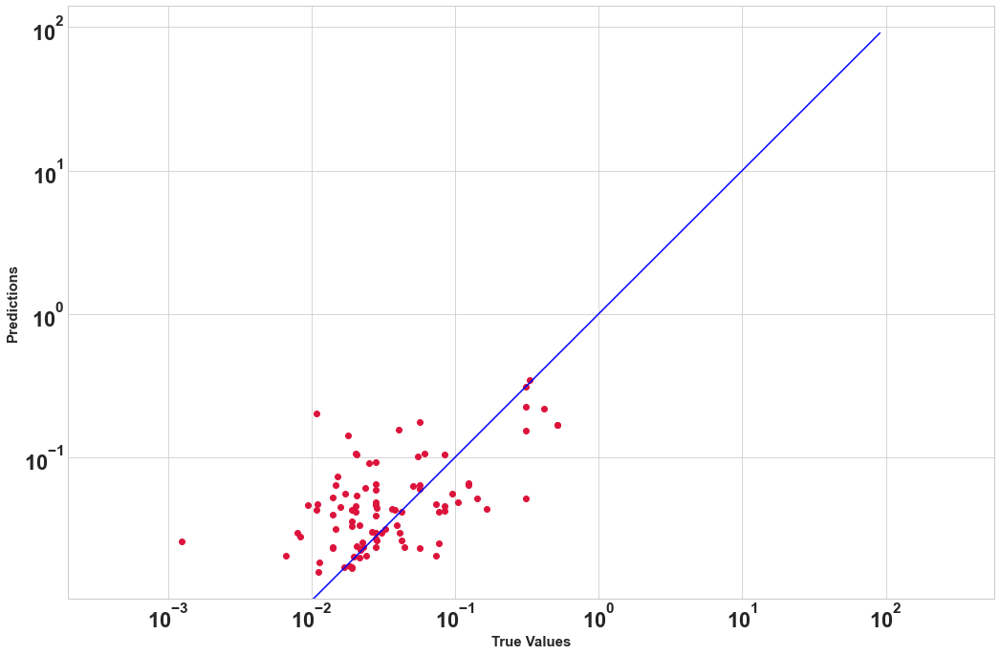

In [45]:
KNRscores,KNRpredictions = knn_regression_nCV(predictors, targets, inner_cv, outer_cv)

In [46]:
KNRscores

,Set of hyperparameters,Average tuning time,RMSE,MAE,R2
0,"{'algorithm': 'auto', 'weights': 'distance', 'metric': 'euclidean', 'n_neighbors': 21, 'leaf_size': 49}",7.282791,0.103922,0.050883,-0.106549
1,"{'algorithm': 'brute', 'weights': 'distance', 'metric': 'euclidean', 'n_neighbors': 18, 'leaf_size': 2}",7.054233,0.070636,0.044485,0.378784
2,"{'algorithm': 'ball_tree', 'weights': 'distance', 'metric': 'minkowski', 'n_neighbors': 19, 'leaf_size': 49}",7.878075,0.111606,0.048462,0.135381
3,"{'algorithm': 'auto', 'weights': 'distance', 'metric': 'minkowski', 'n_neighbors': 9, 'leaf_size': 5}",7.219313,0.133058,0.062569,-0.005445
4,"{'algorithm': 'ball_tree', 'weights': 'distance', 'metric': 'minkowski', 'n_neighbors': 21, 'leaf_size': 17}",7.649338,0.078523,0.043527,0.434899


In [185]:
def objective_KNR(trial):
    param = {
      'algorithm':trial.suggest_categorical('algorithm',['auto', 'ball_tree', 'kd_tree', 'brute']),
      'weights':trial.suggest_categorical('weights',['distance', 'uniform']),
      'metric': trial.suggest_categorical('metric', ['euclidean', 'minkowski']),
      'n_neighbors':trial.suggest_int("n_neighbors",1,10,log=True),
      'leaf_size':trial.suggest_int("leaf_size",1,50, log=True)
                    }
    model =KNeighborsRegressor(**param)
    model.fit(predictors, targets)
    return abs(np.mean(cross_val_score(model, predictors, targets, cv=inner_cv, scoring= 'neg_root_mean_squared_error')))
KNRstudy = optuna.create_study(direction='minimize', study_name='regression')
start_time = time.time()
KNRstudy.optimize(objective_KNR, n_trials=100)
optuna.visualization.plot_optimization_history(KNRstudy)

[I 2023-01-06 13:19:44,510] A new study created in memory with name: regression
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays o

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
[I 2023-01-06 13:19:44,759] Trial 2 finished with value: 0.11337535417813022 and parameters: {'algorithm': 'ball_tree', 'weights': 'uniform', 'metric': 'euclidean', 'n_neighbors': 1, 'leaf_size': 1}. Best is trial 0 with value: 0.11064898325829943.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dt

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
[I 2023-01-06 13:19:44,957] Trial 5 finished with value: 0.11337535417813022 and paramet

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This b

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This b

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This b

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This b

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
[I 2023-01-06 13:19:45,929] Trial 18 finished with value: 0.10120059703894421 and parameters: {'algorithm': 'brute', 'weights': 'distance', 'metric': 'minkowski', 'n_neighbors': 9, 'leaf_size': 15}. Best is trial 17 with value: 0.1009928304683347.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dty

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This b

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This b

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
[I 2023-01-06 13:19:46,574] Trial 26 finished with value: 0.10272366306221477 and parameters: {'algorithm': 'brute', 'weights': 'distance', 'metric': 'minkowski', 'n_neighbors': 6, 'leaf_size': 2}. Best is trial 17 with value: 0.1009928304683347.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtyp

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This b

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This b

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
[I 2023-01-06 13:19:47,198] Trial 34 finished with value: 0.10099283046847433 and parame

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This b

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This b

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
[I 2023-01-06 13:19:47,815] Trial 42 finished with value: 0.1009928304683347 and parameters: {'algorithm': 'brute', 'weights': 'distance', 'metric': 'minkowski', 'n_neighbors': 10, 'leaf_size': 32}. Best is trial 17 with value: 0.1009928304683347.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dty

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This b

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
[I 2023-01-06 13:19:48,316] Trial 48 finished with value: 0.10241229287150691 and parame

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This b

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This b

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This b

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
[I 2023-01-06 13:19:49,162] Trial 59 finished with value: 0.10120059703907866 and parameters: {'algorithm': 'kd_tree', 'weights': 'distance', 'metric': 'euclidean', 'n_neighbors': 9, 'leaf_size': 6}. Best is trial 17 with value: 0.1009928304683347.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dt

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This b

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This b

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
[I 2023-01-06 13:19:49,788] Trial 67 finished with value: 0.1009928304683347 and parameters: {'algorithm': 'brute', 'weights': 'distance', 'metric': 'euclidean', 'n_neighbors': 10, 'leaf_size': 28}. Best is trial 17 with value: 0.1009928304683347.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dty

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This b

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This b

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
[I 2023-01-06 13:19:50,427] Trial 75 finished with value: 0.1009928304683347 and paramet

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This b

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This b

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
[I 2023-01-06 13:19:51,143] Trial 83 finished with value: 0.10241229287150691 and parameters: {'algorithm': 'brute', 'weights': 'distance', 'metric': 'minkowski', 'n_neighbors': 7, 'leaf_size': 23}. Best is trial 17 with value: 0.1009928304683347.
Arrays of bytes/strings is being converted to decimal numbers if dty

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This b

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This b

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
[I 2023-01-06 13:19:51,812] Trial 91 finished with value: 0.1009928304683347 and parameters: {'algorithm': 'brute', 'weights': 'distance', 'metric': 'euclidean', 'n_neighbors': 10, 'leaf_size': 31}. Best is trial 17 with value: 0.1009928304683347.
Arrays of bytes/strings is being converted to decimal numbers if dty

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
[I 2023-01-06 13:19:52,027] Trial 94 finished with value: 0.1009928304683347 and parameters: {'algorithm': 'brute', 'weights': 'distance', 'metric': 'euclidean', 'n_neighbors': 10, 'leaf_size': 8}. Best is trial 17 with value: 0.1009928304683347.
Arrays of bytes/strings is being converted to decimal numbers if dtyp

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This b

### XGBoost Regressor 

<b>General Parameters</b>
* booster[default = gbtree]: Use tree-based or linear models
* verbosity[default = 1]:  
* nthread [default = maximum number of threads available if not set]

There are other general parameters like disable_default_eval_metric [default=0], num_pbuffer [set automatically by XGBoost, no need to be set by user] and num_feature [set automatically by XGBoost, no need to be set by user].So, these parameters are taken care by XGBoost algorithm itself.

<b>Booster Parameters</b>
* eta [default=0.3, alias: learning_rate]: range : [0,1]. Typical final values : 0.01-0.2. Learning rates. Corresponds to the shrinkage of the weights associated to features after each round, in other words it defines the amount of "correction" we make at each step. Having a lower eta makes our model more robust to overfitting thus, usually, the lower the learning rate, the best. But with a lower eta, we need more boosting rounds, which takes more time to train, sometimes for only marginal improvements
* gamma [default=0, alias: min_split_loss]: Range: [0,∞]
* max_depth [default=6]: range: [0,∞] (0 is only accepted in lossguided growing policy when tree_method is set as hist): is the maximum number of nodes allowed from the root to the farthest leaf of a tree. Deeper trees can model more complex relationships by adding more nodes, but as we go deeper, splits become less relevant and are sometimes only due to noise, causing the model to overfit. Typical values: 3-10. 
* min_child_weight [default=1]: range: [0,∞]: is the minimum weight (or number of samples if all samples have a weight of 1) required in order to create a new node in the tree. A smaller min_child_weight allows the algorithm to create children that correspond to fewer samples, thus allowing for more complex trees, but again, more likely to overfit.
* max_delta_step [default=0]: Set it to value of 1-10 might help control the update. range: [0,∞]
* subsample [default=1]: Typical values: 0.5-1, range: (0,1]: corresponds to the fraction of observations (the rows) to subsample at each step. By default it is set to 1 meaning that we use all rows.
* colsample_bytree [default=1]: corresponds to the fraction of features (the columns) to use. By default it is set to 1 meaning that we will use all features.
* lambda [default=1, alias: reg_lambda]: L2 regularization term on weights. Increasing this value will make model more conservative.
* alpha [default=0, alias: reg_alpha]: L1 regularization term on weights (analogous to Lasso regression).
* tree_method string [default= auto]
* scale_pos_weight [default=1]

<b>Learning Task Parameters</b>
* objective [default=reg:squarederror]
* eval_metric [default according to objective]
* seed [default=0]

In [47]:
predictors.to_csv('predictors_s1.csv', header=False, index=False)
predictors_s1 = pd.read_csv('predictors_s1.csv', header = None, index_col = None)
targets.to_csv('target_s1.csv', header=False, index=False)
target_s1 = pd.read_csv('target_s1.csv', header = None, index_col = None)

In [48]:
def xgb_regression_nCV(features, target, inner_cv, outer_cv):
    # Define optuna search for model tuning on the inner_cv
    def xgb_optuna_tuning(Xtrain, ytrain):
        def objective_XGB(trial):
            param = {
                'max_depth': trial.suggest_int('max_depth', 2, 200),
                'min_child_weight': trial.suggest_int('min_child_weight', 1, 10),
                # to control the complexity of the trees. 
                # tune these two together in order to find a good trade-off between model bias and variance
                'learning_rate': trial.suggest_float('learning_rate', 0.01, 1.0),
                # to control the learning rates
                'subsample': trial.suggest_float('subsample', 0.01, 1.0),
                'colsample_bytree': trial.suggest_float('colsample_bytree', 0.01, 1.0),
                # to control the sampling of the dataset that is done at each boosting round.
                # Instead of using the whole training set every time, we can build a tree on slightly different data at each step, 
                # which makes it less likely to overfit to a single sample or feature.
                'n_estimators': trial.suggest_int('n_estimators', 50, 200),
                'gamma': trial.suggest_float('gamma', 0.01, 1.0),
                'reg_alpha': trial.suggest_float('reg_alpha', 0.01, 1.0),
                'reg_lambda': trial.suggest_float('reg_lambda', 0.01, 1.0)
                    }
            model = XGBRegressor(**param)
            model.fit(Xtrain, ytrain)
            return abs(np.mean(cross_val_score(model, Xtrain, ytrain, cv=inner_cv, scoring= 'neg_root_mean_squared_error')))
        XGBstudy = optuna.create_study(direction='minimize', study_name='regression')
        start_time = time.time()
        XGBstudy.optimize(objective_XGB, n_trials=100)
        XGB_tuning_time = time.time() - start_time
        XGBBest_params = XGBstudy.best_params
        XGBBest_score = XGBstudy.best_value
        return XGB_tuning_time, XGBBest_params, XGBBest_score
    # Create empty lists for model outcomes
    rmse_score = []
    mae_score = []
    rsquared_score = []  
    predictions = []
    tuning_time = []
    estimators = []
    # Initiate the process of nested cross validation
    for train_index, test_index in outer_cv.split(features, targets):    
        Xtrain, ytrain = features.iloc[train_index], targets.iloc[train_index]
        Xtest, ytest = features.iloc[test_index], targets.iloc[test_index]
        XGBAvg_tuning_time, XGBBest_estimators, XGBBest_score =  xgb_optuna_tuning(Xtrain, ytrain)
        best_xgb_model = XGBRegressor().set_params(**XGBBest_estimators)
        fitted_model = best_xgb_model.fit(Xtrain, ytrain)
        # make predictions
        pred = fitted_model.predict(Xtest)
        # compute prediction scores (rmse, mae and r2)
        rmse_score.append(mean_squared_error(ytest, pred, squared = False))
        mae_score.append(mean_absolute_error(ytest, pred)) 
        rsquared_score.append(r2_score(ytest, pred))
        predictions.append(pred)
        tuning_time.append(XGBAvg_tuning_time)
        estimators.append(XGBBest_estimators)
        # show evaluation metric values
    XGBscores = pd.DataFrame.from_dict({'Set of hyperparameters': estimators, 
                                        'Average tuning time': tuning_time,
                                        'RMSE': rmse_score,
                                        'MAE': mae_score,
                                        'R2': rsquared_score}, orient='index')
    XGBpredictions = pd.DataFrame(predictions)
    plt.figure()
    plt.scatter(ytest, XGBpredictions.T.iloc[:,4], c='crimson')
    plt.yscale('log')
    plt.xscale('log')
    p1 = max(max(XGBpredictions), max(ytest))
    p2 = min(min(XGBpredictions), min(ytest))
    plt.plot([p1, p2], [p1, p2], 'b-')
    plt.xlabel('True Values', fontsize=15)
    plt.ylabel('Predictions', fontsize=15)
    plt.axis('equal')
    plt.tight_layout()
    plt.show()
    return XGBscores.T,XGBpredictions.T

[I 2023-01-06 12:12:23,050] A new study created in memory with name: regression
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert 

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-06 12:13:57,450] A n

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-06 12:14:01,103] Trial 4 finished with value: 0.1131335225767407 and parameters: {'max_depth': 38, 'min_child_weight': 1, 'learning_rate': 0.8278902757133282, 'subsample': 0.37520580316883967, 'colsample_bytree': 0.9111339080649759, 'n_estimators': 60, 'gamma': 0.9566832540323017, 'reg_alpha': 0.7650297990840573, 'reg_lambda': 0.989453639839

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-06 12:14:04,873] Tri

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-06 12:15:43,438] Trial 3 finished with value: 0.09492315479313457 and parameters: {'max_depth': 4, 'min_child_weight': 6, 'learning_rate': 0.30285465130605, 'subsample': 0.8103927907782954, 'colsample_bytree': 0.16755820636500882, 'n_estimators': 133, 'gamma': 0.8530830886691229, 'reg_alpha': 0.12548924058468652, 'reg_lambda': 0.852242627660

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-06 12:15:46,821] Trial 8 finished with value: 0.0884489339491138 and parameters: {'max_depth': 199, 'min_child_weight': 7, 'learning_rate': 0.5272088009408505, 'subsample': 0.5000487518255415, 'colsample_bytree': 0.23776572015331274, 'n_estimators': 70, 'gamma': 0.436835009239353, 'reg_alpha': 0.44144367072530205, 'reg_lambda': 0.3790859651950969}. Best is trial 4 with value: 0.0709242105003235.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please c

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-06 12:15:51,211] Trial 13 finished with value: 0.08402339241445707 and parameters: {'max_depth': 66, 'min_child_weight': 7, 'learning_rate': 0.4271361911131803, 'subsample': 0.375468825852423, 'colsample_bytree': 0.7152788184278908, 'n_estimators': 102, 'gamma': 0.21407947554779524, 'reg_alpha': 0.02366459525353795, 'reg_lambda': 0.998059106

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-06 12:15:56,170] Tri

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-06 12:17:02,674] Tri

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-06 12:19:03,391] Trial 1 finished with value: 0.09448497512735245 and parameters: {'max_depth': 45, 'min_child_weight': 4, 'learning_rate': 0.06570761828701227, 'subsample': 0.3962315368336601, 'colsample_bytree': 0.3472911717917845, 'n_estimators': 124, 'gamma': 0.20079138959542003, 'reg_alpha': 0.9116667860650243, 'reg_lambda': 0.269630561

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-06 12:19:07,463] Trial 6 finished with value: 0.08795744458318391 and parameters: {'max_depth': 7, 'min_child_weight': 6, 'learning_rate': 0.11216156978188893, 'subsample': 0.7806600121966076, 'colsample_bytree': 0.10430334410122521, 'n_estimators': 68, 'gamma': 0.08727999889661438, 'reg_alpha': 0.7015144840796886, 'reg_lambda': 0.27443032423221725}. Best is trial 6 with value: 0.08795744458318391.
C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Pleas

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-06 12:19:10,983] Trial 11 finished with value: 0.0934064264823566 and parameters: {'max_depth': 10, 'min_child_weight': 3, 'learning_rate': 0.9842275556671577, 'subsample': 0.9334275018458954, 'colsample_bytree': 0.9385257935565267, 'n_estimators': 51, 'gamma': 0.30241589548810516, 'reg_alpha': 0.47032307676178603, 'reg_lambda': 0.5177149346

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-06 12:19:15,476] Trial 16 finished with value: 0.09268209544936609 and parameters: {'max_depth': 64, 'min_child_weight': 6, 'learning_rate': 0.2733464439929395, 'subsample': 0.6298799177569421, 'colsample_bytree': 0.9812465522606695, 'n_estimators': 75, 'gamma': 0.36849748749470634, 'reg_alpha': 0.017942417008109113, 'reg_lambda': 0.98108745

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

[I 2023-01-06 12:19:21,049] Tri

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:95: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

C:\Users\nhiii\anaconda3\lib\si

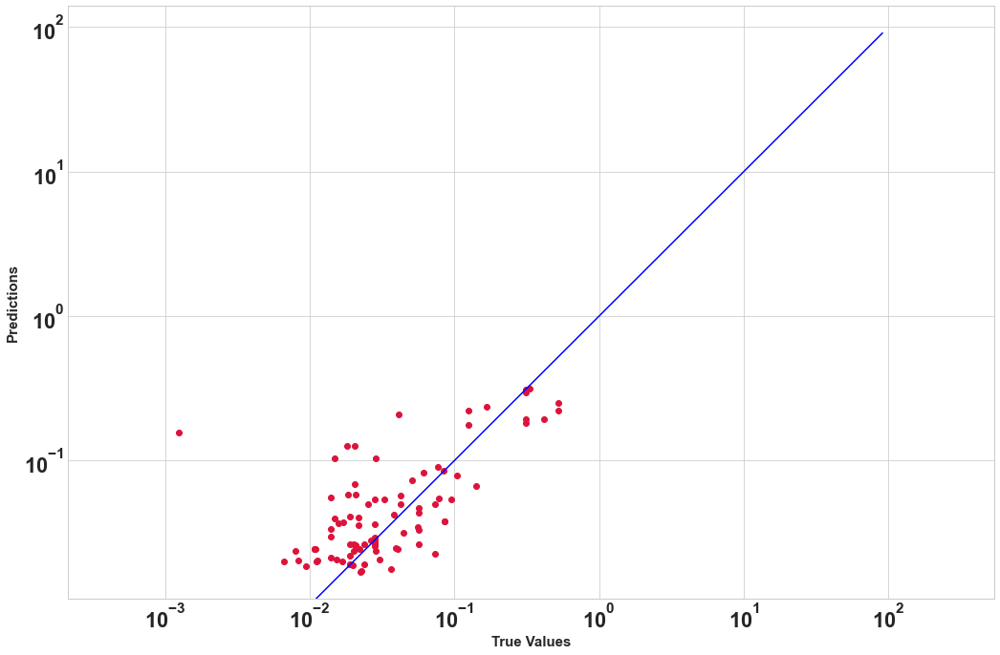

In [49]:
XGBscores,XGBpredictions= xgb_regression_nCV(predictors_s1, target_s1, inner_cv, outer_cv)

In [50]:
XGBscores

,Set of hyperparameters,Average tuning time,RMSE,MAE,R2
0,"{'max_depth': 22, 'min_child_weight': 4, 'learning_rate': 0.04213373810454807, 'subsample': 0.9138386089262485, 'colsample_bytree': 0.390726921253136, 'n_estimators': 112, 'gamma': 0.010990268640127976, 'reg_alpha': 0.300446295782591, 'reg_lambda': 0.20591062302123586}",94.234942,0.05793,0.027927,0.656153
1,"{'max_depth': 149, 'min_child_weight': 5, 'learning_rate': 0.4936600554312937, 'subsample': 0.9105097849920483, 'colsample_bytree': 0.7828321533227254, 'n_estimators': 129, 'gamma': 0.03249377482178778, 'reg_alpha': 0.277972527350959, 'reg_lambda': 0.21329819086197296}",101.91664,0.049515,0.029063,0.694742
2,"{'max_depth': 176, 'min_child_weight': 1, 'learning_rate': 0.1728716992460502, 'subsample': 0.8748280772420889, 'colsample_bytree': 0.5352528075018747, 'n_estimators': 105, 'gamma': 0.011323530058121775, 'reg_alpha': 0.19181885721100655, 'reg_lambda': 0.024303998995588934}",80.067277,0.09468,0.040695,0.377748
3,"{'max_depth': 32, 'min_child_weight': 8, 'learning_rate': 0.853334819532526, 'subsample': 0.9393169691379675, 'colsample_bytree': 0.6723969364556746, 'n_estimators': 190, 'gamma': 0.06420683903610996, 'reg_alpha': 0.042356101126686405, 'reg_lambda': 0.8038636908177307}",120.94403,0.101147,0.049689,0.418993
4,"{'max_depth': 152, 'min_child_weight': 7, 'learning_rate': 0.09407037348340216, 'subsample': 0.7708592923065347, 'colsample_bytree': 0.5863727705995979, 'n_estimators': 138, 'gamma': 0.03516041476151889, 'reg_alpha': 0.040859289585441494, 'reg_lambda': 0.7823262742235741}",95.726625,0.064446,0.034487,0.619355


In [51]:
XGBscores.mean(axis=0)

C:\Users\nhiii\AppData\Local\Temp\ipykernel_22352\4144725191.py:1: FutureWarning:

Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.



Average tuning time    98.577903
RMSE                    0.073544
MAE                     0.036372
R2                      0.553398
dtype: float64

In [183]:
def objective_XGB(trial):
    param = {
                'max_depth': trial.suggest_int('max_depth', 2, 200),
                'min_child_weight': trial.suggest_int('min_child_weight', 1, 10),
                # to control the complexity of the trees. 
                # tune these two together in order to find a good trade-off between model bias and variance
                'learning_rate': trial.suggest_float('learning_rate', 0.01, 1.0),
                # to control the learning rates
                'subsample': trial.suggest_float('subsample', 0.01, 1.0),
                'colsample_bytree': trial.suggest_float('colsample_bytree', 0.01, 1.0),
                # to control the sampling of the dataset that is done at each boosting round.
                # Instead of using the whole training set every time, we can build a tree on slightly different data at each step, 
                # which makes it less likely to overfit to a single sample or feature.
                'n_estimators': trial.suggest_int('n_estimators', 50, 200),
                'gamma': trial.suggest_float('gamma', 0.01, 1.0),
                'reg_alpha': trial.suggest_float('reg_alpha', 0.01, 1.0),
                'reg_lambda': trial.suggest_float('reg_lambda', 0.01, 1.0)
                        }
    model = XGBRegressor(**param)
    model.fit(predictors_s1, target_s1)
    return abs(np.mean(cross_val_score(model, predictors_s1, target_s1, cv=inner_cv, scoring= 'neg_root_mean_squared_error')))
XGBstudy = optuna.create_study(direction='minimize', study_name='regression')
XGBstudy.optimize(objective_XGB, n_trials=100)
optuna.visualization.plot_optimization_history(XGBstudy)
#optuna.visualization.plot_param_importances(LGBMstudy)

[I 2023-01-06 13:18:06,752] A new study created in memory with name: regression
[I 2023-01-06 13:18:07,641] Trial 0 finished with value: 0.10165963364104065 and parameters: {'max_depth': 136, 'min_child_weight': 5, 'learning_rate': 0.45079636234403664, 'subsample': 0.4422576090017918, 'colsample_bytree': 0.5947682586108356, 'n_estimators': 169, 'gamma': 0.7754179510616602, 'reg_alpha': 0.6253556646741708, 'reg_lambda': 0.3092038460373322}. Best is trial 0 with value: 0.10165963364104065.
[I 2023-01-06 13:18:08,791] Trial 1 finished with value: 0.08903157390431737 and parameters: {'max_depth': 140, 'min_child_weight': 8, 'learning_rate': 0.8310161276302902, 'subsample': 0.7634320564973992, 'colsample_bytree': 0.8863951478497476, 'n_estimators': 198, 'gamma': 0.3089932879258818, 'reg_alpha': 0.531113890495704, 'reg_lambda': 0.3967598113427583}. Best is trial 1 with value: 0.08903157390431737.
[I 2023-01-06 13:18:09,692] Trial 2 finished with value: 0.09655003729537878 and parameters: {'m

[I 2023-01-06 13:18:24,287] Trial 19 finished with value: 0.08802395262897646 and parameters: {'max_depth': 4, 'min_child_weight': 7, 'learning_rate': 0.2739354481630526, 'subsample': 0.5990560815901841, 'colsample_bytree': 0.5118295445921607, 'n_estimators': 149, 'gamma': 0.4136231049941083, 'reg_alpha': 0.09453879621505093, 'reg_lambda': 0.5363502306149441}. Best is trial 11 with value: 0.07495778822325934.
[I 2023-01-06 13:18:25,014] Trial 20 finished with value: 0.09325354088979088 and parameters: {'max_depth': 105, 'min_child_weight': 4, 'learning_rate': 0.9121475203318163, 'subsample': 0.7947384355725736, 'colsample_bytree': 0.2802984867932441, 'n_estimators': 113, 'gamma': 0.6395852250810727, 'reg_alpha': 0.35783136361566237, 'reg_lambda': 0.8592499391374593}. Best is trial 11 with value: 0.07495778822325934.
[I 2023-01-06 13:18:26,327] Trial 21 finished with value: 0.08275444050711368 and parameters: {'max_depth': 85, 'min_child_weight': 3, 'learning_rate': 0.6168826084170849, 

[I 2023-01-06 13:18:39,532] Trial 39 finished with value: 0.09327947186271404 and parameters: {'max_depth': 47, 'min_child_weight': 1, 'learning_rate': 0.31051830507487893, 'subsample': 0.45729336167402557, 'colsample_bytree': 0.32477048150143906, 'n_estimators': 81, 'gamma': 0.31411593539118554, 'reg_alpha': 0.5588589707361683, 'reg_lambda': 0.9467975934251445}. Best is trial 24 with value: 0.07077791056232369.
[I 2023-01-06 13:18:40,292] Trial 40 finished with value: 0.09166081590094377 and parameters: {'max_depth': 64, 'min_child_weight': 3, 'learning_rate': 0.4060049410438627, 'subsample': 0.3639462960683699, 'colsample_bytree': 0.1209157803439922, 'n_estimators': 132, 'gamma': 0.271729043374373, 'reg_alpha': 0.0604533991627165, 'reg_lambda': 0.8561348615575305}. Best is trial 24 with value: 0.07077791056232369.
[I 2023-01-06 13:18:41,062] Trial 41 finished with value: 0.0752548390783234 and parameters: {'max_depth': 19, 'min_child_weight': 2, 'learning_rate': 0.18925569799464032, 

[I 2023-01-06 13:18:55,744] Trial 59 finished with value: 0.07573447617082656 and parameters: {'max_depth': 90, 'min_child_weight': 4, 'learning_rate': 0.5586140906187994, 'subsample': 0.6417360924190153, 'colsample_bytree': 0.47624328039546404, 'n_estimators': 125, 'gamma': 0.04457756731114196, 'reg_alpha': 0.18264292286423697, 'reg_lambda': 0.8156434065019752}. Best is trial 24 with value: 0.07077791056232369.
[I 2023-01-06 13:18:57,114] Trial 60 finished with value: 0.09049764556949208 and parameters: {'max_depth': 56, 'min_child_weight': 1, 'learning_rate': 0.7954253095695616, 'subsample': 0.33717700407508877, 'colsample_bytree': 0.8576474240807367, 'n_estimators': 176, 'gamma': 0.36917365345144715, 'reg_alpha': 0.3050215556002489, 'reg_lambda': 0.6786116999489091}. Best is trial 24 with value: 0.07077791056232369.
[I 2023-01-06 13:18:58,110] Trial 61 finished with value: 0.07514381927852996 and parameters: {'max_depth': 35, 'min_child_weight': 2, 'learning_rate': 0.159628907877860

[I 2023-01-06 13:19:15,782] Trial 79 finished with value: 0.06996407086933627 and parameters: {'max_depth': 135, 'min_child_weight': 1, 'learning_rate': 0.13067354188286845, 'subsample': 0.4438481948117374, 'colsample_bytree': 0.8205890365128865, 'n_estimators': 121, 'gamma': 0.014832758497826816, 'reg_alpha': 0.06866183872841275, 'reg_lambda': 0.4341698972721497}. Best is trial 64 with value: 0.06788369650698776.
[I 2023-01-06 13:19:17,006] Trial 80 finished with value: 0.07045884931124673 and parameters: {'max_depth': 154, 'min_child_weight': 1, 'learning_rate': 0.1231795744558938, 'subsample': 0.42155660491246716, 'colsample_bytree': 0.7996771022297224, 'n_estimators': 139, 'gamma': 0.016518271305488535, 'reg_alpha': 0.10645880423531456, 'reg_lambda': 0.4305305708237638}. Best is trial 64 with value: 0.06788369650698776.
[I 2023-01-06 13:19:18,291] Trial 81 finished with value: 0.07055969075883292 and parameters: {'max_depth': 151, 'min_child_weight': 1, 'learning_rate': 0.121794013

[I 2023-01-06 13:19:37,214] Trial 99 finished with value: 0.07838295261614686 and parameters: {'max_depth': 142, 'min_child_weight': 1, 'learning_rate': 0.14968290638042936, 'subsample': 0.44730351252937445, 'colsample_bytree': 0.035045123121278554, 'n_estimators': 113, 'gamma': 0.01005332789432212, 'reg_alpha': 0.09738757014175367, 'reg_lambda': 0.5188356044587809}. Best is trial 64 with value: 0.06788369650698776.


### LGBM Regressor 

* automated tuning with optuna (Bayesian optimization)

In [52]:
def lgbm_regression_nCV(features, target, inner_cv, outer_cv):
    # Define optuna search for model tuning on the inner_cv
    def lgbm_optuna_tuning(Xtrain, ytrain):
        def objective_LGBM(trial):
                param = {
                    'max_depth': trial.suggest_int('max_depth', 2, 200),
                    'min_child_weight': trial.suggest_int('min_child_weight', 1, 10),
                    'learning_rate': trial.suggest_float('learning_rate', 0.01, 1.0),
                    'n_estimators': trial.suggest_int('n_estimators', 50, 200),
                    'subsample': trial.suggest_float('subsample', 0.01, 1.0),
                    'colsample_bytree': trial.suggest_float('colsample_bytree', 0.01, 1.0),
                    'reg_alpha': trial.suggest_float('reg_alpha', 0.01, 1.0),
                    'reg_lambda': trial.suggest_float('reg_lambda', 0.01, 1.0),
                        }
                model = LGBMRegressor(**param)
                model.fit(Xtrain, ytrain)
                return abs(np.mean(cross_val_score(model, Xtrain, ytrain, cv=inner_cv, scoring= 'neg_root_mean_squared_error')))
        LGBMstudy = optuna.create_study(direction='minimize', study_name='regression')
        start_time = time.time()
        LGBMstudy.optimize(objective_LGBM, n_trials=100)
        LGBM_tuning_time = time.time() - start_time
        LGBMBest_params = LGBMstudy.best_params
        LGBMBest_score = LGBMstudy.best_value
        return LGBM_tuning_time, LGBMBest_params, LGBMBest_score
    # Create empty lists for model outcomes
    rmse_score = []
    mae_score = []
    rsquared_score = []  
    predictions = []
    tuning_time = []
    estimators = []
    # Initiate the process of nested cross validation
    for train_index, test_index in outer_cv.split(predictors_s1, target_s1): 
        Xtrain, ytrain = predictors_s1.iloc[train_index], target_s1.iloc[train_index]
        Xtest, ytest = predictors_s1.iloc[test_index], target_s1.iloc[test_index]
        LGBMAvg_tuning_time, LGBMBest_estimators, LGBMBest_score =  lgbm_optuna_tuning(Xtrain, ytrain)
        best_lgbm_model = LGBMRegressor().set_params(**LGBMBest_estimators)
        fitted_model = best_lgbm_model.fit(Xtrain, ytrain)
        # make predictions
        pred = fitted_model.predict(Xtest)
        # compute prediction scores (rmse, mae and r2)
        rmse_score.append(mean_squared_error(ytest, pred, squared = False))
        mae_score.append(mean_absolute_error(ytest, pred)) 
        rsquared_score.append(r2_score(ytest, pred))
        predictions.append(pred)
        tuning_time.append(LGBMAvg_tuning_time)
        estimators.append(LGBMBest_estimators)
        # show evaluation metric values
    LGBMscores = pd.DataFrame.from_dict({'Set of hyperparameters': estimators, 
                                        'Average tuning time': tuning_time,
                                        'RMSE': rmse_score,
                                        'MAE': mae_score,
                                        'R2': rsquared_score}, orient='index')
    LGBMpredictions = pd.DataFrame(predictions)
    plt.figure()
    plt.scatter(ytest, LGBMpredictions.T.iloc[:,-1], c='crimson')
    plt.yscale('log')
    plt.xscale('log')
    p1 = max(max(LGBMpredictions), max(ytest))
    p2 = min(min(LGBMpredictions), min(ytest))
    plt.plot([p1, p2], [p1, p2], 'b-')
    plt.xlabel('True Values', fontsize=15)
    plt.ylabel('Predictions', fontsize=15)
    plt.axis('equal')
    plt.tight_layout()
    plt.show()
    return LGBMscores.T,LGBMpredictions.T

[I 2023-01-06 12:20:38,604] A new study created in memory with name: regression
[I 2023-01-06 12:20:38,746] Trial 0 finished with value: 0.09500886992709903 and parameters: {'max_depth': 36, 'min_child_weight': 8, 'learning_rate': 0.7868263119724297, 'n_estimators': 83, 'subsample': 0.41905439824822904, 'colsample_bytree': 0.12953415529657872, 'reg_alpha': 0.0497103303143366, 'reg_lambda': 0.27862402050090507}. Best is trial 0 with value: 0.09500886992709903.
[I 2023-01-06 12:20:38,834] Trial 1 finished with value: 0.08698812577806873 and parameters: {'max_depth': 195, 'min_child_weight': 10, 'learning_rate': 0.7000595746360185, 'n_estimators': 124, 'subsample': 0.6829300316780238, 'colsample_bytree': 0.8384480685235569, 'reg_alpha': 0.8237906893790667, 'reg_lambda': 0.4750703622792465}. Best is trial 1 with value: 0.08698812577806873.
[I 2023-01-06 12:20:38,932] Trial 2 finished with value: 0.08444723455371256 and parameters: {'max_depth': 190, 'min_child_weight': 10, 'learning_rate':

[I 2023-01-06 12:20:42,722] Trial 21 finished with value: 0.08123900360994753 and parameters: {'max_depth': 75, 'min_child_weight': 4, 'learning_rate': 0.1525371166894559, 'n_estimators': 103, 'subsample': 0.13914708519591776, 'colsample_bytree': 0.7083790907464961, 'reg_alpha': 0.20792998265374646, 'reg_lambda': 0.41534038618222163}. Best is trial 17 with value: 0.08081244805079862.
[I 2023-01-06 12:20:42,922] Trial 22 finished with value: 0.08037231985696668 and parameters: {'max_depth': 63, 'min_child_weight': 4, 'learning_rate': 0.12437227353129626, 'n_estimators': 99, 'subsample': 0.17965613408682188, 'colsample_bytree': 0.7056928482042849, 'reg_alpha': 0.13898250280242952, 'reg_lambda': 0.4082744217088358}. Best is trial 22 with value: 0.08037231985696668.
[I 2023-01-06 12:20:43,157] Trial 23 finished with value: 0.07941131639243623 and parameters: {'max_depth': 53, 'min_child_weight': 3, 'learning_rate': 0.09612502400691866, 'n_estimators': 131, 'subsample': 0.25857254442399225,

[I 2023-01-06 12:20:47,590] Trial 42 finished with value: 0.08056780906510559 and parameters: {'max_depth': 61, 'min_child_weight': 4, 'learning_rate': 0.12020494030848669, 'n_estimators': 117, 'subsample': 0.09384648021910635, 'colsample_bytree': 0.7310834870354657, 'reg_alpha': 0.07230337680220944, 'reg_lambda': 0.8118360678673592}. Best is trial 23 with value: 0.07941131639243623.
[I 2023-01-06 12:20:47,847] Trial 43 finished with value: 0.08095030140532718 and parameters: {'max_depth': 38, 'min_child_weight': 1, 'learning_rate': 0.1788438040619945, 'n_estimators': 155, 'subsample': 0.20829196663523958, 'colsample_bytree': 0.7747035343017261, 'reg_alpha': 0.15131228142338093, 'reg_lambda': 0.531415544659148}. Best is trial 23 with value: 0.07941131639243623.
[I 2023-01-06 12:20:47,985] Trial 44 finished with value: 0.08672596340248617 and parameters: {'max_depth': 48, 'min_child_weight': 6, 'learning_rate': 0.04511612386484639, 'n_estimators': 59, 'subsample': 0.2905024682683909, 'c

[I 2023-01-06 12:20:52,291] Trial 63 finished with value: 0.08032973378783365 and parameters: {'max_depth': 99, 'min_child_weight': 5, 'learning_rate': 0.16147315875182353, 'n_estimators': 129, 'subsample': 0.1443294986501486, 'colsample_bytree': 0.6330477302939799, 'reg_alpha': 0.12930020597562497, 'reg_lambda': 0.3962316419134325}. Best is trial 23 with value: 0.07941131639243623.
[I 2023-01-06 12:20:52,574] Trial 64 finished with value: 0.08000395488010095 and parameters: {'max_depth': 121, 'min_child_weight': 5, 'learning_rate': 0.14329442812852802, 'n_estimators': 129, 'subsample': 0.14664901432141333, 'colsample_bytree': 0.6375634689230509, 'reg_alpha': 0.0468708765587902, 'reg_lambda': 0.4579623217422747}. Best is trial 23 with value: 0.07941131639243623.
[I 2023-01-06 12:20:52,821] Trial 65 finished with value: 0.08032131793236608 and parameters: {'max_depth': 128, 'min_child_weight': 5, 'learning_rate': 0.15866309079831553, 'n_estimators': 122, 'subsample': 0.04372657308533446

[I 2023-01-06 12:20:57,635] Trial 84 finished with value: 0.08167936821524338 and parameters: {'max_depth': 90, 'min_child_weight': 6, 'learning_rate': 0.06279699380664232, 'n_estimators': 135, 'subsample': 0.34970862907316314, 'colsample_bytree': 0.8136689757558312, 'reg_alpha': 0.036017174020379794, 'reg_lambda': 0.44109337332979437}. Best is trial 23 with value: 0.07941131639243623.
[I 2023-01-06 12:20:57,875] Trial 85 finished with value: 0.08029808599500388 and parameters: {'max_depth': 132, 'min_child_weight': 1, 'learning_rate': 0.10445763737876698, 'n_estimators': 125, 'subsample': 0.26722659464524684, 'colsample_bytree': 0.7167389146646145, 'reg_alpha': 0.06498475723872665, 'reg_lambda': 0.08177275596468686}. Best is trial 23 with value: 0.07941131639243623.
[I 2023-01-06 12:20:58,113] Trial 86 finished with value: 0.08201985262176684 and parameters: {'max_depth': 132, 'min_child_weight': 2, 'learning_rate': 0.2261736431482424, 'n_estimators': 125, 'subsample': 0.3187344903569

[I 2023-01-06 12:21:01,835] Trial 5 finished with value: 0.08545514138933942 and parameters: {'max_depth': 63, 'min_child_weight': 3, 'learning_rate': 0.15181578997566125, 'n_estimators': 72, 'subsample': 0.7775757862585032, 'colsample_bytree': 0.23413814815641962, 'reg_alpha': 0.6124434296088878, 'reg_lambda': 0.6859494257976059}. Best is trial 0 with value: 0.08495065171116895.
[I 2023-01-06 12:21:01,947] Trial 6 finished with value: 0.0866656707566007 and parameters: {'max_depth': 4, 'min_child_weight': 1, 'learning_rate': 0.43134764247244706, 'n_estimators': 61, 'subsample': 0.2997616413054896, 'colsample_bytree': 0.29419260438049827, 'reg_alpha': 0.2588004356846473, 'reg_lambda': 0.861147013087889}. Best is trial 0 with value: 0.08495065171116895.
[I 2023-01-06 12:21:02,082] Trial 7 finished with value: 0.09160563694979781 and parameters: {'max_depth': 5, 'min_child_weight': 6, 'learning_rate': 0.9434343572379689, 'n_estimators': 85, 'subsample': 0.01369349603523606, 'colsample_by

[I 2023-01-06 12:21:05,382] Trial 26 finished with value: 0.08230791375220403 and parameters: {'max_depth': 81, 'min_child_weight': 3, 'learning_rate': 0.2271817386806262, 'n_estimators': 145, 'subsample': 0.33994608024676065, 'colsample_bytree': 0.8345995038821177, 'reg_alpha': 0.36449052472815613, 'reg_lambda': 0.09342019307805473}. Best is trial 15 with value: 0.08019992417606202.
[I 2023-01-06 12:21:05,654] Trial 27 finished with value: 0.08135813476405769 and parameters: {'max_depth': 146, 'min_child_weight': 5, 'learning_rate': 0.08160618768257705, 'n_estimators': 166, 'subsample': 0.656167194559686, 'colsample_bytree': 0.5071908175315457, 'reg_alpha': 0.07574274324634725, 'reg_lambda': 0.22598097106633747}. Best is trial 15 with value: 0.08019992417606202.
[I 2023-01-06 12:21:05,942] Trial 28 finished with value: 0.08161406407126015 and parameters: {'max_depth': 153, 'min_child_weight': 6, 'learning_rate': 0.08741098202496479, 'n_estimators': 172, 'subsample': 0.8404647478982108

[I 2023-01-06 12:21:11,509] Trial 47 finished with value: 0.08275576609756087 and parameters: {'max_depth': 192, 'min_child_weight': 4, 'learning_rate': 0.4395327236868475, 'n_estimators': 168, 'subsample': 0.8792435410812462, 'colsample_bytree': 0.33201741175630894, 'reg_alpha': 0.2521155013195623, 'reg_lambda': 0.5095607616952609}. Best is trial 15 with value: 0.08019992417606202.
[I 2023-01-06 12:21:11,777] Trial 48 finished with value: 0.08463147947917626 and parameters: {'max_depth': 161, 'min_child_weight': 9, 'learning_rate': 0.26746885986715035, 'n_estimators': 161, 'subsample': 0.7482492752455396, 'colsample_bytree': 0.20344043651833685, 'reg_alpha': 0.11901832369373763, 'reg_lambda': 0.9898405989285809}. Best is trial 15 with value: 0.08019992417606202.
[I 2023-01-06 12:21:12,084] Trial 49 finished with value: 0.08660606022760689 and parameters: {'max_depth': 127, 'min_child_weight': 10, 'learning_rate': 0.563344454565268, 'n_estimators': 177, 'subsample': 0.6095284478263068,

[I 2023-01-06 12:21:16,771] Trial 68 finished with value: 0.08096573117047426 and parameters: {'max_depth': 135, 'min_child_weight': 6, 'learning_rate': 0.3045938622291119, 'n_estimators': 153, 'subsample': 0.28678336575898844, 'colsample_bytree': 0.7230852797310059, 'reg_alpha': 0.042051122955959676, 'reg_lambda': 0.8169619265074268}. Best is trial 15 with value: 0.08019992417606202.
[I 2023-01-06 12:21:17,069] Trial 69 finished with value: 0.08585232650640594 and parameters: {'max_depth': 79, 'min_child_weight': 5, 'learning_rate': 0.47105513232538243, 'n_estimators': 171, 'subsample': 0.30871243465418735, 'colsample_bytree': 0.7359186727851308, 'reg_alpha': 0.0353924737961691, 'reg_lambda': 0.8313417798010737}. Best is trial 15 with value: 0.08019992417606202.
[I 2023-01-06 12:21:17,312] Trial 70 finished with value: 0.08428829100331535 and parameters: {'max_depth': 117, 'min_child_weight': 4, 'learning_rate': 0.3841632813135507, 'n_estimators': 141, 'subsample': 0.12423380450717758

[I 2023-01-06 12:21:21,936] Trial 89 finished with value: 0.07997299526787542 and parameters: {'max_depth': 87, 'min_child_weight': 7, 'learning_rate': 0.19532862067931797, 'n_estimators': 144, 'subsample': 0.14961913906209073, 'colsample_bytree': 0.4471329204999239, 'reg_alpha': 0.0859627647117225, 'reg_lambda': 0.9086724531854462}. Best is trial 88 with value: 0.078910453953375.
[I 2023-01-06 12:21:22,086] Trial 90 finished with value: 0.08680517481153967 and parameters: {'max_depth': 87, 'min_child_weight': 7, 'learning_rate': 0.16568398250682956, 'n_estimators': 145, 'subsample': 0.16864500752122336, 'colsample_bytree': 0.37773199718452294, 'reg_alpha': 0.9646397078079476, 'reg_lambda': 0.8989352219667391}. Best is trial 88 with value: 0.078910453953375.
[I 2023-01-06 12:21:22,340] Trial 91 finished with value: 0.08062801426505903 and parameters: {'max_depth': 106, 'min_child_weight': 7, 'learning_rate': 0.18982458378588615, 'n_estimators': 130, 'subsample': 0.1519677987707494, 'co

[I 2023-01-06 12:21:25,873] Trial 10 finished with value: 0.06417379090353797 and parameters: {'max_depth': 135, 'min_child_weight': 1, 'learning_rate': 0.21314429175361038, 'n_estimators': 166, 'subsample': 0.7738918418116987, 'colsample_bytree': 0.9494253294335699, 'reg_alpha': 0.04848697901256177, 'reg_lambda': 0.2092077503759876}. Best is trial 10 with value: 0.06417379090353797.
[I 2023-01-06 12:21:26,233] Trial 11 finished with value: 0.06380771550376656 and parameters: {'max_depth': 131, 'min_child_weight': 1, 'learning_rate': 0.21080296173494897, 'n_estimators': 169, 'subsample': 0.7688022033202583, 'colsample_bytree': 0.9547621090349033, 'reg_alpha': 0.023343856987462438, 'reg_lambda': 0.23789924743862584}. Best is trial 11 with value: 0.06380771550376656.
[I 2023-01-06 12:21:26,591] Trial 12 finished with value: 0.06580714908014282 and parameters: {'max_depth': 130, 'min_child_weight': 3, 'learning_rate': 0.348126462624671, 'n_estimators': 174, 'subsample': 0.7372371322608109

[I 2023-01-06 12:21:31,212] Trial 31 finished with value: 0.06415068018156704 and parameters: {'max_depth': 119, 'min_child_weight': 1, 'learning_rate': 0.2952251917586321, 'n_estimators': 171, 'subsample': 0.7778277981934207, 'colsample_bytree': 0.9925231782993411, 'reg_alpha': 0.04753150329816769, 'reg_lambda': 0.23418743709540307}. Best is trial 24 with value: 0.06320435364766513.
[I 2023-01-06 12:21:31,540] Trial 32 finished with value: 0.06344293416113772 and parameters: {'max_depth': 144, 'min_child_weight': 1, 'learning_rate': 0.1771354471859985, 'n_estimators': 192, 'subsample': 0.7996784636410619, 'colsample_bytree': 0.9234895294822241, 'reg_alpha': 0.01963893831035829, 'reg_lambda': 0.17857694163956994}. Best is trial 24 with value: 0.06320435364766513.
[I 2023-01-06 12:21:31,842] Trial 33 finished with value: 0.06461541334771412 and parameters: {'max_depth': 146, 'min_child_weight': 2, 'learning_rate': 0.15355954793159302, 'n_estimators': 194, 'subsample': 0.9946296801860324

[I 2023-01-06 12:21:36,313] Trial 52 finished with value: 0.06249967464454308 and parameters: {'max_depth': 137, 'min_child_weight': 1, 'learning_rate': 0.6166784328295251, 'n_estimators': 166, 'subsample': 0.7019864612179594, 'colsample_bytree': 0.9086559278317923, 'reg_alpha': 0.013404029767934615, 'reg_lambda': 0.6957541490495586}. Best is trial 45 with value: 0.061638153779607706.
[I 2023-01-06 12:21:36,490] Trial 53 finished with value: 0.07106257800619205 and parameters: {'max_depth': 151, 'min_child_weight': 1, 'learning_rate': 0.619593521600625, 'n_estimators': 131, 'subsample': 0.7007317091706315, 'colsample_bytree': 0.7874894134333249, 'reg_alpha': 0.11814159205118946, 'reg_lambda': 0.541430192194887}. Best is trial 45 with value: 0.061638153779607706.
[I 2023-01-06 12:21:36,744] Trial 54 finished with value: 0.06643695465702379 and parameters: {'max_depth': 101, 'min_child_weight': 1, 'learning_rate': 0.6918259191333596, 'n_estimators': 138, 'subsample': 0.6155441323036214, 

[I 2023-01-06 12:21:40,400] Trial 73 finished with value: 0.06646226704889957 and parameters: {'max_depth': 123, 'min_child_weight': 8, 'learning_rate': 0.7112335153500647, 'n_estimators': 137, 'subsample': 0.6351194956685274, 'colsample_bytree': 0.8190356925872194, 'reg_alpha': 0.08611237098897004, 'reg_lambda': 0.856037053110492}. Best is trial 45 with value: 0.061638153779607706.
[I 2023-01-06 12:21:40,642] Trial 74 finished with value: 0.06626422727637898 and parameters: {'max_depth': 98, 'min_child_weight': 8, 'learning_rate': 0.5755692834820414, 'n_estimators': 187, 'subsample': 0.581848526484666, 'colsample_bytree': 0.8841467166203973, 'reg_alpha': 0.12325647497167788, 'reg_lambda': 0.9438334085679432}. Best is trial 45 with value: 0.061638153779607706.
[I 2023-01-06 12:21:40,964] Trial 75 finished with value: 0.06626549416766202 and parameters: {'max_depth': 130, 'min_child_weight': 7, 'learning_rate': 0.4893676770985643, 'n_estimators': 170, 'subsample': 0.780991806563452, 'co

[I 2023-01-06 12:21:45,207] Trial 94 finished with value: 0.06401878684244139 and parameters: {'max_depth': 156, 'min_child_weight': 9, 'learning_rate': 0.6809748344423812, 'n_estimators': 148, 'subsample': 0.7937449050079922, 'colsample_bytree': 0.928409382432284, 'reg_alpha': 0.056149112645527084, 'reg_lambda': 0.7616237022573943}. Best is trial 91 with value: 0.06064693728201345.
[I 2023-01-06 12:21:45,450] Trial 95 finished with value: 0.06341455821368375 and parameters: {'max_depth': 147, 'min_child_weight': 9, 'learning_rate': 0.6482838975079086, 'n_estimators': 151, 'subsample': 0.7139984211227437, 'colsample_bytree': 0.9040656638049568, 'reg_alpha': 0.02881993224651852, 'reg_lambda': 0.5708498826600743}. Best is trial 91 with value: 0.06064693728201345.
[I 2023-01-06 12:21:45,625] Trial 96 finished with value: 0.06572804276925254 and parameters: {'max_depth': 128, 'min_child_weight': 10, 'learning_rate': 0.591016465570312, 'n_estimators': 154, 'subsample': 0.7462501559277985, '

[I 2023-01-06 12:21:48,852] Trial 15 finished with value: 0.07903199008393559 and parameters: {'max_depth': 177, 'min_child_weight': 8, 'learning_rate': 0.6707301470089535, 'n_estimators': 146, 'subsample': 0.37403575413257517, 'colsample_bytree': 0.17967958114703253, 'reg_alpha': 0.1667625278871888, 'reg_lambda': 0.18282704424677937}. Best is trial 14 with value: 0.07466132268298573.
[I 2023-01-06 12:21:49,072] Trial 16 finished with value: 0.07507604048919936 and parameters: {'max_depth': 115, 'min_child_weight': 10, 'learning_rate': 0.37226111101664355, 'n_estimators': 183, 'subsample': 0.25348097827592225, 'colsample_bytree': 0.5839036051596178, 'reg_alpha': 0.1465698416029983, 'reg_lambda': 0.23098805956602222}. Best is trial 14 with value: 0.07466132268298573.
[I 2023-01-06 12:21:49,255] Trial 17 finished with value: 0.07531827828559864 and parameters: {'max_depth': 122, 'min_child_weight': 10, 'learning_rate': 0.4178322796160536, 'n_estimators': 194, 'subsample': 0.2580753225632

[I 2023-01-06 12:21:52,538] Trial 36 finished with value: 0.07451816493178812 and parameters: {'max_depth': 103, 'min_child_weight': 9, 'learning_rate': 0.3356596107235726, 'n_estimators': 189, 'subsample': 0.9823487179342465, 'colsample_bytree': 0.7089942481162815, 'reg_alpha': 0.31939403925776105, 'reg_lambda': 0.5676179586009447}. Best is trial 22 with value: 0.07379253538241763.
[I 2023-01-06 12:21:52,739] Trial 37 finished with value: 0.08029904665859852 and parameters: {'max_depth': 131, 'min_child_weight': 6, 'learning_rate': 0.6348550099863431, 'n_estimators': 169, 'subsample': 0.2946335180146307, 'colsample_bytree': 0.25905440064440566, 'reg_alpha': 0.09683626446133248, 'reg_lambda': 0.4650536248905359}. Best is trial 22 with value: 0.07379253538241763.
[I 2023-01-06 12:21:52,882] Trial 38 finished with value: 0.07638551037554149 and parameters: {'max_depth': 146, 'min_child_weight': 7, 'learning_rate': 0.5450331920941361, 'n_estimators': 80, 'subsample': 0.4506034038090052, '

[I 2023-01-06 12:21:56,374] Trial 57 finished with value: 0.07583066828688247 and parameters: {'max_depth': 29, 'min_child_weight': 10, 'learning_rate': 0.06769802515888676, 'n_estimators': 84, 'subsample': 0.8612350177218849, 'colsample_bytree': 0.9284853659382741, 'reg_alpha': 0.0430962573497195, 'reg_lambda': 0.30282367421302503}. Best is trial 54 with value: 0.07364939853682956.
[I 2023-01-06 12:21:56,622] Trial 58 finished with value: 0.07324659768395526 and parameters: {'max_depth': 65, 'min_child_weight': 10, 'learning_rate': 0.17217147905023128, 'n_estimators': 117, 'subsample': 0.8592138288459199, 'colsample_bytree': 0.8194325165041557, 'reg_alpha': 0.12249552698134811, 'reg_lambda': 0.732441586251844}. Best is trial 58 with value: 0.07324659768395526.
[I 2023-01-06 12:21:56,885] Trial 59 finished with value: 0.07462838220041765 and parameters: {'max_depth': 53, 'min_child_weight': 10, 'learning_rate': 0.18027367501878408, 'n_estimators': 132, 'subsample': 0.8448615541345039, 

[I 2023-01-06 12:22:01,517] Trial 78 finished with value: 0.07312920386987819 and parameters: {'max_depth': 34, 'min_child_weight': 3, 'learning_rate': 0.10032155581838886, 'n_estimators': 146, 'subsample': 0.7029900235615361, 'colsample_bytree': 0.4923041845446698, 'reg_alpha': 0.12135852406223355, 'reg_lambda': 0.22014782666605662}. Best is trial 65 with value: 0.07298067745244283.
[I 2023-01-06 12:22:01,759] Trial 79 finished with value: 0.07835572719045414 and parameters: {'max_depth': 33, 'min_child_weight': 2, 'learning_rate': 0.01677578844402007, 'n_estimators': 140, 'subsample': 0.6947026786786092, 'colsample_bytree': 0.4832640398835267, 'reg_alpha': 0.03307639747329311, 'reg_lambda': 0.22819932987821667}. Best is trial 65 with value: 0.07298067745244283.
[I 2023-01-06 12:22:02,005] Trial 80 finished with value: 0.07353511629682212 and parameters: {'max_depth': 28, 'min_child_weight': 3, 'learning_rate': 0.0974559410516771, 'n_estimators': 148, 'subsample': 0.7396278077130942, 

[I 2023-01-06 12:22:06,705] Trial 99 finished with value: 0.07228760552731106 and parameters: {'max_depth': 5, 'min_child_weight': 4, 'learning_rate': 0.09111581032663428, 'n_estimators': 153, 'subsample': 0.6314989985659902, 'colsample_bytree': 0.4495288125023096, 'reg_alpha': 0.07758224311521486, 'reg_lambda': 0.021329952152296307}. Best is trial 98 with value: 0.07222621783164912.
[I 2023-01-06 12:22:06,755] A new study created in memory with name: regression
[I 2023-01-06 12:22:06,951] Trial 0 finished with value: 0.0951411404944873 and parameters: {'max_depth': 16, 'min_child_weight': 2, 'learning_rate': 0.9303343273335887, 'n_estimators': 115, 'subsample': 0.7025681800176331, 'colsample_bytree': 0.9700917407309412, 'reg_alpha': 0.02998762722619206, 'reg_lambda': 0.458902777845193}. Best is trial 0 with value: 0.0951411404944873.
[I 2023-01-06 12:22:07,080] Trial 1 finished with value: 0.0846264623684548 and parameters: {'max_depth': 37, 'min_child_weight': 10, 'learning_rate': 0.

[I 2023-01-06 12:22:10,133] Trial 20 finished with value: 0.09176254925493417 and parameters: {'max_depth': 171, 'min_child_weight': 8, 'learning_rate': 0.04770525766273302, 'n_estimators': 141, 'subsample': 0.6074707572721839, 'colsample_bytree': 0.014862928665489328, 'reg_alpha': 0.5717976333658968, 'reg_lambda': 0.11157787413170228}. Best is trial 3 with value: 0.08285290826377117.
[I 2023-01-06 12:22:10,278] Trial 21 finished with value: 0.08437639467985686 and parameters: {'max_depth': 199, 'min_child_weight': 3, 'learning_rate': 0.24352473834157504, 'n_estimators': 178, 'subsample': 0.32831675030069213, 'colsample_bytree': 0.811078492849186, 'reg_alpha': 0.76593701383573, 'reg_lambda': 0.026962450202434776}. Best is trial 3 with value: 0.08285290826377117.
[I 2023-01-06 12:22:10,425] Trial 22 finished with value: 0.08386863744269266 and parameters: {'max_depth': 173, 'min_child_weight': 4, 'learning_rate': 0.17271200606620077, 'n_estimators': 175, 'subsample': 0.38179184073781347

[I 2023-01-06 12:22:13,739] Trial 41 finished with value: 0.0837486836493054 and parameters: {'max_depth': 174, 'min_child_weight': 6, 'learning_rate': 0.11314163671216712, 'n_estimators': 98, 'subsample': 0.23488745877089917, 'colsample_bytree': 0.8629842314817406, 'reg_alpha': 0.8631440173276299, 'reg_lambda': 0.5508658221909404}. Best is trial 3 with value: 0.08285290826377117.
[I 2023-01-06 12:22:13,888] Trial 42 finished with value: 0.08472893572576332 and parameters: {'max_depth': 148, 'min_child_weight': 5, 'learning_rate': 0.22759381354443634, 'n_estimators': 112, 'subsample': 0.31084862165637966, 'colsample_bytree': 0.963982077149198, 'reg_alpha': 0.6730414361350021, 'reg_lambda': 0.08072439256985808}. Best is trial 3 with value: 0.08285290826377117.
[I 2023-01-06 12:22:14,050] Trial 43 finished with value: 0.08920263706097753 and parameters: {'max_depth': 68, 'min_child_weight': 7, 'learning_rate': 0.01362113391268252, 'n_estimators': 80, 'subsample': 0.35805793235244854, 'co

[I 2023-01-06 12:22:17,008] Trial 62 finished with value: 0.0832110452739656 and parameters: {'max_depth': 46, 'min_child_weight': 6, 'learning_rate': 0.4308896642220097, 'n_estimators': 179, 'subsample': 0.32922015094973334, 'colsample_bytree': 0.8775791229996186, 'reg_alpha': 0.8429804914612162, 'reg_lambda': 0.20762468225609262}. Best is trial 52 with value: 0.08281816279954876.
[I 2023-01-06 12:22:17,148] Trial 63 finished with value: 0.08412608969877958 and parameters: {'max_depth': 46, 'min_child_weight': 5, 'learning_rate': 0.5654305352753206, 'n_estimators': 176, 'subsample': 0.38665957535918816, 'colsample_bytree': 0.940505404860412, 'reg_alpha': 0.8089388477079801, 'reg_lambda': 0.2800859737115296}. Best is trial 52 with value: 0.08281816279954876.
[I 2023-01-06 12:22:17,292] Trial 64 finished with value: 0.08332352095331383 and parameters: {'max_depth': 111, 'min_child_weight': 6, 'learning_rate': 0.43467675799591626, 'n_estimators': 191, 'subsample': 0.23882967515345452, 'c

[I 2023-01-06 12:22:20,844] Trial 83 finished with value: 0.08282819062543487 and parameters: {'max_depth': 44, 'min_child_weight': 10, 'learning_rate': 0.02401512975284045, 'n_estimators': 157, 'subsample': 0.11005224605545445, 'colsample_bytree': 0.43782028306766285, 'reg_alpha': 0.600045145855822, 'reg_lambda': 0.04986673877584721}. Best is trial 79 with value: 0.08245658567175584.
[I 2023-01-06 12:22:21,074] Trial 84 finished with value: 0.08259659672299069 and parameters: {'max_depth': 46, 'min_child_weight': 10, 'learning_rate': 0.0331881452303458, 'n_estimators': 157, 'subsample': 0.10929804104471263, 'colsample_bytree': 0.44415186582455335, 'reg_alpha': 0.6112725111885101, 'reg_lambda': 0.04105315464855953}. Best is trial 79 with value: 0.08245658567175584.
[I 2023-01-06 12:22:21,283] Trial 85 finished with value: 0.08319101779792673 and parameters: {'max_depth': 64, 'min_child_weight': 10, 'learning_rate': 0.08281055699508795, 'n_estimators': 145, 'subsample': 0.08613387974968

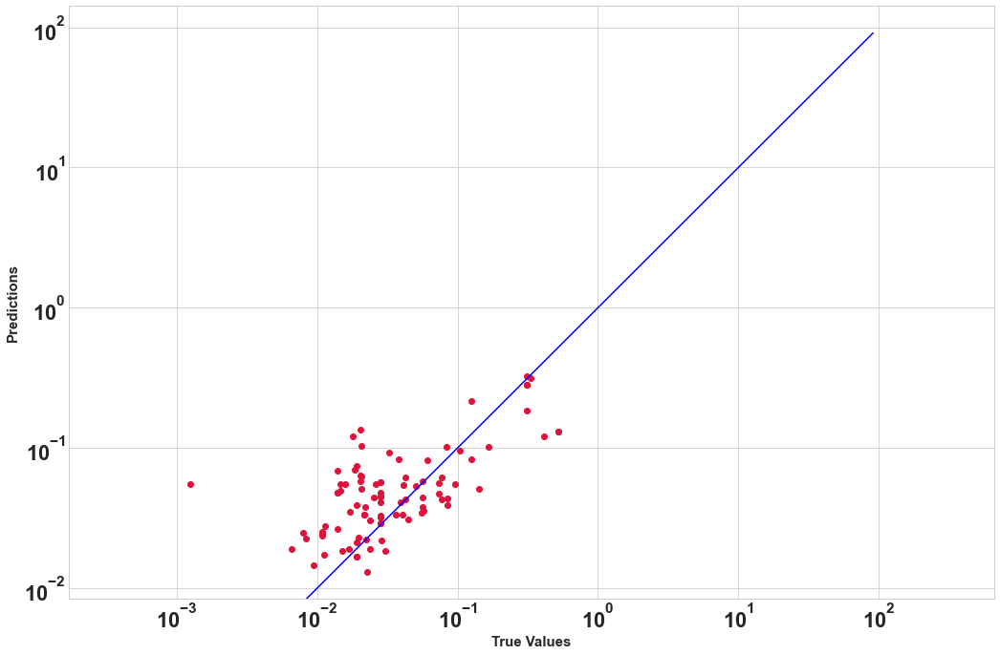

In [53]:
LGBMscores,LGBMpredictions = lgbm_regression_nCV(predictors_s1, target_s1, inner_cv, outer_cv)

In [54]:
LGBMscores

,Set of hyperparameters,Average tuning time,RMSE,MAE,R2
0,"{'max_depth': 53, 'min_child_weight': 3, 'learning_rate': 0.09612502400691866, 'n_estimators': 131, 'subsample': 0.25857254442399225, 'colsample_bytree': 0.6341165897202914, 'reg_alpha': 0.10437713115000473, 'reg_lambda': 0.6017737587351075}",22.47022,0.054821,0.028665,0.692075
1,"{'max_depth': 104, 'min_child_weight': 7, 'learning_rate': 0.16299630349385463, 'n_estimators': 143, 'subsample': 0.15466468126709093, 'colsample_bytree': 0.375853770803387, 'reg_alpha': 0.08543425059748053, 'reg_lambda': 0.904495665738624}",23.121304,0.04414,0.028803,0.757419
2,"{'max_depth': 143, 'min_child_weight': 10, 'learning_rate': 0.6350936938017008, 'n_estimators': 158, 'subsample': 0.74334507014839, 'colsample_bytree': 0.9163098913032327, 'reg_alpha': 0.03204382668901551, 'reg_lambda': 0.7820254576035501}",22.058681,0.110305,0.048185,0.155416
3,"{'max_depth': 5, 'min_child_weight': 5, 'learning_rate': 0.09068335381138354, 'n_estimators': 154, 'subsample': 0.6443769926625985, 'colsample_bytree': 0.4501592388670984, 'reg_alpha': 0.011976175035337822, 'reg_lambda': 0.01917439436886903}",20.262698,0.094241,0.047024,0.495622
4,"{'max_depth': 42, 'min_child_weight': 9, 'learning_rate': 0.03728009251596635, 'n_estimators': 178, 'subsample': 0.1521539766000098, 'colsample_bytree': 0.46160635980329245, 'reg_alpha': 0.6572799031280745, 'reg_lambda': 0.0918306500794068}",17.644024,0.074296,0.036718,0.494108


In [55]:
LGBMscores.mean(axis=0)

C:\Users\nhiii\AppData\Local\Temp\ipykernel_22352\3836383310.py:1: FutureWarning:

Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.



Average tuning time    21.111385
RMSE                    0.075560
MAE                     0.037879
R2                      0.518928
dtype: float64

In [225]:
def objective_LGBM(trial):
    param = {
                    'max_depth': trial.suggest_int('max_depth', 2, 200),
                    'min_child_weight': trial.suggest_int('min_child_weight', 1, 10),
                    'learning_rate': trial.suggest_float('learning_rate', 0.01, 1.0),
                    'n_estimators': trial.suggest_int('n_estimators', 50, 200),
                    'subsample': trial.suggest_float('subsample', 0.01, 1.0),
                    'colsample_bytree': trial.suggest_float('colsample_bytree', 0.01, 1.0),
                    'reg_alpha': trial.suggest_float('reg_alpha', 0.01, 1.0),
                    'reg_lambda': trial.suggest_float('reg_lambda', 0.01, 1.0),
                        }
    model = LGBMRegressor(**param)
    model.fit(predictors_s1, target_s1)
    return abs(np.mean(cross_val_score(model, predictors_s1, target_s1, cv=inner_cv, scoring= 'neg_root_mean_squared_error')))
LGBMstudy = optuna.create_study(direction='minimize', study_name='regression')
LGBMstudy.optimize(objective_LGBM, n_trials=100)
optuna.visualization.plot_optimization_history(LGBMstudy)
#optuna.visualization.plot_param_importances(LGBMstudy)

[I 2023-01-07 17:10:02,070] A new study created in memory with name: regression
[I 2023-01-07 17:10:02,282] Trial 0 finished with value: 0.07794328320711824 and parameters: {'max_depth': 173, 'min_child_weight': 2, 'learning_rate': 0.4657101698131311, 'n_estimators': 170, 'subsample': 0.5816175723662498, 'colsample_bytree': 0.6507425139290125, 'reg_alpha': 0.44798369746913835, 'reg_lambda': 0.9840052596421056}. Best is trial 0 with value: 0.07794328320711824.
[I 2023-01-07 17:10:02,371] Trial 1 finished with value: 0.08497287113097109 and parameters: {'max_depth': 44, 'min_child_weight': 7, 'learning_rate': 0.8359602917260103, 'n_estimators': 112, 'subsample': 0.5799002984943533, 'colsample_bytree': 0.1994529342631342, 'reg_alpha': 0.7060607316824344, 'reg_lambda': 0.3140115880299894}. Best is trial 0 with value: 0.07794328320711824.
[I 2023-01-07 17:10:02,522] Trial 2 finished with value: 0.07666675653001682 and parameters: {'max_depth': 9, 'min_child_weight': 5, 'learning_rate': 0.13

[I 2023-01-07 17:10:05,246] Trial 21 finished with value: 0.07906685932100996 and parameters: {'max_depth': 108, 'min_child_weight': 3, 'learning_rate': 0.42856483883099966, 'n_estimators': 82, 'subsample': 0.716531351777157, 'colsample_bytree': 0.26382410850604093, 'reg_alpha': 0.1472655001444686, 'reg_lambda': 0.38337383070197606}. Best is trial 18 with value: 0.07556593301264458.
[I 2023-01-07 17:10:05,425] Trial 22 finished with value: 0.07657461080448232 and parameters: {'max_depth': 115, 'min_child_weight': 3, 'learning_rate': 0.3556370127030526, 'n_estimators': 85, 'subsample': 0.7214102930614463, 'colsample_bytree': 0.3793064296767746, 'reg_alpha': 0.1309663573665974, 'reg_lambda': 0.5288430958344024}. Best is trial 18 with value: 0.07556593301264458.
[I 2023-01-07 17:10:05,543] Trial 23 finished with value: 0.08047168246795487 and parameters: {'max_depth': 84, 'min_child_weight': 3, 'learning_rate': 0.30803356481010497, 'n_estimators': 50, 'subsample': 0.2916353424263592, 'col

[I 2023-01-07 17:10:08,622] Trial 42 finished with value: 0.0789818515135795 and parameters: {'max_depth': 19, 'min_child_weight': 2, 'learning_rate': 0.037385994639412154, 'n_estimators': 113, 'subsample': 0.671048857719013, 'colsample_bytree': 0.6207194681209438, 'reg_alpha': 0.06155830880643291, 'reg_lambda': 0.09122791782509206}. Best is trial 41 with value: 0.07522902364948642.
[I 2023-01-07 17:10:08,813] Trial 43 finished with value: 0.07624825090154069 and parameters: {'max_depth': 35, 'min_child_weight': 1, 'learning_rate': 0.08619845400009113, 'n_estimators': 106, 'subsample': 0.7924082949651968, 'colsample_bytree': 0.6449910513891831, 'reg_alpha': 0.27144512291431583, 'reg_lambda': 0.2088005427044955}. Best is trial 41 with value: 0.07522902364948642.
[I 2023-01-07 17:10:09,106] Trial 44 finished with value: 0.07413357193621462 and parameters: {'max_depth': 16, 'min_child_weight': 2, 'learning_rate': 0.1546161464763738, 'n_estimators': 130, 'subsample': 0.5948620557181902, 'c

[I 2023-01-07 17:10:15,592] Trial 63 finished with value: 0.07567746704124959 and parameters: {'max_depth': 10, 'min_child_weight': 2, 'learning_rate': 0.28934914468184475, 'n_estimators': 175, 'subsample': 0.5334983592001317, 'colsample_bytree': 0.8088940542173877, 'reg_alpha': 0.04287055421693656, 'reg_lambda': 0.10158523826778178}. Best is trial 46 with value: 0.07344051835408619.
[I 2023-01-07 17:10:15,900] Trial 64 finished with value: 0.07531334428230035 and parameters: {'max_depth': 40, 'min_child_weight': 3, 'learning_rate': 0.17642638448742398, 'n_estimators': 163, 'subsample': 0.664356927730762, 'colsample_bytree': 0.6802041623034141, 'reg_alpha': 0.13799619828530074, 'reg_lambda': 0.04264874437354733}. Best is trial 46 with value: 0.07344051835408619.
[I 2023-01-07 17:10:16,280] Trial 65 finished with value: 0.0762504088762185 and parameters: {'max_depth': 23, 'min_child_weight': 2, 'learning_rate': 0.3342008622439321, 'n_estimators': 193, 'subsample': 0.4829957911384842, 'c

[I 2023-01-07 17:10:22,412] Trial 84 finished with value: 0.07793832047409772 and parameters: {'max_depth': 15, 'min_child_weight': 1, 'learning_rate': 0.03351576057164743, 'n_estimators': 143, 'subsample': 0.9315876764995272, 'colsample_bytree': 0.7902224379501794, 'reg_alpha': 0.032843869039411916, 'reg_lambda': 0.03138893960132954}. Best is trial 46 with value: 0.07344051835408619.
[I 2023-01-07 17:10:22,728] Trial 85 finished with value: 0.07591137798652509 and parameters: {'max_depth': 26, 'min_child_weight': 2, 'learning_rate': 0.10594347148473598, 'n_estimators': 159, 'subsample': 0.7811814619359141, 'colsample_bytree': 0.8495179718631299, 'reg_alpha': 0.0639708709322434, 'reg_lambda': 0.13154924941714488}. Best is trial 46 with value: 0.07344051835408619.
[I 2023-01-07 17:10:23,032] Trial 86 finished with value: 0.07461783325878685 and parameters: {'max_depth': 42, 'min_child_weight': 9, 'learning_rate': 0.14132011203745953, 'n_estimators': 149, 'subsample': 0.7337685822565115,

# 3  Performance evaluation

* Observed performance before tuning:  XGBoost > LGBM > Ridge > LinearRegression > KNeighborsRegressor > SupportVectorRegressor
* Observed performance after optimizing:  XGBoost > LGBM > Ridge > LinearRegression > KNeighborsRegressor > SupportVectorRegressor
* Performances on test set vs on train set? -> draw conclusion on predictions power.
* Evaluate the key features that explain the model

In [56]:
metrics_mean_ = pd.DataFrame({'Baseline Linear Regression': LRscores.mean(axis=0)})
metrics_mean_['Ridge Regression'] = Riscores.mean(axis=0)
metrics_mean_['K-Nearest Neighbors Regressor'] = KNRscores.mean(axis=0)
metrics_mean_['eXtreme Gradient Boost'] = XGBscores.mean(axis=0)
metrics_mean_['Light Gradient Boost Machine'] = LGBMscores.mean(axis=0)
metrics_mean_

C:\Users\nhiii\AppData\Local\Temp\ipykernel_22352\1711826407.py:1: FutureWarning:

Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.

C:\Users\nhiii\AppData\Local\Temp\ipykernel_22352\1711826407.py:2: FutureWarning:

Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.

C:\Users\nhiii\AppData\Local\Temp\ipykernel_22352\1711826407.py:3: FutureWarning:

Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.

C:\Users\nhiii\AppData\Local\Temp\ipykernel_22352\1711826407.py:4: FutureWarning:

Dropping of nuisance columns in DataFrame reductions (with 'numeric_

,Baseline Linear Regression,Ridge Regression,K-Nearest Neighbors Regressor,eXtreme Gradient Boost,Light Gradient Boost Machine
Average tuning time,0.092634,1.393789,7.416750,98.577903,21.111385
RMSE,0.089873,0.083601,0.099549,0.073544,0.075560
MAE,0.048413,0.042909,0.049985,0.036372,0.037879
R2,0.314904,0.416821,0.167414,0.553398,0.518928


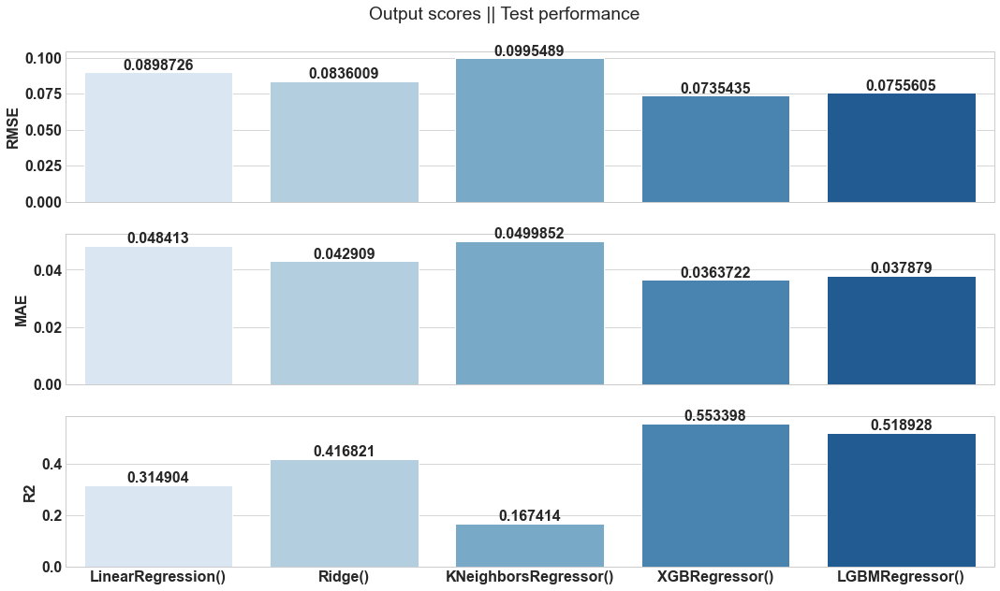

In [264]:
labels_long = ['LinearRegression()', 'Ridge()', 'KNeighborsRegressor()', 'XGBRegressor()', 'LGBMRegressor()']
sns.set_style("whitegrid")
fig, axes = plt.subplots(3,1,figsize=(15,9),sharex=True)
fig.suptitle('Output scores || Test performance')
sns.barplot(x=metrics_mean_.T.index, y='RMSE', data=metrics_mean_.T,ax=axes[0], palette="Blues")
sns.barplot(x=metrics_mean_.T.index, y='MAE', data=metrics_mean_.T, ax=axes[1], palette="Blues")
sns.barplot(x=metrics_mean_.T.index, y='R2', data=metrics_mean_.T, ax=axes[2], palette="Blues")
#sns.barplot(x=metrics_mean_.T.index, y='Average tuning time', data=metrics_mean_.T, ax=axes[3])
axes[0].set_xticklabels(labels = labels_long)
axes[0].bar_label(axes[0].containers[0])
axes[1].set_xticklabels(labels = labels_long)
axes[1].bar_label(axes[1].containers[0])
axes[2].set_xticklabels(labels = labels_long)
axes[2].bar_label(axes[2].containers[0])
#axes[3].set_xticklabels(labels = labels_long)
#axes[3].bar_label(axes[2].containers[0])
#mpl_table = axes[3].table(cellText = np.round(metrics_mean_.values,4), rowLabels = metrics_mean_.index, colLabels=metrics_mean_.columns,  cellLoc = 'center', rowLoc = 'center')
#axes[3].axis('off')
#mpl_table.auto_set_font_size(False)
#mpl_table.set_fontsize(11)

plt.tight_layout()
#plt.close(3)
plt.show()

In [58]:
predictions_std_ = pd.DataFrame({'Baseline Linear Regression': LRpredictions.std(axis=0)})
predictions_std_['Ridge Regression'] = Ripredictions.std(axis=0)
predictions_std_['K-Nearest Neighbors Regressor'] = KNRpredictions.std(axis=0)
predictions_std_['eXtreme Gradient Boost'] = XGBpredictions.std(axis=0)
predictions_std_['Light Gradient Boost Machine'] = LGBMpredictions.std(axis=0)
predictions_std_.T

,0,1,2,3,4
Baseline Linear Regression,0.072128,0.097428,0.104203,0.099787,0.114202
Ridge Regression,0.065944,0.088451,0.079614,0.087835,0.093314
K-Nearest Neighbors Regressor,0.052278,0.053129,0.056436,0.048928,0.061286
eXtreme Gradient Boost,0.059792,0.080738,0.079485,0.085951,0.072139
Light Gradient Boost Machine,0.067035,0.086404,0.083276,0.092289,0.062456


In [59]:
predictions_ = pd.DataFrame({'Baseline Linear Regression': LRpredictions.mean(axis=1)})
predictions_['Ridge Regression'] = Ripredictions.mean(axis=1)
predictions_['K-Nearest Neighbors Regressor'] = KNRpredictions.mean(axis=1)
predictions_['eXtreme Gradient Boost'] = XGBpredictions.mean(axis=1)
predictions_['Light Gradient Boost Machine'] = LGBMpredictions.mean(axis=1)
predictions_

,Baseline Linear Regression,Ridge Regression,K-Nearest Neighbors Regressor,eXtreme Gradient Boost,Light Gradient Boost Machine
0,0.056896,0.059796,0.042857,0.045996,0.058837
1,0.038524,0.033689,0.040432,0.032794,0.025362
2,0.063417,0.060125,0.042035,0.088389,0.094572
3,0.003848,0.021667,0.035216,0.031060,0.022048
4,0.041399,0.031014,0.023106,0.050752,0.026038
...,...,...,...,...,...
87,0.145962,0.131655,0.117206,0.134454,0.131651
88,0.083615,0.078551,0.105472,0.090437,0.066567
89,0.228333,0.197578,0.190682,0.191529,0.225000
90,0.122250,0.153854,0.165261,0.100142,0.115747


(array([1, 2, 3, 4, 5]),
 [Text(1, 0, 'Baseline Linear Regression'),
  Text(2, 0, 'Ridge Regression'),
  Text(3, 0, 'K-Nearest Neighbors Regressor'),
  Text(4, 0, 'eXtreme Gradient Boost'),
  Text(5, 0, 'Light Gradient Boost Machine')])

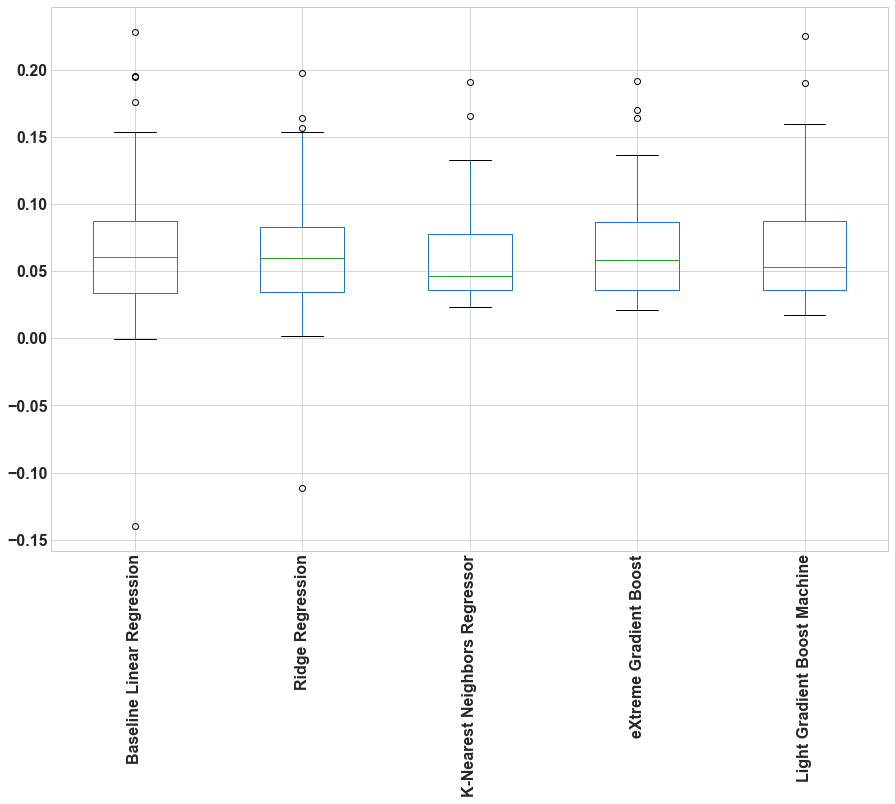

In [66]:
plt.rcParams.update({'font.size':16})
predictions_.boxplot()
plt.xticks(rotation = 90)

<b> Statistical testing for model comparison </b> Models are run on the same dataset.
* <b> ANOVA Hypothesis Testing </b> (comparison between more than two groups)
  - H0: There is no difference in the mean predictions produced by the five different models above
  - H1: There is difference in the mean predictions produced by the five different models above
* <b> Pairwise t-test Hypothesis Testing </b> (comparison between two groups)
  - H0: There is no difference in the mean predictions produced by the two regression models XGB and LGB
  - H1: There is difference in the mean predictions produced by the two regression models XGB and LGB

In [61]:
pg.rm_anova(predictions_)

C:\Users\nhiii\anaconda3\lib\site-packages\pingouin\distribution.py:977: RuntimeWarning:

divide by zero encountered in double_scalars



,Source,ddof1,ddof2,F,p-unc,ng2,eps
0,Within,4,364,1.933259,0.104318,0.003961,0.555129


In [62]:
stats.ttest_rel(predictions_.iloc[:,-1], predictions_.iloc[:,-2])

Ttest_relResult(statistic=-0.3220697834737803, pvalue=0.7481385350977192)

# 4  Model explanation

In [195]:
BestModel = LGBMscores[LGBMscores.RMSE == LGBMscores['RMSE'].min()]
BestModel 

,Set of hyperparameters,Average tuning time,RMSE,MAE,R2
1,"{'max_depth': 104, 'min_child_weight': 7, 'learning_rate': 0.16299630349385463, 'n_estimators': 143, 'subsample': 0.15466468126709093, 'colsample_bytree': 0.375853770803387, 'reg_alpha': 0.08543425059748053, 'reg_lambda': 0.904495665738624}",23.121304,0.04414,0.028803,0.757419


In [199]:
LGBMBest_estimators = BestModel.iloc[0,0]
LGBMBest_estimators

{'max_depth': 104,
 'min_child_weight': 7,
 'learning_rate': 0.16299630349385463,
 'n_estimators': 143,
 'subsample': 0.15466468126709093,
 'colsample_bytree': 0.375853770803387,
 'reg_alpha': 0.08543425059748053,
 'reg_lambda': 0.904495665738624}

In [200]:
LGBMR = LGBMRegressor().set_params(**LGBMBest_estimators)
BestModel = LGBMR.fit(predictors_s1, target_s1)

In [201]:
# SHAPley values 

import shap

# Create a tree explainer
explainer = shap.TreeExplainer(BestModel, predictors_s1, feature_names=predictors_s1.columns.tolist())

# Shap values with tree explainer
shap_values = explainer.shap_values(predictors_s1, target_s1)

# Shap values with XGBoost core model
#booster = BestModel.get_booster()
#shap_values = booster.predict(xgb.DMatrix(predictors_s1, target_s1), pred_contribs=True)

shap_values.shape

(460, 116)

In [202]:
# SHAPley values 

import shap

# Create a tree explainer
explainer = shap.TreeExplainer(BestModel, predictors_s1, feature_names=predictors_s1.columns.tolist())

# Shap values with tree explainer
shap_values = explainer.shap_values(predictors_s1, target_s1)

# Shap values with XGBoost core model
#booster = BestModel.get_booster()
#shap_values = booster.predict(xgb.DMatrix(predictors_s1, target_s1), pred_contribs=True)

shap_values.shape

(460, 116)

In [203]:
col_names = list(x.columns)
feat_col_names = col_names[1:]

In [204]:
predictors_s1.columns = feat_col_names
shap_values = shap_values[:, :]
pd.DataFrame(shap_values, columns=predictors_s1.columns.tolist()).head()

,ESG Score,Environmental Pillar Score,Social Pillar Score,Governance Pillar Score,Return On Asset,Total Debt to Asset,Coupon,Maturity Length (Days),Domestic,Eurobond,...,A1+,A3,AA-,BB,BB+,BB-,BBB,BBB+,Ba3,Caa3
0,-0.005098,-0.005321,-0.016245,-0.011696,-0.000197,-0.005750,-0.009812,-0.006424,-0.005078,0.0,...,0.0,0.0,-0.000936,-0.000092,0.0,0.0,0.005806,0.0,0.0,0.0
1,-0.011025,-0.003998,-0.020221,-0.000373,-0.008991,-0.027427,-0.027683,-0.008082,-0.003827,0.0,...,0.0,0.0,-0.001347,-0.000081,0.0,0.0,0.008270,0.0,0.0,0.0
2,0.001034,-0.011075,-0.004034,-0.018571,-0.015651,0.011723,-0.011592,-0.001475,-0.004697,0.0,...,0.0,0.0,0.004866,-0.000092,0.0,0.0,-0.002718,0.0,0.0,0.0
3,0.000190,0.005620,-0.001153,-0.006064,0.001784,-0.000067,0.049470,-0.002292,-0.004032,0.0,...,0.0,0.0,-0.000973,-0.000092,0.0,0.0,0.005613,0.0,0.0,0.0
4,-0.004697,-0.009317,-0.010078,-0.010121,0.021956,-0.016757,-0.005942,-0.003509,-0.003457,0.0,...,0.0,0.0,-0.001012,-0.000268,0.0,0.0,-0.002435,0.0,0.0,0.0


In [205]:
shap_sum = np.abs(shap_values).mean(axis=0)
importance_df = pd.DataFrame([predictors_s1.columns.tolist(), shap_sum.tolist()]).T
importance_df.columns = ['features', 'shap_importance']
importance_df = importance_df.sort_values('shap_importance', ascending=False)
importance_df

,features,shap_importance
90,Euro,0.021888
6,Coupon,0.014369
3,Governance Pillar Score,0.014157
5,Total Debt to Asset,0.012729
2,Social Pillar Score,0.009806
...,...,...
44,Gas Utility,0.0
43,Food Processors,0.0
42,Financial,0.0
40,Conglomerate,0.0


<b> Feature importance </b>

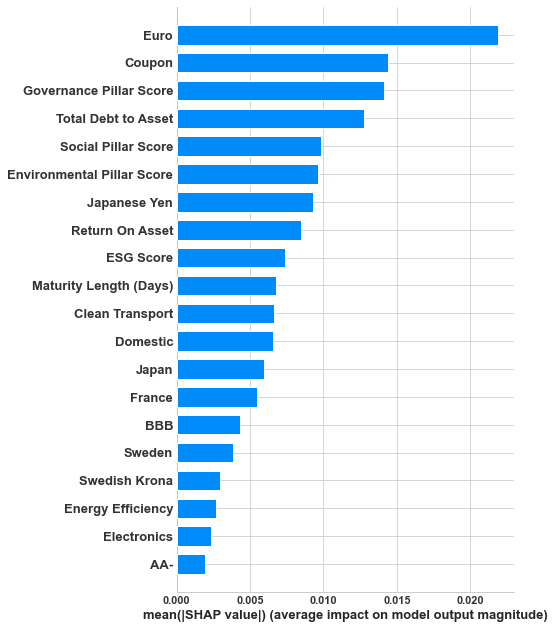

In [206]:
shap.summary_plot(shap_values, predictors_s1, plot_type="bar")

<b> Summary Plot </b>

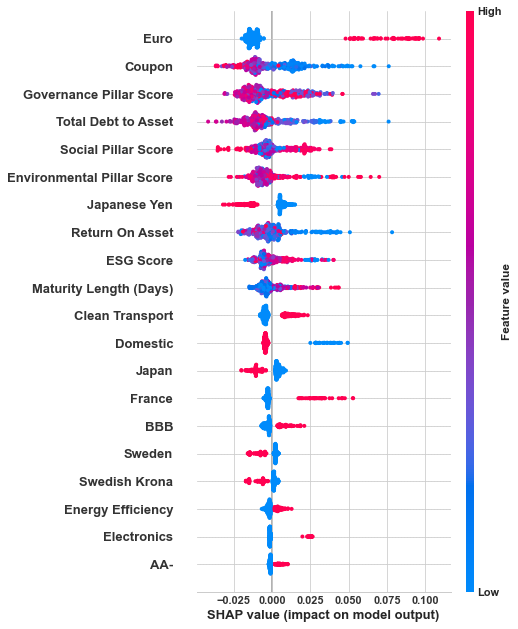

In [207]:
plt.figure(figsize=(25,40))
shap.summary_plot(shap_values, predictors_s1, feature_names=predictors_s1.columns)
plt.show()

<b> Dependence plot </b>

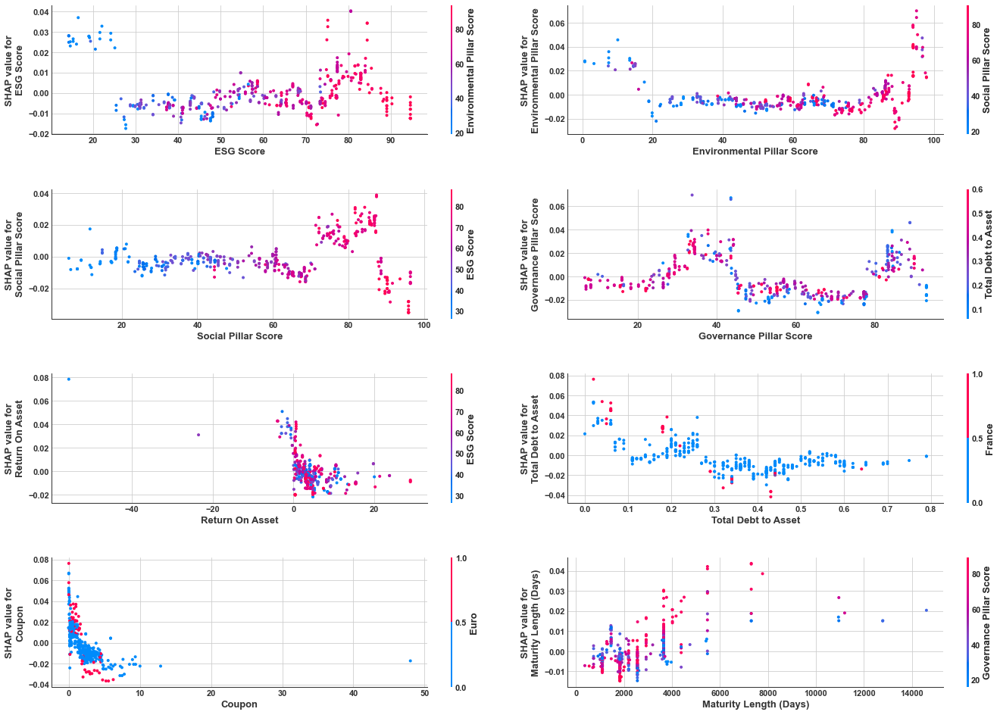

In [236]:
# adjust nrows, ncols to fit all your columns
plt.rcParams.update({'font.size': 36})
columns = predictors_s1.columns[:8]

# adjust nrows, ncols to fit all your columns
fig, axes = plt.subplots(nrows=4, ncols=2, figsize=(20, 14))
axes = axes.ravel()

for i, col in enumerate(columns):
    shap.dependence_plot(col, shap_values, predictors_s1, ax=axes[i], show=False, interaction_index="auto")
    
plt.tight_layout()
plt.show()

<b> Decision plot </b>

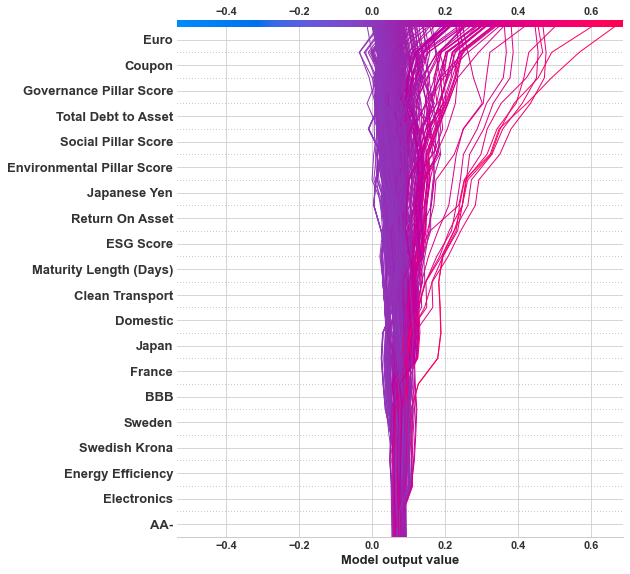

In [209]:
shap.decision_plot(explainer.expected_value, shap_values, predictors_s1.columns, highlight=0)